In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from metpy.units import units
from scipy import stats

In [2]:
#Bring in all of VDB's manually-calculated data
vdb_stormA = np.asarray([130.46,104.34,105.76,135.81,130.05,52.13,66.3,63.46,33.83,49.57,41.15,27.55,15.49,8.18])
vdb_stormB = np.asarray([186.12, 133.08, 156.22, 160.69, 178.12, 167.98, 204.83, 195.44, 182.71, 234.54, 201.44, 154.92, 153.6, 115.24, 191.55, 143.11, 166.38, 176.68, 125.52])
vdb_stormBB = np.asarray([119.52,84.32,108.37,124.45,117.46,196.73,262.61,285.17,239.73,206.06,145.86,118.35,132.48,125.14,206.08,156.97,154.5,138.75,89.14,59.32,15.74])
vdb_stormC = np.asarray([7.362,6.197,1.859,2.327,3.889,4.46,3.825,2.82,2.51,1.53,1.924,1.77,1.858,1.042,1.37,1.168])
vdb_stormCC = np.asarray([147.88,163.78,100.42,90.03,89.54,88.84,94.95,108.43,104.85,72.55,93.79])
vdb_stormD = np.asarray([38.2,41.38,44.42,47.62,34.88,31.69,30.14])
vdb_stormDD = np.asarray([78.41,62.49,45.86,76.14,115.2,81.08,57.52,56.73])
vdb_stormE = np.asarray([0.15,0.13,0,4.12,7.8,9.5,4.06,1.7,1.6,0.7,0.6,0.5])
#vdb_stormEE = np.asarray([99,119.65,131.16,142.87,120.94,111.79,113.96,134.34,109.89,87.37,97.69,NA,114.28])
#Remove the NA time for EE and be sure to remove it in the algorithm time series as well
vdb_stormEE = np.asarray([99,119.65,131.16,142.87,120.94,111.79,113.96,134.34,109.89,87.37,97.69,114.28])
vdb_stormF = np.asarray([2.74,1.25,2.26,0.5,12.72,28.66,7.46,2.93,9.21,10.69,4.54,5.39])
vdb_stormFF = np.asarray([81.68,124.6,120.02,145.05,115.5,130.26,147.92,169.09,178.95,175.28])
vdb_stormG = np.asarray([0,0,8.08,5,5,7.75,16.3])
vdb_stormGG = np.asarray([2.88,1.15,1.2,2.3,2.88,1.38,1.15,1.73,4.37])
vdb_stormH = np.asarray([0,0.79,1.88,3.23,5.55,27.7,3.33,51.78,34.5,17.15,83.09,121.56])
vdb_stormHH = np.asarray([20.94,17.29,22.1,16.23,40,28.1,43.63,41.27,45.15,48.26,34.79,24.67,48.72,39.73,40.96,36.03])
vdb_stormI = np.asarray([43.26,46.22,98.36,81.86,85.85,39.83,82.26,78.35,104.3,88.5,67.28,78.34,88.92,56.66,26.84,59.56])
vdb_stormII = np.asarray([89.01,191.65,130.27,157.23,159.47,243.59,140.71,128.68,21.41,28.41,33.43,44.21,58.5,57.55,54.16,51.21,42.01,15.34,21.08,5.24,3.25])
vdb_stormJ = np.asarray([80.01,127.74,57.44,68.07,141.57,126.59,104.06,67.42,138.28,141.9,87.71,89.86,115.34,64.72,70.47,52.64])
vdb_stormK = np.asarray([8.5,6.37,27.41,4.75,21.77,35.52,11.68,12.21,40.75,22.91])
vdb_stormL = np.asarray([19.05,42.85,6.36,13.04,26.74,6.19,4.35,2.43,2.71,1.35,0,0,0,0.81,0])
vdb_stormM = np.asarray([68.09,35.68,44.62,94.42,74.96])
vdb_stormO = np.asarray([86.72,151.36,79.97,126.18,147.45,104.9,62.93,56.438,75.037])
vdb_stormR = np.asarray([40.83,125.09,61.05,44.9,26.23,50.48,72.08,94.54,65.6,75.28,36.18,72.97])
vdb_stormS = np.asarray([48.14,67.24,55.68,75.72,73.28,71.18,59.76,52.33,12.06,7.8,0.68,0,0])
vdb_stormW = np.asarray([126.08,186.44,236.01,193.09,141.2,116.03,110.89,85.11,102.57,77.64,85.84,27.26,32.52,77.59,94.62,143.23,130.51])
vdb_stormX = np.asarray([9.57,14.21,77.21,74.88,70.64,73.41,84.36,85.48,60.28])
vdb_stormY = np.asarray([0.76,10.69,16.03,19.04,6.67,11.16,19.34,16.83,16.39,9.67,18.06,8.47,2.63])
vdb_stormZ = np.asarray([48.28,66.82,74.44,91.57,74.5,60.87,60.57,70.01,51.32,62,84.5])
#vdb_stormL = np.asarray([])

In [3]:
saved_tracks_A = pd.read_pickle('CI_Pickles/NC_TR_TOR2013831KBIS.pkl')
saved_tracks_B = pd.read_pickle('CI_Pickles/NC_TR_TOR2013417KFDR.pkl')
saved_tracks_BB = pd.read_pickle('CI_Pickles/NC_TR_TOR2013520KINX.pkl')
saved_tracks_C = pd.read_pickle('CI_Pickles/NC_TR_TOR20131220KDGX.pkl')
saved_tracks_CC = pd.read_pickle('CI_Pickles/NC_TR_TOR2013619KLBB.pkl')
saved_tracks_D = pd.read_pickle('CI_Pickles/NC_TR_TOR201233KFFC.pkl')
saved_tracks_DD = pd.read_pickle('CI_Pickles/NC_TR_TOR20131117KLOT.pkl')
saved_tracks_E = pd.read_pickle('CI_Pickles/NC_TR_TOR2013828KDTX.pkl')#No arc detected, so not rerun
saved_tracks_EE = pd.read_pickle('CI_Pickles/NC_TR_TOR201269KMQT.pkl')
saved_tracks_F = pd.read_pickle('CI_Pickles/NC_TR_TOR201232KHTX.pkl')
saved_tracks_FF = pd.read_pickle('CI_Pickles/NC_TR_TOR2012426KOHX.pkl')
saved_tracks_GG = pd.read_pickle('CI_Pickles/NC_TR_TOR2013618KRAX.pkl')
saved_tracks_H = pd.read_pickle('CI_Pickles/NC_TR_TOR2013520KEAX.pkl')
saved_tracks_HH = pd.read_pickle('CI_Pickles/NC_TR_TOR2013331KSRX.pkl')
saved_tracks_I = pd.read_pickle('CI_Pickles/NC_TR_TOR2013318KFFC.pkl')
saved_tracks_II = pd.read_pickle('CI_Pickles/NC_TR_TOR2013531KTLX.pkl')
saved_tracks_J = pd.read_pickle('CI_Pickles/NC_TR_TOR2012430KDDC.pkl')
saved_tracks_K = pd.read_pickle('CI_Pickles/NC_TR_TOR2012510KEWX.pkl')
saved_tracks_L = pd.read_pickle('CI_Pickles/NC_TR_TOR20131117KHPX.pkl')#Rerun with 22:14 included
saved_tracks_M = pd.read_pickle('CI_Pickles/NC_TR_TOR2013218KSHV.pkl')
saved_tracks_O = pd.read_pickle('CI_Pickles/NC_TR_TOR2012415KTWX.pkl')
saved_tracks_R = pd.read_pickle('CI_Pickles/NC_TR_TOR2013515KFWS.pkl')
saved_tracks_S = pd.read_pickle('CI_Pickles/NC_TR_TOR20131117KIND.pkl')#Rerun with extra storm
saved_tracks_W = pd.read_pickle('CI_Pickles/NC_TR_TOR2013814KAMA.pkl')
saved_tracks_X = pd.read_pickle('CI_Pickles/NC_TR_TOR201355KJAX.pkl')
saved_tracks_Y = pd.read_pickle('CI_Pickles/NC_TR_TOR20131117KVWX.pkl')
saved_tracks_Z = pd.read_pickle('CI_Pickles/NC_TR_TOR2013531KINX.pkl')
print(saved_tracks_BB)

               kdp_zdr_angle  kdp_zdr_sep  storm_id1  storm_lat  storm_lon  \
scan storm_id                                                                
0    0              0.000000     0.000000          0  36.008672 -96.920649   
     1              0.000000     0.000000          1  37.258500 -95.975150   
     2            -60.827634     9.897869          2  36.408260 -96.282212   
     3              0.000000     0.000000          3  37.021483 -96.071353   
     4              0.000000     0.000000          4  37.074374 -96.180318   
1    0              0.000000     0.000000          0  36.024751 -96.900873   
     1              0.000000     0.000000          1  37.259780 -95.944531   
     5                   NaN     0.000000          5  36.114713 -96.765066   
     2            -45.724383     8.303436          2  36.433110 -96.243797   
     3             -9.575313     3.898799          3  37.045654 -96.028423   
     4              0.000000     0.000000          4  37.113568 

In [4]:
arc_var = 'zdr_area'

stormA = saved_tracks_A.xs(1, level=1)
stormA_alg_f = np.asarray(stormA[arc_var].iloc[:])
stormA_alg = stormA_alg_f[0:14]
stormA_times_f = np.asarray(stormA['times'].iloc[:])
stormA_times = stormA_times_f[0:14]


stormB = saved_tracks_B.xs(2, level=1)
stormB_alg_f = np.asarray(stormB[arc_var].iloc[:])
stormB_alg = stormB_alg_f[5:24]
stormB_times_f = np.asarray(stormB['times'].iloc[:])
stormB_times = stormB_times_f[5:24]

stormBB = saved_tracks_BB.xs(2, level=1)
stormBB_alg_f = np.asarray(stormBB[arc_var].iloc[:])
stormBB_alg = stormBB_alg_f[1:22]
stormBB_times_f = np.asarray(stormBB['times'].iloc[:])
stormBB_times = stormBB_times_f[1:22]

stormC = saved_tracks_C.xs(0, level=1)
stormC_alg_f = np.asarray(stormC[arc_var].iloc[:])
stormC_alg = stormC_alg_f[1:17]
stormC_times_f = np.asarray(stormC['times'].iloc[:])
stormC_times = stormC_times_f[1:17]

stormCC = saved_tracks_CC.xs(0, level=1)
stormCC_alg_f = np.asarray(stormCC[arc_var].iloc[:])
stormCC_times_f = np.asarray(stormCC['times'].iloc[:])
stormCC_alg = stormCC_alg_f[1:12]
stormCC_times = stormCC_times_f[1:12]

stormD = saved_tracks_D.xs(2, level=1)
stormD_alg_f = np.asarray(stormD[arc_var].iloc[:])
stormD_times_f = np.asarray(stormD['times'].iloc[:])
stormD_algi = stormD_alg_f[3:11]
stormD_timesi = stormD_times_f[3:11]
#Since VDB's time series is missing 1:46, remove it from the algorithm array
stormD_alg = np.delete(stormD_algi, 3)
stormD_times = np.delete(stormD_timesi, 3)

stormDD = saved_tracks_DD.xs(4, level=1)
stormDD_alg_f = np.asarray(stormDD[arc_var].iloc[:])
stormDD_times_f = np.asarray(stormDD['times'].iloc[:])
stormDD_alg = stormDD_alg_f[1:9]
stormDD_times = stormDD_times_f[1:9]

stormE = saved_tracks_E.xs(0, level=1)
stormE_alg_f = np.asarray(stormE[arc_var].iloc[:])
stormE_times_f = np.asarray(stormE['times'].iloc[:])
stormE_algi = stormE_alg_f[1:15]
stormE_timesi = stormE_times_f[1:15]
count = np.unique(stormE_timesi, return_index=True, return_inverse=True, return_counts=True)[3]
return_inds = np.unique(stormE_timesi, return_index=True, return_inverse=True, return_counts=True)[1]
stormE_alg = stormE_algi[return_inds]
stormE_alg[np.where(count>1)]=stormE_alg[np.where(count>1)]+stormE_algi[return_inds[np.where(count>1)]+1]
stormE_times = stormE_timesi[return_inds]

stormEE = saved_tracks_EE.xs(6, level=1)
stormEE_alg_f = np.asarray(stormEE[arc_var].iloc[:])
stormEE_times_f = np.asarray(stormEE['times'].iloc[:])
stormEE_algi = stormEE_alg_f[0:13]
stormEE_timesi = stormEE_times_f[0:13]
count = np.unique(stormEE_timesi, return_index=True, return_inverse=True, return_counts=True)[3]
return_inds = np.unique(stormEE_timesi, return_index=True, return_inverse=True, return_counts=True)[1]
stormEE_alg = stormEE_algi[return_inds]
stormEE_alg[np.where(count>1)]=stormEE_alg[np.where(count>1)]+stormEE_algi[return_inds[np.where(count>1)]+1]
stormEE_times = stormEE_timesi[return_inds]
#Remove the second to last frame, since manual data is not available to compare it with
stormEE_alg_c = np.delete(stormEE_alg, 10)
stormEE_times_c = np.delete(stormEE_times, 10)

#Fixing problems with spurious storm objects by consolidating them
stormF = saved_tracks_F.xs(2, level=1)
stormF_alg_f = np.asarray(stormF[arc_var].iloc[:])
storm_times_f = np.asarray(stormF['times'].iloc[:])
stormF_algi = stormF_alg_f[3:18]
stormF_timesi = storm_times_f[3:18]
#print(np.shape(vdb_stormF))
#print(stormF_alg.shape)
#print(stormF_times)
#print(np.unique(stormF_times, return_index=True, return_inverse=True, return_counts=True))
#print(np.unique(stormF_times).shape)
count = np.unique(stormF_timesi, return_index=True, return_inverse=True, return_counts=True)[3]
return_inds = np.unique(stormF_timesi, return_index=True, return_inverse=True, return_counts=True)[1]
#print(count)
#print(np.where(count>1))
#print(return_inds[np.where(count>1)]+1)
stormF_alg = stormF_algi[return_inds]
#print(stormF_alg)
#print(stormF_algi)
#print(stormF_alg[np.where(count>1)])
stormF_alg[np.where(count>1)]=stormF_alg[np.where(count>1)]+stormF_algi[return_inds[np.where(count>1)]+1]
stormF_times = stormF_timesi[return_inds]
#print(stormF_alg)

stormFF = saved_tracks_FF.xs(1, level=1)
stormFF_alg_f = np.asarray(stormFF[arc_var].iloc[:])
stormFF_alg = stormFF_alg_f[1:11]
stormFF_times_f = np.asarray(stormFF['times'].iloc[:])
stormFF_times = stormFF_times_f[1:11]
#Since the AWS dataset is missing the frame before 00Z, remove that from the manual time series
vdb_stormFF_c = vdb_stormFF

#Storm G also is included in the saved_tracksF file
stormG = saved_tracks_F.xs(5, level=1)
stormG_alg_f = np.asarray(stormG[arc_var].iloc[:])
storm_times_G = np.asarray(stormG['times'].iloc[:])
stormG_alg = stormG_alg_f[8:15]
stormG_times = storm_times_G[8:15]

stormGG = saved_tracks_GG.xs(0, level=1)
stormGG_alg_f = np.asarray(stormGG[arc_var].iloc[:])
stormGG_alg = stormGG_alg_f[0:9]
stormGG_times_f = np.asarray(stormGG['times'].iloc[:])
stormGG_times = stormGG_times_f[0:9]

stormH = saved_tracks_H.xs(6, level=1)
stormH_alg_f = np.asarray(stormH[arc_var].iloc[:])
stormH_alg = stormH_alg_f[0:12]
stormH_times_f = np.asarray(stormH['times'].iloc[:])
stormH_times = stormH_times_f[0:12]

stormHH = saved_tracks_HH.xs(0, level=1)
stormHH_alg_f = np.asarray(stormHH[arc_var].iloc[:])
stormHH_alg = stormHH_alg_f[1:17]
stormHH_times_f = np.asarray(stormHH['times'].iloc[:])
stormHH_times = stormHH_times_f[1:17]


stormI = saved_tracks_I.xs(5, level=1)
stormI_alg_f = np.asarray(stormI[arc_var].iloc[:])
stormI_times_f = np.asarray(stormI['times'].iloc[:])
stormI_algi = stormI_alg_f[0:17]
stormI_timesi = stormI_times_f[0:17]
count = np.unique(stormI_timesi, return_index=True, return_inverse=True, return_counts=True)[3]
return_inds = np.unique(stormI_timesi, return_index=True, return_inverse=True, return_counts=True)[1]
stormI_alg = stormI_algi[return_inds]
stormI_alg[np.where(count>1)]=stormI_alg[np.where(count>1)]+stormI_algi[return_inds[np.where(count>1)]+1]
stormI_times = stormI_timesi[return_inds]

stormII = saved_tracks_II.xs(3, level=1)
stormII_alg_f = np.asarray(stormII[arc_var].iloc[:])
stormII_times_f = np.asarray(stormII['times'].iloc[:])
stormII_algi = stormII_alg_f[2:24]
stormII_timesi = stormII_times_f[2:24]
count = np.unique(stormII_timesi, return_index=True, return_inverse=True, return_counts=True)[3]
return_inds = np.unique(stormII_timesi, return_index=True, return_inverse=True, return_counts=True)[1]
stormII_alg = stormII_algi[return_inds]
stormII_alg[np.where(count>1)]=stormII_alg[np.where(count>1)]+stormII_algi[return_inds[np.where(count>1)]+1]
stormII_times = stormII_timesi[return_inds]
vdb_stormII_c = vdb_stormII

stormJ = saved_tracks_J.xs(1, level=1)
stormJ_alg_f = np.asarray(stormJ[arc_var].iloc[:])
stormJ_alg = stormJ_alg_f[1:17]
stormJ_times_f = np.asarray(stormJ['times'].iloc[:])
stormJ_times = stormJ_times_f[1:17]

stormK = saved_tracks_K.xs(2, level=1)
stormK_alg_f = np.asarray(stormK[arc_var].iloc[:])
stormK_alg = stormK_alg_f[0:10]
stormK_times_f = np.asarray(stormK['times'].iloc[:])
stormK_times = stormK_times_f[0:10]

stormL = saved_tracks_L.xs(1, level=1)
stormL_alg_f = np.asarray(stormL[arc_var].iloc[:])
stormL_alg = stormL_alg_f[1:16]
stormL_times_f = np.asarray(stormL['times'].iloc[:])
stormL_times = stormL_times_f[1:16]

stormM = saved_tracks_M.xs(0, level=1)
stormM_alg_f = np.asarray(stormM[arc_var].iloc[:])
stormM_alg = stormM_alg_f[13:17]
stormM_times_f = np.asarray(stormM['times'].iloc[:])
stormM_times = stormM_times_f[13:17]

stormO = saved_tracks_O.xs(1, level=1)
stormO_alg_f = np.asarray(stormO[arc_var].iloc[:])
stormO_alg = stormO_alg_f[21:30]
stormO_times_f = np.asarray(stormO['times'].iloc[:])
stormO_times = stormO_times_f[21:30]

stormR = saved_tracks_R.xs(2, level=1)
stormR_alg_f = np.asarray(stormR[arc_var].iloc[:])
stormR_alg = stormR_alg_f[7:19]
stormR_times_f = np.asarray(stormR['times'].iloc[:])
stormR_times = stormR_times_f[7:19]
vdb_stormR_c = vdb_stormR

stormS = saved_tracks_S.xs(8, level=1)
stormS_alg_f = np.asarray(stormS[arc_var].iloc[:])
stormS_times_f = np.asarray(stormS['times'].iloc[:])
stormS_algi = stormS_alg_f[:]
stormS_timesi = stormS_times_f[:]
count = np.unique(stormS_timesi, return_index=True, return_inverse=True, return_counts=True)[3]
return_inds = np.unique(stormS_timesi, return_index=True, return_inverse=True, return_counts=True)[1]
stormS_alg1 = stormS_algi[return_inds]
stormS_alg1[np.where(count>1)]=stormS_alg1[np.where(count>1)]+stormS_algi[return_inds[np.where(count>1)]+1]
stormS_times1 = stormS_timesi[return_inds][:]
#Since we have to merge two cell tracks, start with a zero array
stormS_alg = np.zeros((np.shape(vdb_stormS)))
#stormS_times3 = np.zeros((np.shape(vdb_stormS)))
stormS_times3 = []
stormS_alg[0:11] = stormS_alg1
stormS_times3.append(stormS_times1)
#Get the second storm ID (storm 49)
stormS2 = saved_tracks_S.xs(49, level=1)
stormS_alg[11:] = np.asarray(stormS2[arc_var].iloc[:])[0:2]
stormS_times3.append(np.asarray(stormS2['times'].iloc[:])[0:2])
#stormS_times = np.asarray([stormS_times1, np.asarray(stormS2['times'].iloc[:])[0:2]])

stormW = saved_tracks_W.xs(0, level=1)
stormW_alg_f = np.asarray(stormW[arc_var].iloc[:])
stormW_alg = stormW_alg_f[6:23]
stormW_times_f = np.asarray(stormW['times'].iloc[:])
stormW_times = stormW_times_f[6:23]
vdb_stormW_c = vdb_stormW

stormX = saved_tracks_X.xs(0, level=1)
stormX_alg_f = np.asarray(stormX[arc_var].iloc[:])
stormX_alg = stormX_alg_f[1:10]
stormX_times_f = np.asarray(stormX['times'].iloc[:])
stormX_times = stormX_times_f[1:10]

stormY = saved_tracks_Y.xs(1, level=1)
stormY_alg_f = np.asarray(stormY[arc_var].iloc[:])
stormY_alg = stormY_alg_f[0:13]
stormY_times_f = np.asarray(stormY['times'].iloc[:])
stormY_times = stormY_times_f[0:13]

stormZ = saved_tracks_Z.xs(1, level=1)
stormZ_alg_f = np.asarray(stormZ[arc_var].iloc[:])
stormZ_alg = stormZ_alg_f[0:11]
stormZ_times_f = np.asarray(stormZ['times'].iloc[:])
stormZ_times = stormZ_times_f[0:11]
print(stormFF_alg)
#print(stormFF_alg_c.shape)
#print(vdb_stormEE.shape)
#print(vdb_stormW_c.shape)
#print(stormEE_times)
#vdb_stormII_c = np.delete(vdb_stormII, 10)
#print(vdb_stormII_c)

[ 36.29989307  63.87901843  96.75455173  93.69312612  49.14660772
  69.5404479   50.56014924  88.50059452  88.822871    60.02357854]


In [5]:
print((stormR_times))
print(len(vdb_stormB))

['2013-05-15T23:32:22.946000000' '2013-05-15T23:36:40.243000000'
 '2013-05-15T23:40:57.694000000' '2013-05-15T23:45:14.842000000'
 '2013-05-15T23:49:31.797000000' '2013-05-15T23:53:48.476000000'
 '2013-05-15T23:58:05.546000000' '2013-05-16T00:02:22.786000000'
 '2013-05-16T00:06:40.033000000' '2013-05-16T00:10:57.310000000'
 '2013-05-16T00:15:14.579000000' '2013-05-16T00:19:31.902000000']
19


In [6]:
#Nontornadic manual data
vdb_storm1 = np.asarray([58.72,102.13,137.21,117.57,108.71,75.89,99.49,95.06,70.09,52.18,58.18,81.61])
vdb_storm2 = np.asarray([164.53,130.75,144.07,118.51,104.05,160.6])
vdb_storm3 = np.asarray([85.42,84.7,59.87,100.7,51.27,110.8,60.61,62.93,79.79,53.8,46.46])
vdb_storm4 = np.asarray([26.84,27.25,26.15,19.43])
vdb_storm5 = np.asarray([101.38,62.31,94.74,143.09,128.09,140.47,134.07,182.5,103.68])
vdb_storm6 = np.asarray([115.35,189.9,162.84,153.04,135.35,85.72,106.9,95.78,112.77,103.98])
vdb_storm7 = np.asarray([11.36,3.53,10.83,26.3,31.33,3.24,21.08,23.67,11.36,24.45,20.19,47.78,49.75,8.15,53.86,23.94])
vdb_storm10 = np.asarray([3,58.87,65.22,104.19,40.81,61.24,41.85])
vdb_storm13 = np.asarray([72.42,37.75,54.41,47.78,16.8,17.66,40.41,33.03,41.09,37.28,29.09])
vdb_storm14 = np.asarray([66.99,95.89,74.03,47.81,58.65,124.47,135.07,54.64,67.6,108.38])
vdb_storm15 = np.asarray([5,7,5,5,4,2,5.47,1.6])
vdb_storm16 = np.asarray([44.7,62.51,50,42.77,55.29,27.41,32.32,28.86,41.62,33.82,63.64,83.99,118.16,90.96,98.81,94.42])
vdb_storm19 = np.asarray([37.33,80.71,47.94,76.48,96.89,97.46,81.61,75.19,53.85,45.3,82.22,87.71,50.06,40.32,35.48,29.97])
vdb_storm21 = np.asarray([103.33,105.15,180.73,99.36,112.24,78.03,71.93,89.72,134.04,142.04,81.78,58.17,73.37,138.34,162.95,81.81,84.1,105.52])
vdb_storm22 = np.asarray([1.13,2.65,0.5,1.02,1.3,0.6,0,0.75,0.4,0.5,0.35,0.3,0.6,0.1,0,1.8,0.6,0.5])
vdb_storm23 = np.asarray([66.33,60.43,105.92,158.44,132.31,122.42,83.74,101.85,39.35,61.54])
vdb_storm24 = np.asarray([75.71,86.07,122.11,84.8,132.34,95.85,108.54,50.82,73.07])
vdb_storm26 = np.asarray([85.7,46.09,29.05,28.62,110.28,104.83,126.77,104.38,121.02,133.52,111.03])
vdb_storm27 = np.asarray([24.9,36.79,55.06,55.48,55.39,85.49,68.28,45.38,30.3,62.49,64.3])
vdb_storm28 = np.asarray([0,1.11,0,0,0,0])
vdb_storm29 = np.asarray([120.16,73.97,109.36,98.08,28.05,14.41,38.3,37.15,42.5,31.13,39.39,53.273,16.28])
vdb_storm30 = np.asarray([53.69,75.07,63.42,72.74,85.66,49.77,38.15])
vdb_storm32 = np.asarray([9.23,5.99,2.98,8.41,3.88,14.18,12.84,8.38,48.12,35.7,31.8])

In [7]:
#Now get the nontornadic algorithm data
saved_tracks_1 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013427KTLX.pkl')
#Storm 2 also in this file
saved_tracks_3 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013530KTLX.pkl')
#Storm 4 also in this file
saved_tracks_5 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013422KVNX.pkl')
#Storm 6 also in this file
#saved_tracks_7 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2012430KAMA.pkl')

saved_tracks_10 = pd.read_pickle('CI_Pickles/NC_TR_NTOR201494KBIS.pkl')

saved_tracks_13 = pd.read_pickle('CI_Pickles/NC_TR_NTOR20131014KDDC.pkl')

saved_tracks_14 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013318KDGX.pkl')

saved_tracks_15 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013813KDIX.pkl')

saved_tracks_16 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013617KDTX.pkl')

saved_tracks_19 = pd.read_pickle('CI_Pickles/NC_TR_NTOR20131027KFWS.pkl')

saved_tracks_21 = pd.read_pickle('CI_Pickles/NC_TR_NTOR201443KICT.pkl')

saved_tracks_22 = pd.read_pickle('CI_Pickles/NC_TR_NTOR201374KJKL.pkl')

saved_tracks_23 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2014521KLOT.pkl')

saved_tracks_24 = pd.read_pickle('CI_Pickles/NC_TR_NTOR201386KMPX.pkl')

saved_tracks_26 = pd.read_pickle('CI_Pickles/NC_TR_NTOR201347KSGF.pkl')

saved_tracks_27 = pd.read_pickle('CI_Pickles/NC_TR_NTOR201379KABR.pkl')

saved_tracks_28 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013521KDMX.pkl')

saved_tracks_29 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013525KUDX.pkl')

saved_tracks_30 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2013723KUDX.pkl')

saved_tracks_32 = pd.read_pickle('CI_Pickles/NC_TR_NTOR2014520KFTG.pkl')


In [8]:


storm1 = saved_tracks_1.xs(0, level=1)
storm1_alg_f = np.asarray(storm1[arc_var].iloc[:])
storm1_alg = storm1_alg_f[2:14]
storm1_times_f = np.asarray(storm1['times'].iloc[:])
storm1_times = storm1_times_f[2:14]

#Storms 1 and 2 from same file
storm2 = saved_tracks_1.xs(3, level=1)
storm2_alg_f = np.asarray(storm2[arc_var].iloc[:])
storm2_alg = storm2_alg_f[14:20]
storm2_times_f = np.asarray(storm2['times'].iloc[:])
storm2_times = storm2_times_f[14:20]

storm3 = saved_tracks_3.xs(2, level=1)
storm3_alg_f = np.asarray(storm3[arc_var].iloc[:])
storm3_alg = storm3_alg_f[1:12]
storm3_times_f = np.asarray(storm3['times'].iloc[:])
storm3_times = storm3_times_f[1:12]

storm4 = saved_tracks_3.xs(1, level=1)
storm4_alg_f = np.asarray(storm4[arc_var].iloc[:])
storm4_alg = storm4_alg_f[15:19]
storm4_times_f = np.asarray(storm4['times'].iloc[:])
storm4_times = storm4_times_f[15:19]

storm5 = saved_tracks_5.xs(1, level=1)
storm5_alg_f = np.asarray(storm5[arc_var].iloc[:])
storm5_alg = storm5_alg_f[1:10]
storm5_times_f = np.asarray(storm5['times'].iloc[:])
storm5_times = storm5_times_f[1:10]
vdb_storm5_c = vdb_storm5

storm6 = saved_tracks_5.xs(3, level=1)
storm6_alg_f = np.asarray(storm6[arc_var].iloc[:])
storm6_alg = storm6_alg_f[6:16]
storm6_times_f = np.asarray(storm6['times'].iloc[:])
storm6_times = storm6_times_f[6:16]
vdb_storm6_c = vdb_storm6

#Fixing duplicates. This storm also has a big problem with spurious ZDR in the RFD
#storm7 = saved_tracks_7.xs(3, level=1)
#storm7_alg_f = np.asarray(storm7[arc_var].iloc[:])
#storm7_times_f = np.asarray(storm7['times'].iloc[:])
#storm7_algi = storm7_alg_f[1:19]
#storm7_times = storm7_times_f[1:19]
#count = np.unique(storm7_times, return_index=True, return_inverse=True, return_counts=True)[3]
#return_inds = np.unique(storm7_times, return_index=True, return_inverse=True, return_counts=True)[1]
#storm7_alg = storm7_algi[return_inds]
#storm7_alg[np.where(count>1)]=storm7_alg[np.where(count>1)]+storm7_algi[return_inds[np.where(count>1)]+1]
#storm7_timesf = storm7_times[return_inds]

storm10 = saved_tracks_10.xs(0, level=1)
storm10_alg_f = np.asarray(storm10[arc_var].iloc[:])
storm10_alg = storm10_alg_f[10:23]
storm10_times_f = np.asarray(storm10['times'].iloc[:])
storm10_times = storm10_times_f[10:23]

storm13 = saved_tracks_13.xs(1, level=1)
storm13_alg_f = np.asarray(storm13[arc_var].iloc[:])
storm13_alg = storm13_alg_f[0:11]
storm13_times_f = np.asarray(storm13['times'].iloc[:])
storm13_times = storm13_times_f[0:11]

storm14 = saved_tracks_14.xs(1, level=1)
storm14_alg_f = np.asarray(storm14[arc_var].iloc[:])
storm14_alg = storm14_alg_f[3:13]
storm14_times_f = np.asarray(storm14['times'].iloc[:])
storm14_times = storm14_times_f[3:13]

storm15 = saved_tracks_15.xs(0, level=1)
storm15_alg_f = np.asarray(storm15[arc_var].iloc[:])
storm15_alg = storm15_alg_f[1:9]
storm15_times_f = np.asarray(storm15['times'].iloc[:])
storm15_times = storm15_times_f[1:9]

storm16 = saved_tracks_16.xs(0, level=1)
storm16_alg_f = np.asarray(storm16[arc_var].iloc[:])
storm16_alg = storm16_alg_f[0:16]
storm16_times_f = np.asarray(storm16['times'].iloc[:])
storm16_times = storm16_times_f[0:16]

storm19 = saved_tracks_19.xs(4, level=1)
storm19_alg_f = np.asarray(storm19[arc_var].iloc[:])
storm19_alg = storm19_alg_f[0:16]
storm19_times_f = np.asarray(storm19['times'].iloc[:])
storm19_times = storm19_times_f[0:16]

storm21 = saved_tracks_21.xs(3, level=1)
storm21_alg_f = np.asarray(storm21[arc_var].iloc[:])
storm21_alg = storm21_alg_f[2:37]
storm21_timesf = np.asarray(storm21['times'].iloc[:])
storm21_times = storm21_timesf[2:37]

storm22 = saved_tracks_22.xs(3, level=1)
storm22_alg_f = np.asarray(storm22[arc_var].iloc[:])
storm22_alg = storm22_alg_f[0:17]
storm22_times_f = np.asarray(storm22['times'].iloc[:])
storm22_times = storm22_times_f[0:17]
#Since the AWS dataset is missing the frame before 00Z, remove that from the manual time series
vdb_storm22_c = np.delete(vdb_storm22, 12)

storm23 = saved_tracks_23.xs(0, level=1)
storm23_alg_f = np.asarray(storm23[arc_var].iloc[:])
storm23_alg = storm23_alg_f[0:10]
storm23_times_f = np.asarray(storm23['times'].iloc[:])
storm23_times = storm23_times_f[0:10]

storm24 = saved_tracks_24.xs(1, level=1)
storm24_alg_f = np.asarray(storm24[arc_var].iloc[:])
storm24_alg = storm24_alg_f[3:12]
storm24_times_f = np.asarray(storm24['times'].iloc[:])
storm24_times = storm24_times_f[3:12]

#Fixing duplicates. This storm has some strange bow echo structure problems
storm26 = saved_tracks_26.xs(0, level=1)
storm26_alg_f = np.asarray(storm26[arc_var].iloc[:])
storm26_times_f = np.asarray(storm26['times'].iloc[:])
storm26_algi = storm26_alg_f[7:19]
storm26_times = storm26_times_f[7:19]
count = np.unique(storm26_times, return_index=True, return_inverse=True, return_counts=True)[3]
return_inds = np.unique(storm26_times, return_index=True, return_inverse=True, return_counts=True)[1]
storm26_alg = storm26_algi[return_inds]
storm26_alg[np.where(count>1)]=storm26_alg[np.where(count>1)]+storm26_algi[return_inds[np.where(count>1)]+1]
storm26_timesf = storm26_times[return_inds]
vdb_storm26_c = vdb_storm26

#AWS data is missing just before 00Z, and the algorithm re-IDs the storms after the jump.
storm27_alg_c = np.zeros((np.shape(vdb_storm27)[0]))
storm27_times_c = np.zeros((np.shape(vdb_storm27)[0]))
storm27 = saved_tracks_27.xs(0, level=1)
storm27_alg_f = np.asarray(storm27[arc_var].iloc[:])
storm27_alg1 = storm27_alg_f
storm27_times_f1 = np.asarray(storm27['times'].iloc[:])
#Splice todether the two time series
storm27_alg_c = storm27_alg1[1:12]
storm27_times_c = storm27_times_f1[1:12]
vdb_storm27_c = vdb_storm27

storm28 = saved_tracks_28.xs(3, level=1)
storm28_alg_f = np.asarray(storm28[arc_var].iloc[:])
storm28_alg = storm28_alg_f[0:6]
storm28_times_f = np.asarray(storm28['times'].iloc[:])
storm28_times = storm28_times_f[0:6]

storm29 = saved_tracks_29.xs(0, level=1)
storm29_alg_f = np.asarray(storm29[arc_var].iloc[:])
storm29_alg = storm29_alg_f[0:13]
storm29_times_f = np.asarray(storm29['times'].iloc[:])
storm29_times = storm29_times_f[0:13]

storm30 = saved_tracks_30.xs(0, level=1)
storm30_alg_f = np.asarray(storm30[arc_var].iloc[:])
storm30_alg = storm30_alg_f[2:9]
storm30_times_f = np.asarray(storm30['times'].iloc[:])
storm30_times = storm30_times_f[2:9]

storm32 = saved_tracks_32.xs(0, level=1)
storm32_alg_f = np.asarray(storm32[arc_var].iloc[:])
storm32_alg = storm32_alg_f[2:13]
storm32_times_f = np.asarray(storm32['times'].iloc[:])
storm32_times = storm32_times_f[2:14]

In [9]:
print(storm6_times)
print(vdb_storm27)

['2013-04-22T23:56:44.231000000' '2013-04-23T00:03:27.183000000'
 '2013-04-23T00:07:54.054000000' '2013-04-23T00:12:21.188000000'
 '2013-04-23T00:16:47.505000000' '2013-04-23T00:21:14.943000000'
 '2013-04-23T00:25:41.343000000' '2013-04-23T00:30:07.397000000'
 '2013-04-23T00:34:33.644000000' '2013-04-23T00:39:00.010000000']
[ 24.9   36.79  55.06  55.48  55.39  85.49  68.28  45.38  30.3   62.49
  64.3 ]


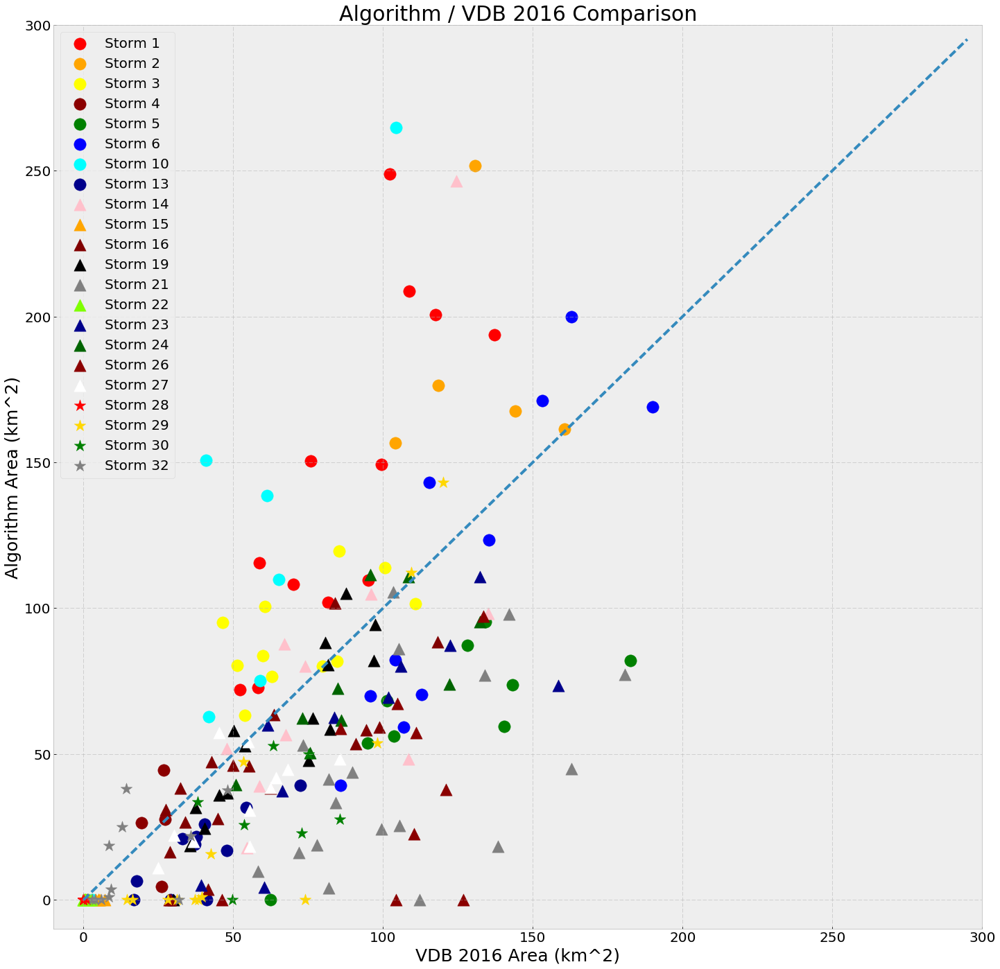

In [10]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
plt.scatter(vdb_storm1, storm1_alg, s=300, color='red', label='Storm 1')
plt.scatter(vdb_storm2, storm2_alg, s=300, color='orange', label = 'Storm 2')
plt.scatter(vdb_storm3, storm3_alg, s=300, color='yellow', label = 'Storm 3')
plt.scatter(vdb_storm4, storm4_alg, s=300, color='darkred', label='Storm 4')
plt.scatter(vdb_storm5_c, storm5_alg, s=300, color='green', label = 'Storm 5')
plt.scatter(vdb_storm6_c, storm6_alg, s=300, color='blue', label = 'Storm 6')
#plt.scatter(vdb_storm7, storm7_alg, s=300, color='purple', label = 'Storm 7')
plt.scatter(vdb_storm10, storm10_alg[::2], s=300, color='cyan', label = 'Storm 10')
plt.scatter(vdb_storm13, storm13_alg, s=300, color='darkblue', label = 'Storm 13')
plt.scatter(vdb_storm14, storm14_alg, s=300, color='pink', marker ='^', label = 'Storm 14')
plt.scatter(vdb_storm15, storm15_alg, s=300, color='orange', marker ='^', label = 'Storm 15')
plt.scatter(vdb_storm16, storm16_alg, s=300, color='maroon', marker ='^', label = 'Storm 16')
plt.scatter(vdb_storm19, storm19_alg, s=300, color='k', marker ='^', label = 'Storm 19')
plt.scatter(vdb_storm21, storm21_alg[::2], s=300, color='grey', marker ='^', label = 'Storm 21')
plt.scatter(vdb_storm22_c, storm22_alg, s=300, color='chartreuse', marker ='^', label = 'Storm 22')
plt.scatter(vdb_storm23, storm23_alg, s=300, color='darkblue', marker ='^', label = 'Storm 23')
plt.scatter(vdb_storm24, storm24_alg, s=300, color='darkgreen', marker ='^', label = 'Storm 24')
plt.scatter(vdb_storm26_c, storm26_alg, s=300, color='darkred', marker ='^', label = 'Storm 26')
plt.scatter(vdb_storm27_c, storm27_alg_c, s=300, color='white', marker ='^', label = 'Storm 27')
plt.scatter(vdb_storm28, storm28_alg, s=300, color='red', marker ='*', label = 'Storm 28')
plt.scatter(vdb_storm29, storm29_alg, s=300, color='gold', marker ='*', label = 'Storm 29')
plt.scatter(vdb_storm30, storm30_alg, s=300, color='green', marker ='*', label = 'Storm 30')
plt.scatter(vdb_storm32, storm32_alg, s=300, color='grey', marker ='*', label = 'Storm 32')

plt.xlabel('VDB 2016 Area (km^2)', size = 25)
plt.ylabel('Algorithm Area (km^2)', size = 25)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title('Algorithm / VDB 2016 Comparison', size = 30)
plt.legend(prop={'size':20})
plt.xlim([-10,300])
plt.ylim([-10,300])
line = np.arange(0,300,5)
plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmNTComparisonChart325.png")
plt.show()

In [11]:
storm_nt_alg_con = np.concatenate((storm1_alg, storm2_alg, storm3_alg, storm4_alg, storm5_alg, storm6_alg, storm10_alg[::2], storm13_alg, storm14_alg, storm15_alg, storm16_alg, storm19_alg, storm21_alg[::2], storm22_alg, storm23_alg, storm24_alg, storm26_alg, storm27_alg_c, storm28_alg, storm29_alg, storm30_alg, storm32_alg))
#storm_alg325_con = np.concatenate((stormI325_alg, stormA325_alg, stormB325_alg, stormC325_alg, stormO325_alg, stormM325_alg, stormH325_alg, storm3325_alg, storm1325_alg, storm2325_alg, storm4325_alg, storm5325_alg, storm6325_alg))

storm_nt_vdb_con = np.concatenate((vdb_storm1, vdb_storm2, vdb_storm3, vdb_storm4, vdb_storm5_c, vdb_storm6_c, vdb_storm10, vdb_storm13, vdb_storm14, vdb_storm15, vdb_storm16, vdb_storm19, vdb_storm21, vdb_storm22_c, vdb_storm23, vdb_storm24, vdb_storm26_c, vdb_storm27_c, vdb_storm28, vdb_storm29, vdb_storm30, vdb_storm32))

In [12]:
print(stats.linregress(storm_nt_vdb_con, storm_nt_alg_con))
print(stats.pearsonr(storm_nt_vdb_con, storm_nt_alg_con))

LinregressResult(slope=0.86485699640471903, intercept=-2.5685777884070404, rvalue=0.68784372758434331, pvalue=5.4571927260185299e-34, stderr=0.06004829516815887)
(0.68784372758434176, 5.4571927260210342e-34)


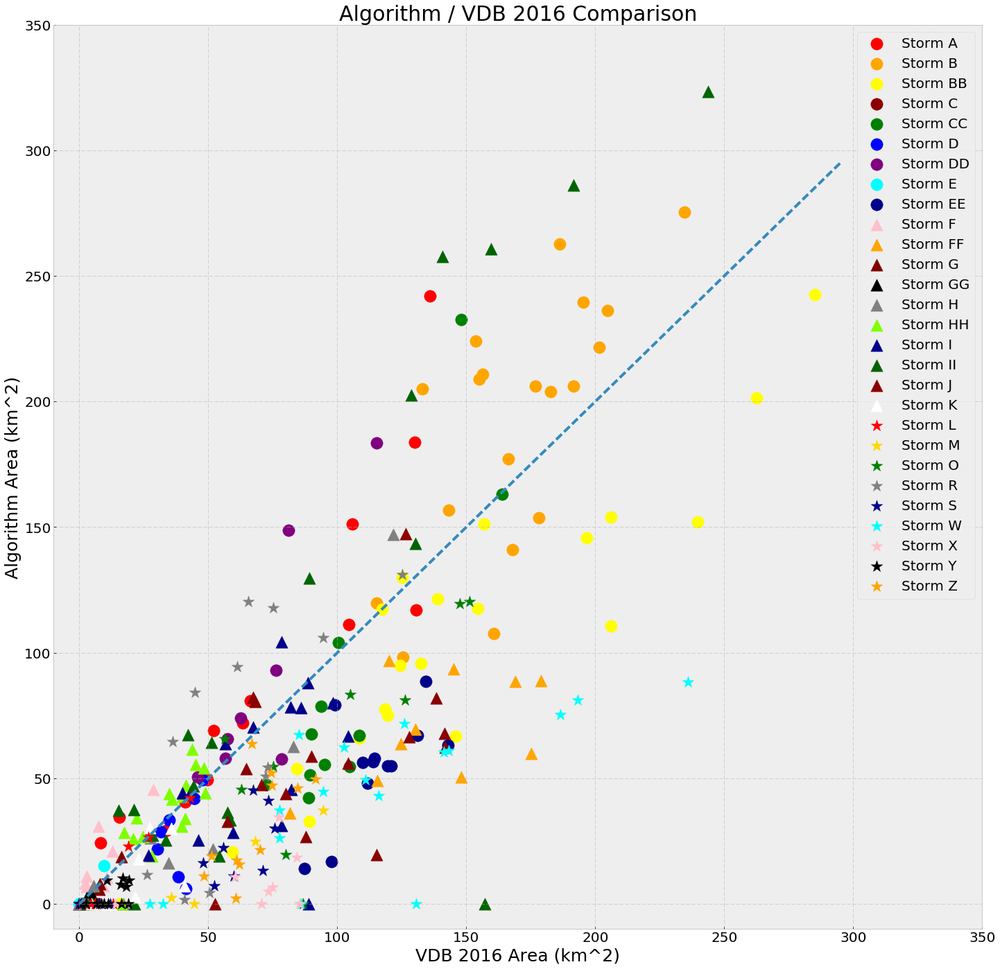

In [13]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
plt.scatter(vdb_stormA, stormA_alg, s=300, color='red', label='Storm A')
plt.scatter(vdb_stormB, stormB_alg, s=300, color='orange', label = 'Storm B')
plt.scatter(vdb_stormBB, stormBB_alg, s=300, color='yellow', label = 'Storm BB')
plt.scatter(vdb_stormC, stormC_alg, s=300, color='darkred', label='Storm C')
plt.scatter(vdb_stormCC, stormCC_alg, s=300, color='green', label = 'Storm CC')
plt.scatter(vdb_stormD, stormD_alg, s=300, color='blue', label = 'Storm D')
plt.scatter(vdb_stormDD, stormDD_alg, s=300, color='purple', label = 'Storm DD')
plt.scatter(vdb_stormE, stormE_alg, s=300, color='cyan', label = 'Storm E')
plt.scatter(vdb_stormEE, stormEE_alg_c, s=300, color='darkblue', label = 'Storm EE')
plt.scatter(vdb_stormF, stormF_alg, s=300, color='pink', marker ='^', label = 'Storm F')
plt.scatter(vdb_stormFF_c, stormFF_alg, s=300, color='orange', marker ='^', label = 'Storm FF')
plt.scatter(vdb_stormG, stormG_alg, s=300, color='maroon', marker ='^', label = 'Storm G')
plt.scatter(vdb_stormGG, stormGG_alg, s=300, color='k', marker ='^', label = 'Storm GG')
plt.scatter(vdb_stormH, stormH_alg, s=300, color='grey', marker ='^', label = 'Storm H')
plt.scatter(vdb_stormHH, stormHH_alg, s=300, color='chartreuse', marker ='^', label = 'Storm HH')
plt.scatter(vdb_stormI, stormI_alg, s=300, color='darkblue', marker ='^', label = 'Storm I')
plt.scatter(vdb_stormII_c, stormII_alg, s=300, color='darkgreen', marker ='^', label = 'Storm II')
plt.scatter(vdb_stormJ, stormJ_alg, s=300, color='darkred', marker ='^', label = 'Storm J')
plt.scatter(vdb_stormK, stormK_alg, s=300, color='white', marker ='^', label = 'Storm K')
plt.scatter(vdb_stormL, stormL_alg, s=300, color='red', marker ='*', label = 'Storm L')
plt.scatter(vdb_stormM[0:4], stormM_alg, s=300, color='gold', marker ='*', label = 'Storm M')
plt.scatter(vdb_stormO, stormO_alg, s=300, color='green', marker ='*', label = 'Storm O')
plt.scatter(vdb_stormR_c, stormR_alg, s=300, color='grey', marker ='*', label = 'Storm R')
plt.scatter(vdb_stormS, stormS_alg, s=300, color='darkblue', marker ='*', label = 'Storm S')
plt.scatter(vdb_stormW_c, stormW_alg, s=300, color='cyan', marker ='*', label = 'Storm W')
plt.scatter(vdb_stormX, stormX_alg, s=300, color='pink', marker ='*', label = 'Storm X')
plt.scatter(vdb_stormY, stormY_alg, s=300, color='k', marker ='*', label = 'Storm Y')
plt.scatter(vdb_stormZ, stormZ_alg, s=300, color='orange', marker ='*', label = 'Storm Z')

plt.xlabel('VDB 2016 Area (km^2)', size = 25)
plt.ylabel('Algorithm Area (km^2)', size = 25)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title('Algorithm / VDB 2016 Comparison', size = 30)
plt.legend(prop={'size':20})
plt.xlim([-10,350])
plt.ylim([-10,350])
line = np.arange(0,300,5)
plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmTorComparisonChart35Calibrated.png")
plt.show()

In [14]:
storm_alg_con = np.concatenate((stormA_alg, stormB_alg, stormBB_alg, stormC_alg, stormCC_alg, stormD_alg, stormDD_alg, stormE_alg, stormEE_alg_c, stormF_alg, stormFF_alg, stormG_alg, stormGG_alg, stormH_alg, stormHH_alg, stormI_alg, stormII_alg, stormJ_alg, stormK_alg, stormL_alg, stormM_alg, stormO_alg, stormR_alg, stormS_alg, stormW_alg, stormX_alg, stormY_alg, stormZ_alg))
#storm_alg325_con = np.concatenate((stormI325_alg, stormA325_alg, stormB325_alg, stormC325_alg, stormO325_alg, stormM325_alg, stormH325_alg, storm3325_alg, storm1325_alg, storm2325_alg, storm4325_alg, storm5325_alg, storm6325_alg))

storm_vdb_con = np.concatenate((vdb_stormA, vdb_stormB[0:19], vdb_stormBB, vdb_stormC, vdb_stormCC, vdb_stormD, vdb_stormDD, vdb_stormE, vdb_stormEE, vdb_stormF, vdb_stormFF_c, vdb_stormG, vdb_stormGG, vdb_stormH, vdb_stormHH, vdb_stormI, vdb_stormII_c, vdb_stormJ, vdb_stormK, vdb_stormL, vdb_stormM[0:4], vdb_stormO, vdb_stormR_c, vdb_stormS, vdb_stormW_c, vdb_stormX, vdb_stormY, vdb_stormZ))

In [15]:
from scipy import stats
print(stats.linregress(storm_vdb_con, storm_alg_con))
print(stats.pearsonr(storm_vdb_con, storm_alg_con))

LinregressResult(slope=0.85247257397446219, intercept=-5.2486320031051292, rvalue=0.81307103011279802, pvalue=3.0537788129429632e-84, stderr=0.032625984219264395)
(0.81307103011279835, 3.0537788129426313e-84)


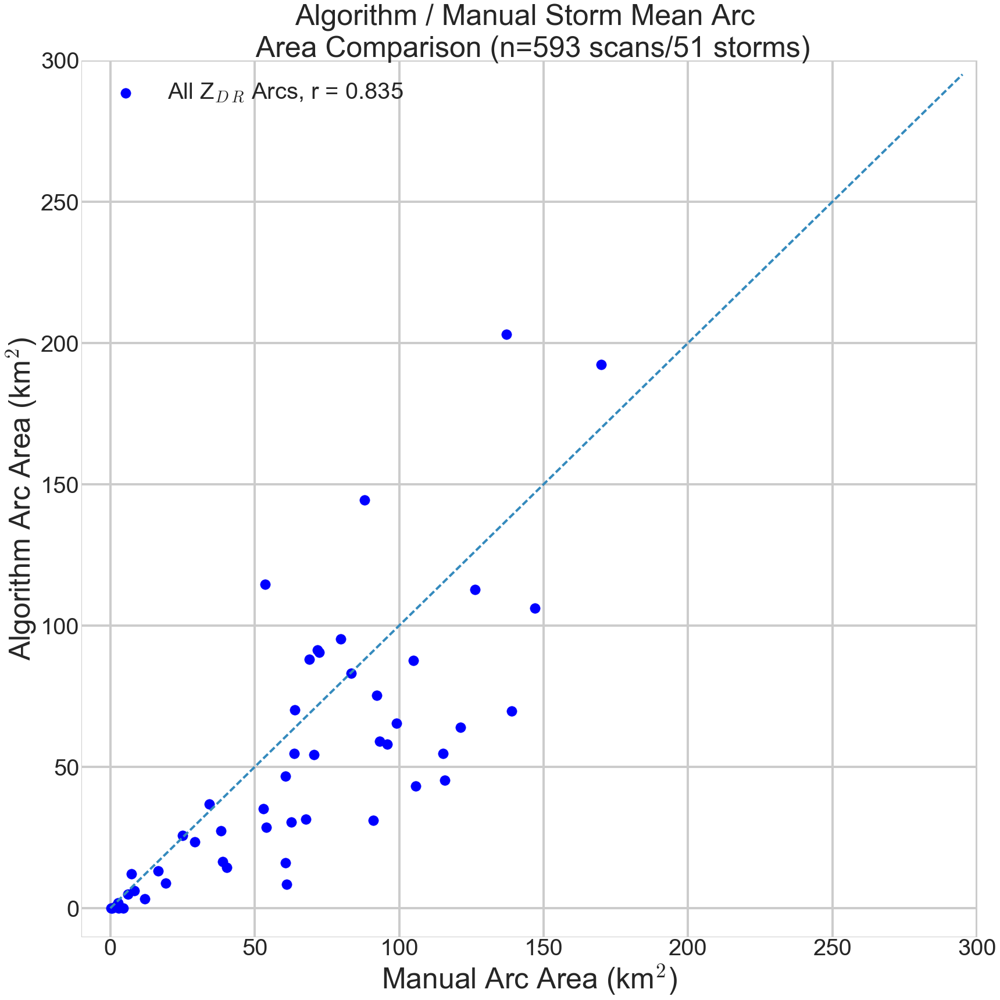

In [124]:
plt.style.use('seaborn-whitegrid')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
plt.scatter(np.mean(vdb_stormA), np.mean(stormA_alg), s=300, color='b', label='All Z$_D$$_R$ Arcs, r = 0.835')
plt.scatter(np.mean(vdb_stormB[0:19]), np.mean(stormB_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormBB), np.mean(stormBB_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormC), np.mean(stormC_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormCC), np.mean(stormCC_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormD), np.mean(stormD_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormDD), np.mean(stormDD_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormE), np.mean(stormE_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormEE), np.mean(stormEE_alg_c), s=300, color='b')
plt.scatter(np.mean(vdb_stormF), np.mean(stormF_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormFF_c), np.mean(stormFF_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormG), np.mean(stormG_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormGG), np.mean(stormGG_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormH), np.mean(stormH_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormHH), np.mean(stormHH_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormI), np.mean(stormI_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormII_c), np.mean(stormII_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormJ), np.mean(stormJ_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormK), np.mean(stormK_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormL), np.mean(stormL_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormM[0:4]), np.mean(stormM_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormO), np.mean(stormO_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormR_c), np.mean(stormR_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormS), np.mean(stormS_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormW_c), np.mean(stormW_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormX), np.mean(stormX_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormY), np.mean(stormY_alg), s=300, color='b')
plt.scatter(np.mean(vdb_stormZ), np.mean(stormZ_alg), s=300, color='b')

plt.scatter(np.mean(vdb_storm1), np.mean(storm1_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm2), np.mean(storm2_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm3), np.mean(storm3_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm4), np.mean(storm4_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm5_c), np.mean(storm5_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm6_c), np.mean(storm6_alg), s=300, color='b')
#plt.scatter(np.mean(vdb_storm7), np.mean(storm7_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm10), np.mean(storm10_alg[::2]), s=300, color='b')
plt.scatter(np.mean(vdb_storm13), np.mean(storm13_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm14), np.mean(storm14_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm15), np.mean(storm15_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm16), np.mean(storm16_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm19), np.mean(storm19_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm21), np.mean(storm21_alg[::2]), s=300, color='b')
plt.scatter(np.mean(vdb_storm22_c), np.mean(storm22_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm23), np.mean(storm23_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm24), np.mean(storm24_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm26_c), np.mean(storm26_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm27_c), np.mean(storm27_alg_c), s=300, color='b')
plt.scatter(np.mean(vdb_storm28), np.mean(storm28_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm29), np.mean(storm29_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm30), np.mean(storm30_alg), s=300, color='b')
plt.scatter(np.mean(vdb_storm32), np.mean(storm32_alg), s=300, color='b')

plt.xlabel('Manual Arc Area (km$^2$)', size = 50)
plt.ylabel('Algorithm Arc Area (km$^2$)', size = 50)
plt.xticks(size=40)
plt.yticks(size=40)
plt.title('Algorithm / Manual Storm Mean Arc \n Area Comparison (n=593 scans/51 storms)', size = 50)
plt.legend(prop={'size':40})
plt.xlim([-10,300])
plt.ylim([-10,300])
line = np.arange(0,300,5)
plt.plot(line, line, linestyle='--', linewidth=4)
plt.savefig("Manuscript_meanalgcomp.png")
plt.grid(True, linewidth=4)
plt.tight_layout()
plt.show()

In [17]:
#Get correlation for ALL the storms
storm_ALL_alg_con = np.concatenate((storm_alg_con, storm_nt_alg_con))
storm_ALL_vdb_con = np.concatenate((storm_vdb_con, storm_nt_vdb_con))

In [18]:
print(stats.linregress(storm_ALL_vdb_con, storm_ALL_alg_con))
print(stats.pearsonr(storm_ALL_vdb_con, storm_ALL_alg_con))
R = stats.pearsonr(storm_ALL_vdb_con, storm_ALL_alg_con)[0]
print(R**2)
print(stats.spearmanr(storm_ALL_vdb_con, storm_ALL_alg_con))

LinregressResult(slope=0.85549493040346136, intercept=-4.05746059082459, rvalue=0.77106003116370148, pvalue=2.2396507747593385e-116, stderr=0.029259872013101335)
(0.77106003116370203, 2.2396507747584281e-116)
0.594533571658
SpearmanrResult(correlation=0.82183066508415503, pvalue=1.4443516482832672e-144)


In [19]:
tornadic_vdb = [vdb_stormA, vdb_stormB[0:19], vdb_stormBB, vdb_stormC, vdb_stormCC, vdb_stormD, vdb_stormDD, vdb_stormE, vdb_stormEE, vdb_stormF, vdb_stormFF_c, vdb_stormG, vdb_stormGG, vdb_stormH, vdb_stormHH, vdb_stormI, vdb_stormII_c, vdb_stormJ, vdb_stormK, vdb_stormL, vdb_stormM[0:4], vdb_stormO, vdb_stormR_c, vdb_stormS, vdb_stormW_c, vdb_stormX, vdb_stormY, vdb_stormZ]
tornadic_alg = [stormA_alg, stormB_alg, stormBB_alg, stormC_alg, stormCC_alg, stormD_alg, stormDD_alg, stormE_alg, stormEE_alg_c, stormF_alg, stormFF_alg, stormG_alg, stormGG_alg, stormH_alg, stormHH_alg, stormI_alg, stormII_alg, stormJ_alg, stormK_alg, stormL_alg, stormM_alg, stormO_alg, stormR_alg, stormS_alg, stormW_alg, stormX_alg, stormY_alg, stormZ_alg]
tor_vdbmeans = np.zeros((len(tornadic_vdb)))
tor_algmeans = np.zeros((len(tornadic_vdb)))
for i in range(len(tornadic_vdb)):
    tor_vdbmeans[i] = np.mean(tornadic_vdb[i])
    tor_algmeans[i] = np.mean(tornadic_alg[i])

In [20]:
nontornadic_vdb = [vdb_storm1, vdb_storm2, vdb_storm3, vdb_storm4, vdb_storm5_c, vdb_storm6_c, vdb_storm10, vdb_storm13, vdb_storm14, vdb_storm15, vdb_storm16, vdb_storm19, vdb_storm21, vdb_storm22_c, vdb_storm23, vdb_storm24, vdb_storm26_c, vdb_storm27_c, vdb_storm28, vdb_storm29, vdb_storm30, vdb_storm32]
nontornadic_alg = [storm1_alg, storm2_alg, storm3_alg, storm4_alg, storm5_alg, storm6_alg, storm10_alg[::2], storm13_alg, storm14_alg, storm15_alg, storm16_alg, storm19_alg, storm21_alg[::2], storm22_alg, storm23_alg, storm24_alg, storm26_alg, storm27_alg_c, storm28_alg, storm29_alg, storm30_alg, storm32_alg]
nontor_vdbmeans = np.zeros((len(nontornadic_vdb)))
nontor_algmeans = np.zeros((len(nontornadic_vdb)))
for i in range(len(nontornadic_vdb)):
    nontor_vdbmeans[i] = np.mean(nontornadic_vdb[i])
    nontor_algmeans[i] = np.mean(nontornadic_alg[i])

In [21]:
print(len(tor_vdbmeans))

28


In [22]:
print(stats.linregress(tor_vdbmeans, tor_algmeans))
print(stats.pearsonr(tor_vdbmeans, tor_algmeans))

LinregressResult(slope=0.77056204556881325, intercept=-2.1881537700383902, rvalue=0.83487036161893236, pvalue=3.3169471828427702e-08, stderr=0.099636188115941868)
(0.83487036161893224, 3.3169471828427927e-08)


In [23]:
print(stats.linregress(nontor_vdbmeans, nontor_algmeans))
print(stats.pearsonr(nontor_vdbmeans, nontor_algmeans))

LinregressResult(slope=0.93261530757345101, intercept=-3.3656074311377253, rvalue=0.73378725725397032, pvalue=0.0001016343782460045, stderr=0.19307662528689906)
(0.73378725725397032, 0.00010163437824600437)


In [24]:
all_vdbmeans = np.concatenate((tor_vdbmeans, nontor_vdbmeans))
all_algmeans = np.concatenate((tor_algmeans, nontor_algmeans))

In [25]:
print(stats.linregress(all_vdbmeans, all_algmeans))
print(stats.pearsonr(all_vdbmeans, all_algmeans))
print(stats.spearmanr(all_vdbmeans, all_algmeans))

LinregressResult(slope=0.83213698148403392, intercept=-1.9398615156592172, rvalue=0.77980823542149302, pvalue=2.4992957989656152e-11, stderr=0.096421421320861317)
(0.77980823542149302, 2.4992957989656172e-11)
SpearmanrResult(correlation=0.83463018737266204, pvalue=5.0346666412760761e-14)


In [26]:
StormA_VR = np.genfromtxt('Tornadic_VR/StormA.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_A = StormA_VR[:,3]

StormB_VR = np.genfromtxt('Tornadic_VR/StormB.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_B = StormB_VR[:,3]

StormBB_VR = np.genfromtxt('Tornadic_VR/StormBB.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_BB = StormBB_VR[:,3]

StormC_VR = np.genfromtxt('Tornadic_VR/StormC.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_C = StormC_VR[:,3]

StormCC_VR = np.genfromtxt('Tornadic_VR/StormCC.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_CC = StormCC_VR[:,3]

StormD_VR = np.genfromtxt('Tornadic_VR/StormD.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_D = StormD_VR[:,3]
#Since VDB's time series is missing 1:46, delete it from the Vr time series
VR_D = np.delete(VR_D, 3)

StormDD_VR = np.genfromtxt('Tornadic_VR/StormDD.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_DD = StormDD_VR[:,3]

StormE_VR = np.genfromtxt('Tornadic_VR/StormE.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_E = StormE_VR[:,3]

StormEE_VR = np.genfromtxt('Tornadic_VR/StormEE.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_EE = StormEE_VR[:,3]
#Remove the second to last frame, since manual data is not available to compare it with
VR_EE = np.delete(VR_EE, 10)

StormF_VR = np.genfromtxt('Tornadic_VR/StormF.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_F = StormF_VR[:,3]

StormFF_VR = np.genfromtxt('Tornadic_VR/StormFF.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_FF = StormFF_VR[:,3]

StormG_VR = np.genfromtxt('Tornadic_VR/StormG.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_G = StormG_VR[:,3]

StormGG_VR = np.genfromtxt('Tornadic_VR/StormGG.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_GG = StormGG_VR[:,3]

StormH_VR = np.genfromtxt('Tornadic_VR/StormH.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_H = StormH_VR[:,3]

StormHH_VR = np.genfromtxt('Tornadic_VR/StormHH.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_HH = StormHH_VR[:,3]

StormI_VR = np.genfromtxt('Tornadic_VR/StormI.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_I = StormI_VR[:,3]

StormII_VR = np.genfromtxt('Tornadic_VR/StormII.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_II = StormII_VR[:,3]

StormJ_VR = np.genfromtxt('Tornadic_VR/StormJ.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_J = StormJ_VR[:,3]

StormK_VR = np.genfromtxt('Tornadic_VR/StormK.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_K = StormK_VR[:,3]

StormL_VR = np.genfromtxt('Tornadic_VR/StormL.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_L = StormL_VR[:,3]

StormM_VR = np.genfromtxt('Tornadic_VR/StormM.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_M = StormM_VR[:,3]

StormO_VR = np.genfromtxt('Tornadic_VR/StormO.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_O = StormO_VR[:,3]

StormR_VR = np.genfromtxt('Tornadic_VR/StormR.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_R = StormR_VR[:,3]

StormS_VR = np.genfromtxt('Tornadic_VR/StormS.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_S = StormS_VR[:,3]

StormW_VR = np.genfromtxt('Tornadic_VR/StormW.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_W = StormW_VR[:,3]

StormX_VR = np.genfromtxt('Tornadic_VR/StormX.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_X = StormX_VR[:,3]

StormY_VR = np.genfromtxt('Tornadic_VR/StormY.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_Y = StormY_VR[:,3]

StormZ_VR = np.genfromtxt('Tornadic_VR/StormZ.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_Z = StormZ_VR[:,3]


In [27]:
Storm1_VR = np.genfromtxt('NT_VR/Storm1.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_1 = Storm1_VR[:,3]

Storm2_VR = np.genfromtxt('NT_VR/Storm2.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_2 = Storm2_VR[:,3]

Storm3_VR = np.genfromtxt('NT_VR/Storm3.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_3 = Storm3_VR[:,3]

Storm4_VR = np.genfromtxt('NT_VR/Storm4.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_4 = Storm4_VR[:,3]

Storm5_VR = np.genfromtxt('NT_VR/Storm5.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_5 = Storm5_VR[:,3]

Storm6_VR = np.genfromtxt('NT_VR/Storm6.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_6 = Storm6_VR[:,3]

#Storm7_VR = np.genfromtxt('NT_VR/Storm7.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
#VR_7 = Storm7_VR[:,3]

Storm10_VR = np.genfromtxt('NT_VR/Storm10.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_10 = Storm10_VR[:,3]
#Since the VDB's dataset is missing the frame at 5:50, remove that from the manual time series
VR_10 = np.delete(VR_10, [1,3,5,7,9])

Storm13_VR = np.genfromtxt('NT_VR/Storm13.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_13 = Storm13_VR[:,3]

Storm14_VR = np.genfromtxt('NT_VR/Storm14.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_14 = Storm14_VR[:,3]

Storm15_VR = np.genfromtxt('NT_VR/Storm15.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_15 = Storm15_VR[:,3]

Storm16_VR = np.genfromtxt('NT_VR/Storm16.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_16 = Storm16_VR[:,3]

Storm19_VR = np.genfromtxt('NT_VR/Storm19.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_19 = Storm19_VR[:,3]

Storm21_VR = np.genfromtxt('NT_VR/Storm21.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_21 = Storm21_VR[:,3]

Storm22_VR = np.genfromtxt('NT_VR/Storm22.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_22 = Storm22_VR[:,3]
#Since the AWS dataset is missing the frame before 00Z, remove that from the manual time series
VR_22 = np.delete(VR_22, 12)

Storm23_VR = np.genfromtxt('NT_VR/Storm23.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_23 = Storm23_VR[:,3]

Storm24_VR = np.genfromtxt('NT_VR/Storm24.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_24 = Storm24_VR[:,3]

Storm26_VR = np.genfromtxt('NT_VR/Storm26.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_26 = Storm26_VR[:,3]

Storm27_VR = np.genfromtxt('NT_VR/Storm27.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_27 = Storm27_VR[:,3]

Storm28_VR = np.genfromtxt('NT_VR/Storm28.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_28 = Storm28_VR[:,3]

Storm29_VR = np.genfromtxt('NT_VR/Storm29.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_29 = Storm29_VR[:,3]

Storm30_VR = np.genfromtxt('NT_VR/Storm30.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_30 = Storm30_VR[:,3]

Storm32_VR = np.genfromtxt('NT_VR/Storm32.csv', delimiter=",", skip_header=1, usecols=(0,1,2,3,4,5,6))
VR_32 = Storm32_VR[:,3]

#Let's look at nrot
NR_1 = Storm1_VR[:,4]
NR_2 = Storm2_VR[:,4]
NR_3 = Storm3_VR[:,4]
NR_4 = Storm4_VR[:,4]
NR_5 = Storm5_VR[:,4]
NR_6 = Storm6_VR[:,4]
#NR_7 = Storm7_VR[:,4]
NR_10 = Storm10_VR[:,4]
#Since the VDB's dataset is missing the frame at 5:50, remove that from the manual time series
NR_10 = np.delete(NR_10, [1,3,5,7,9])
NR_13 = Storm13_VR[:,4]
NR_14 = Storm14_VR[:,4]
NR_15 = Storm15_VR[:,4]
NR_16 = Storm16_VR[:,4]
NR_19 = Storm19_VR[:,4]
NR_21 = Storm21_VR[:,4]
NR_22 = Storm22_VR[:,4]
#Since the AWS dataset is missing the frame before 00Z, remove that from the manual time series
NR_22 = np.delete(NR_22, 12)
NR_23 = Storm23_VR[:,4]
NR_24 = Storm24_VR[:,4]
NR_26 = Storm26_VR[:,4]
NR_27 = Storm27_VR[:,4]
NR_28 = Storm28_VR[:,4]
NR_29 = Storm29_VR[:,4]
NR_30 = Storm30_VR[:,4]
NR_32 = Storm32_VR[:,4]


In [28]:
print(vdb_storm10.shape)
print(NR_10.shape)

(7,)
(7,)


In [29]:
storm_nt_alg_con = np.concatenate((storm1_alg, storm2_alg, storm3_alg, storm4_alg, storm5_alg, storm6_alg, storm10_alg[::2], storm13_alg, storm14_alg, storm15_alg, storm16_alg, storm19_alg, storm21_alg[::2], storm22_alg, storm23_alg, storm24_alg, storm26_alg, storm27_alg_c, storm28_alg, storm29_alg, storm30_alg, storm32_alg))
#storm_alg325_con = np.concatenate((stormI325_alg, stormA325_alg, stormB325_alg, stormC325_alg, stormO325_alg, stormM325_alg, stormH325_alg, storm3325_alg, storm1325_alg, storm2325_alg, storm4325_alg, storm5325_alg, storm6325_alg))

storm_nt_vdb_con = np.concatenate((vdb_storm1, vdb_storm2, vdb_storm3, vdb_storm4, vdb_storm5_c, vdb_storm6_c, vdb_storm10, vdb_storm13, vdb_storm14, vdb_storm15, vdb_storm16, vdb_storm19, vdb_storm21, vdb_storm22_c, vdb_storm23, vdb_storm24, vdb_storm26_c, vdb_storm27_c, vdb_storm28, vdb_storm29, vdb_storm30, vdb_storm32))

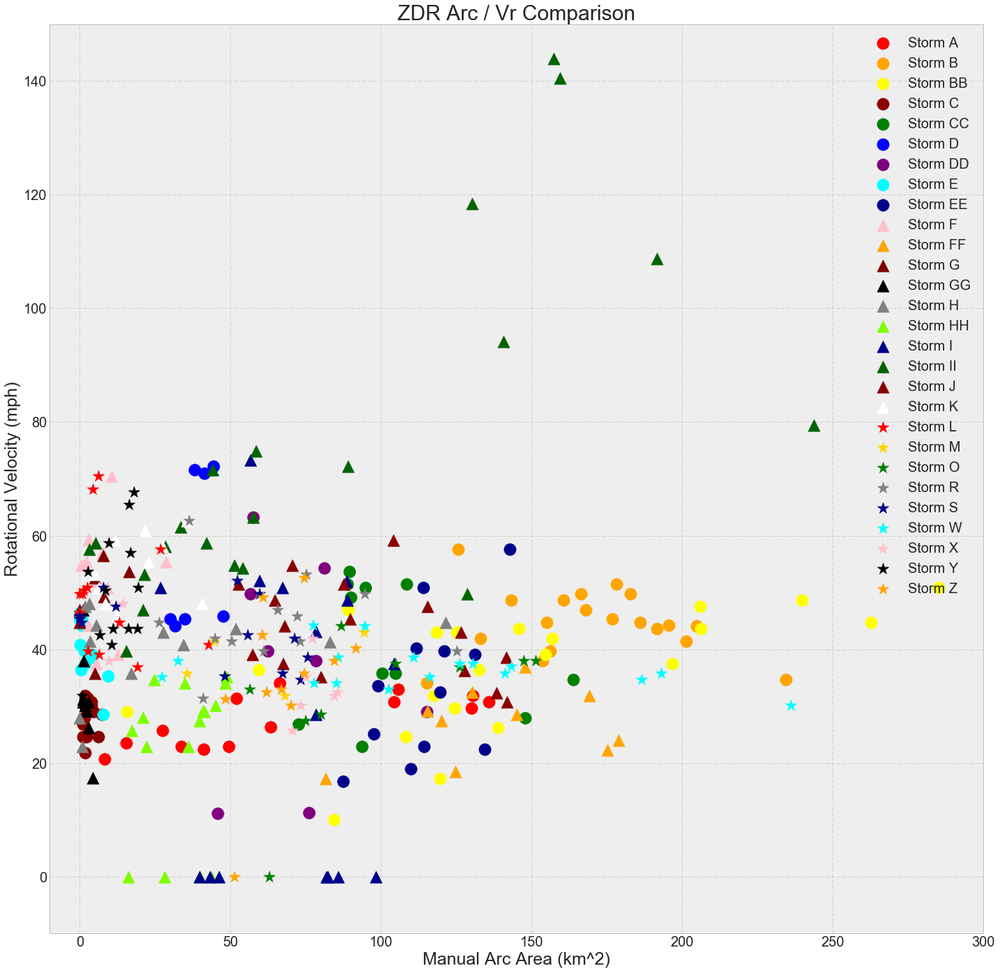

In [30]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
plt.scatter(vdb_stormA, VR_A, s=300, color='red', label='Storm A')
plt.scatter(vdb_stormB[0:19], VR_B[0:19], s=300, color='orange', label = 'Storm B')
plt.scatter(vdb_stormBB, VR_BB, s=300, color='yellow', label = 'Storm BB')
plt.scatter(vdb_stormC, VR_C, s=300, color='darkred', label='Storm C')
plt.scatter(vdb_stormCC, VR_CC, s=300, color='green', label = 'Storm CC')
plt.scatter(vdb_stormD, VR_D, s=300, color='blue', label = 'Storm D')
plt.scatter(vdb_stormDD, VR_DD, s=300, color='purple', label = 'Storm DD')
plt.scatter(vdb_stormE, VR_E[0:12], s=300, color='cyan', label = 'Storm E')
plt.scatter(vdb_stormEE, VR_EE, s=300, color='darkblue', label = 'Storm EE')
plt.scatter(vdb_stormF, VR_F, s=300, color='pink', marker ='^', label = 'Storm F')
plt.scatter(vdb_stormFF_c, VR_FF, s=300, color='orange', marker ='^', label = 'Storm FF')
plt.scatter(vdb_stormG, VR_G, s=300, color='maroon', marker ='^', label = 'Storm G')
plt.scatter(vdb_stormGG, VR_GG, s=300, color='k', marker ='^', label = 'Storm GG')
plt.scatter(vdb_stormH, VR_H, s=300, color='grey', marker ='^', label = 'Storm H')
plt.scatter(vdb_stormHH, VR_HH, s=300, color='chartreuse', marker ='^', label = 'Storm HH')
plt.scatter(vdb_stormI, VR_I, s=300, color='darkblue', marker ='^', label = 'Storm I')
plt.scatter(vdb_stormII_c, VR_II, s=300, color='darkgreen', marker ='^', label = 'Storm II')
plt.scatter(vdb_stormJ, VR_J, s=300, color='darkred', marker ='^', label = 'Storm J')
plt.scatter(vdb_stormK, VR_K, s=300, color='white', marker ='^', label = 'Storm K')
plt.scatter(vdb_stormL, VR_L, s=300, color='red', marker ='*', label = 'Storm L')
plt.scatter(vdb_stormM[0:4], VR_M[0:4], s=300, color='gold', marker ='*', label = 'Storm M')
plt.scatter(vdb_stormO, VR_O, s=300, color='green', marker ='*', label = 'Storm O')
plt.scatter(vdb_stormR_c, VR_R, s=300, color='grey', marker ='*', label = 'Storm R')
plt.scatter(vdb_stormS, VR_S, s=300, color='darkblue', marker ='*', label = 'Storm S')
plt.scatter(vdb_stormW_c, VR_W, s=300, color='cyan', marker ='*', label = 'Storm W')
plt.scatter(vdb_stormX, VR_X, s=300, color='pink', marker ='*', label = 'Storm X')
plt.scatter(vdb_stormY, VR_Y, s=300, color='k', marker ='*', label = 'Storm Y')
plt.scatter(vdb_stormZ, VR_Z, s=300, color='orange', marker ='*', label = 'Storm Z')

plt.xlabel('Manual Arc Area (km^2)', size = 25)
plt.ylabel('Rotational Velocity (mph)', size = 25)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title('ZDR Arc / Vr Comparison', size = 30)
plt.legend(prop={'size':20})
plt.xlim([-10,300])
plt.ylim([-10,150])
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmVRTorComparisonChart325.png")
plt.show()

In [31]:
print(vdb_stormD)
print(VR_D)

[ 38.2   41.38  44.42  47.62  34.88  31.69  30.14]
[ 71.6   71.    72.15  45.85  45.3   44.15  45.3 ]


In [32]:
NR_Nlist = [NR_1, NR_2, NR_3, NR_4, NR_5, NR_6, NR_10, NR_13, NR_14, NR_15, NR_16, NR_19, NR_21[::2], NR_22, NR_23, NR_24, NR_26, NR_27, NR_28, NR_29, NR_30, NR_32]
VR_Nlist = [VR_1, VR_2, VR_3, VR_4, VR_5, VR_6, VR_10, VR_13, VR_14, VR_15, VR_16, VR_19, VR_21[::2], VR_22, VR_23, VR_24, VR_26, VR_27, VR_28, VR_29, VR_30, VR_32]

In [33]:
NR_Ncon = np.concatenate(NR_Nlist)
VR_Ncon = np.concatenate(VR_Nlist)

In [34]:
#Next three cells compute lagged time series for the tornadic cases
vdb_stormAlm1 = []
vdb_stormBlm1 = []
vdb_stormBBlm1 = []
vdb_stormClm1 = []
vdb_stormCClm1 = []
vdb_stormDlm1 = []
vdb_stormDDlm1 = []
vdb_stormElm1 = []
vdb_stormEElm1 = []
vdb_stormFlm1 = []
vdb_stormFFlm1 = []
vdb_stormGlm1 = []
vdb_stormGGlm1 = []
vdb_stormHlm1 = []
vdb_stormHHlm1 = []
vdb_stormIlm1 = []
vdb_stormIIlm1 = []
vdb_stormJlm1 = []
vdb_stormKlm1 = []
vdb_stormLlm1 = []
vdb_stormMlm1 = []
vdb_stormOlm1 = []
vdb_stormRlm1 = []
vdb_stormSlm1 = []
vdb_stormWlm1 = []
vdb_stormXlm1 = []
vdb_stormYlm1 = []
vdb_stormZlm1 = []

algAlm1 = []
algBlm1 = []
algBBlm1 = []
algClm1 = []
algCClm1 = []
algDlm1 = []
algDDlm1 = []
algElm1 = []
algEElm1 = []
algFlm1 = []
algFFlm1 = []
algGlm1 = []
algGGlm1 = []
algHlm1 = []
algHHlm1 = []
algIlm1 = []
algIIlm1 = []
algJlm1 = []
algKlm1 = []
algLlm1 = []
algMlm1 = []
algOlm1 = []
algRlm1 = []
algSlm1 = []
algWlm1 = []
algXlm1 = []
algYlm1 = []
algZlm1 = []

VR_Alm1 = []
VR_Blm1 = []
VR_BBlm1 = []
VR_Clm1 = []
VR_CClm1 = []
VR_Dlm1 = []
VR_DDlm1 = []
VR_Elm1 = []
VR_EElm1 = []
VR_Flm1 = []
VR_FFlm1 = []
VR_Glm1 = []
VR_GGlm1 = []
VR_Hlm1 = []
VR_HHlm1 = []
VR_Ilm1 = []
VR_IIlm1 = []
VR_Jlm1 = []
VR_Klm1 = []
VR_Llm1 = []
VR_Mlm1 = []
VR_Olm1 = []
VR_Rlm1 = []
VR_Slm1 = []
VR_Wlm1 = []
VR_Xlm1 = []
VR_Ylm1 = []
VR_Zlm1 = []


zdr_vdb_list = [vdb_stormA, vdb_stormB[0:19], vdb_stormBB, vdb_stormC, vdb_stormCC, vdb_stormD, vdb_stormDD, vdb_stormE, vdb_stormEE, vdb_stormF, vdb_stormFF_c, vdb_stormG, vdb_stormGG, vdb_stormH, vdb_stormHH, vdb_stormI, vdb_stormII_c, vdb_stormJ, vdb_stormK, vdb_stormL, vdb_stormM[0:4], vdb_stormO, vdb_stormR_c, vdb_stormS, vdb_stormW_c, vdb_stormX, vdb_stormY, vdb_stormZ]
zdr_vdb_lm1 = [vdb_stormAlm1, vdb_stormBlm1, vdb_stormBBlm1, vdb_stormClm1, vdb_stormCClm1, vdb_stormDlm1, vdb_stormDDlm1, vdb_stormElm1, vdb_stormEElm1, vdb_stormFlm1, vdb_stormFFlm1, vdb_stormGlm1, vdb_stormGGlm1, vdb_stormHlm1, vdb_stormHHlm1, vdb_stormIlm1, vdb_stormIIlm1, vdb_stormJlm1, vdb_stormKlm1, vdb_stormLlm1, vdb_stormMlm1, vdb_stormOlm1, vdb_stormRlm1, vdb_stormSlm1, vdb_stormWlm1, vdb_stormXlm1, vdb_stormYlm1, vdb_stormZlm1]
alg_list = [stormA_alg, stormB_alg, stormBB_alg, stormC_alg, stormCC_alg, stormD_alg, stormDD_alg, stormE_alg, stormEE_alg_c, stormF_alg, stormFF_alg, stormG_alg, stormGG_alg, stormH_alg, stormHH_alg, stormI_alg, stormII_alg, stormJ_alg, stormK_alg, stormL_alg, stormM_alg, stormO_alg, stormR_alg, stormS_alg, stormW_alg, stormX_alg, stormY_alg, stormZ_alg]
alg_lm1 = [algAlm1, algBlm1, algBBlm1, algClm1, algCClm1, algDlm1, algDDlm1, algElm1, algEElm1, algFlm1, algFFlm1, algGlm1, algGGlm1, algHlm1, algHHlm1, algIlm1, algIIlm1, algJlm1, algKlm1, algLlm1, algMlm1, algOlm1, algRlm1, algSlm1, algWlm1, algXlm1, algYlm1, algZlm1]
VR_lm1 = [VR_Alm1, VR_Blm1, VR_BBlm1, VR_Clm1, VR_CClm1, VR_Dlm1, VR_DDlm1, VR_Elm1, VR_EElm1, VR_Flm1, VR_FFlm1, VR_Glm1, VR_GGlm1, VR_Hlm1, VR_HHlm1, VR_Ilm1, VR_IIlm1, VR_Jlm1, VR_Klm1, VR_Llm1, VR_Mlm1, VR_Olm1, VR_Rlm1, VR_Slm1, VR_Wlm1, VR_Xlm1, VR_Ylm1, VR_Zlm1]
VR_list = [VR_A, VR_B[0:19], VR_BB, VR_C, VR_CC, VR_D, VR_DD, VR_E[0:12], VR_EE, VR_F, VR_FF, VR_G, VR_GG, VR_H, VR_HH, VR_I, VR_II, VR_J, VR_K, VR_L, VR_M[0:4], VR_O, VR_R, VR_S, VR_W, VR_X, VR_Y, VR_Z]

j = 0
for i in [VR_A, VR_B[0:19], VR_BB, VR_C, VR_CC, VR_D, VR_DD, VR_E[0:12], VR_EE, VR_F, VR_FF, VR_G, VR_GG, VR_H, VR_HH, VR_I, VR_II, VR_J, VR_K, VR_L, VR_M[0:4], VR_O, VR_R, VR_S, VR_W, VR_X, VR_Y, VR_Z]:
    print(len(zdr_vdb_list[j]))
    #ZDR lagged
    #zdr_vdb_lm1[j] = zdr_vdb_list[j][1:]
    #alg_lm1[i] = alg_list[j][1:]
    #VR_lm1[j] = i[0:len(i)-1]
    #Velocity lagged
    VR_lm1[j] = i[1:]
    zdr_vdb_lm1[j] = zdr_vdb_list[j][0:len(i)-1]
    alg_lm1[j] = alg_list[j][0:len(i)-1]
    j=j+1

14
19
21
16
11
7
8
12
12
12
10
7
9
12
16
16
21
16
10
15
4
9
12
13
17
9
13
11


In [35]:
vdb_stormAlm2 = []
vdb_stormBlm2 = []
vdb_stormBBlm2 = []
vdb_stormClm2 = []
vdb_stormCClm2 = []
vdb_stormDlm2 = []
vdb_stormDDlm2 = []
vdb_stormElm2 = []
vdb_stormEElm2 = []
vdb_stormFlm2 = []
vdb_stormFFlm2 = []
vdb_stormGlm2 = []
vdb_stormGGlm2 = []
vdb_stormHlm2 = []
vdb_stormHHlm2 = []
vdb_stormIlm2 = []
vdb_stormIIlm2 = []
vdb_stormJlm2 = []
vdb_stormKlm2 = []
vdb_stormLlm2 = []
vdb_stormMlm2 = []
vdb_stormOlm2 = []
vdb_stormRlm2 = []
vdb_stormSlm2 = []
vdb_stormWlm2 = []
vdb_stormXlm2 = []
vdb_stormYlm2 = []
vdb_stormZlm2 = []

algAlm2 = []
algBlm2 = []
algBBlm2 = []
algClm2 = []
algCClm2 = []
algDlm2 = []
algDDlm2 = []
algElm2 = []
algEElm2 = []
algFlm2 = []
algFFlm2 = []
algGlm2 = []
algGGlm2 = []
algHlm2 = []
algHHlm2 = []
algIlm2 = []
algIIlm2 = []
algJlm2 = []
algKlm2 = []
algLlm2 = []
algMlm2 = []
algOlm2 = []
algRlm2 = []
algSlm2 = []
algWlm2 = []
algXlm2 = []
algYlm2 = []
algZlm2 = []


VR_Alm2 = []
VR_Blm2 = []
VR_BBlm2 = []
VR_Clm2 = []
VR_CClm2 = []
VR_Dlm2 = []
VR_DDlm2 = []
VR_Elm2 = []
VR_EElm2 = []
VR_Flm2 = []
VR_FFlm2 = []
VR_Glm2 = []
VR_GGlm2 = []
VR_Hlm2 = []
VR_HHlm2 = []
VR_Ilm2 = []
VR_IIlm2 = []
VR_Jlm2 = []
VR_Klm2 = []
VR_Llm2 = []
VR_Mlm2 = []
VR_Olm2 = []
VR_Rlm2 = []
VR_Slm2 = []
VR_Wlm2 = []
VR_Xlm2 = []
VR_Ylm2 = []
VR_Zlm2 = []


#zdr_vdb_list = [vdb_stormA, vdb_stormB[0:19], vdb_stormBB, vdb_stormC, vdb_stormCC, vdb_stormD, vdb_stormDD, vdb_stormE, vdb_stormEE, vdb_stormF, vdb_stormFF_c, vdb_stormG, vdb_stormGG, vdb_stormH, vdb_stormHH, vdb_stormI, vdb_stormII_c, vdb_stormJ, vdb_stormK, vdb_stormL, vdb_stormM[0:4], vdb_stormO, vdb_stormR_c, vdb_stormS, vdb_stormW_c, vdb_stormX, vdb_stormY, vdb_stormZ]
zdr_vdb_lm2 = [vdb_stormAlm2, vdb_stormBlm2, vdb_stormBBlm2, vdb_stormClm2, vdb_stormCClm2, vdb_stormDlm2, vdb_stormDDlm2, vdb_stormElm2, vdb_stormEElm2, vdb_stormFlm2, vdb_stormFFlm2, vdb_stormGlm2, vdb_stormGGlm2, vdb_stormHlm2, vdb_stormHHlm2, vdb_stormIlm2, vdb_stormIIlm2, vdb_stormJlm2, vdb_stormKlm2, vdb_stormLlm2, vdb_stormMlm2, vdb_stormOlm2, vdb_stormRlm2, vdb_stormSlm2, vdb_stormWlm2, vdb_stormXlm2, vdb_stormYlm2, vdb_stormZlm2]
alg_lm2 = [algAlm2, algBlm2, algBBlm2, algClm2, algCClm2, algDlm2, algDDlm2, algElm2, algEElm2, algFlm2, algFFlm2, algGlm2, algGGlm2, algHlm2, algHHlm2, algIlm2, algIIlm2, algJlm2, algKlm2, algLlm2, algMlm2, algOlm2, algRlm2, algSlm2, algWlm2, algXlm2, algYlm2, algZlm2]
VR_lm2 = [VR_Alm2, VR_Blm2, VR_BBlm2, VR_Clm2, VR_CClm2, VR_Dlm2, VR_DDlm2, VR_Elm2, VR_EElm2, VR_Flm2, VR_FFlm2, VR_Glm2, VR_GGlm2, VR_Hlm2, VR_HHlm2, VR_Ilm2, VR_IIlm2, VR_Jlm2, VR_Klm2, VR_Llm2, VR_Mlm2, VR_Olm2, VR_Rlm2, VR_Slm2, VR_Wlm2, VR_Xlm2, VR_Ylm2, VR_Zlm2]
#VR_list = [VR_A, VR_B[0:19], VR_BB, VR_C, VR_CC, VR_D, VR_DD, VR_E[0:12], VR_EE, VR_F, VR_FF, VR_G, VR_GG, VR_H, VR_HH, VR_I, VR_II, VR_J, VR_K, VR_L, VR_M[0:4], VR_O, VR_R, VR_S, VR_W, VR_X, VR_Y, VR_Z]

j = 0
for i in [VR_A, VR_B[0:19], VR_BB, VR_C, VR_CC, VR_D, VR_DD, VR_E[0:12], VR_EE, VR_F, VR_FF, VR_G, VR_GG, VR_H, VR_HH, VR_I, VR_II, VR_J, VR_K, VR_L, VR_M[0:4], VR_O, VR_R, VR_S, VR_W, VR_X, VR_Y, VR_Z]:
    print(len(zdr_vdb_list[j]))
    #ZDR lagged
    #zdr_vdb_lm2[j] = zdr_vdb_list[j][2:]
    #VR_lm2[j] = i[0:len(i)-2]
    #alg_lm2[i] = alg_list[j][2:]
    #V lagged
    VR_lm2[j] = i[2:]
    zdr_vdb_lm2[j] = zdr_vdb_list[j][0:len(i)-2]
    alg_lm2[j] = alg_list[j][0:len(i)-2]
    j=j+1

14
19
21
16
11
7
8
12
12
12
10
7
9
12
16
16
21
16
10
15
4
9
12
13
17
9
13
11


In [36]:
vdb_stormAlm3 = []
vdb_stormBlm3 = []
vdb_stormBBlm3 = []
vdb_stormClm3 = []
vdb_stormCClm3 = []
vdb_stormDlm3 = []
vdb_stormDDlm3 = []
vdb_stormElm3 = []
vdb_stormEElm3 = []
vdb_stormFlm3 = []
vdb_stormFFlm3 = []
vdb_stormGlm3 = []
vdb_stormGGlm3 = []
vdb_stormHlm3 = []
vdb_stormHHlm3 = []
vdb_stormIlm3 = []
vdb_stormIIlm3 = []
vdb_stormJlm3 = []
vdb_stormKlm3 = []
vdb_stormLlm3 = []
vdb_stormMlm3 = []
vdb_stormOlm3 = []
vdb_stormRlm3 = []
vdb_stormSlm3 = []
vdb_stormWlm3 = []
vdb_stormXlm3 = []
vdb_stormYlm3 = []
vdb_stormZlm3 = []

algAlm3 = []
algBlm3 = []
algBBlm3 = []
algClm3 = []
algCClm3 = []
algDlm3 = []
algDDlm3 = []
algElm3 = []
algEElm3 = []
algFlm3 = []
algFFlm3 = []
algGlm3 = []
algGGlm3 = []
algHlm3 = []
algHHlm3 = []
algIlm3 = []
algIIlm3 = []
algJlm3 = []
algKlm3 = []
algLlm3 = []
algMlm3 = []
algOlm3 = []
algRlm3 = []
algSlm3 = []
algWlm3 = []
algXlm3 = []
algYlm3 = []
algZlm3 = []

VR_Alm3 = []
VR_Blm3 = []
VR_BBlm3 = []
VR_Clm3 = []
VR_CClm3 = []
VR_Dlm3 = []
VR_DDlm3 = []
VR_Elm3 = []
VR_EElm3 = []
VR_Flm3 = []
VR_FFlm3 = []
VR_Glm3 = []
VR_GGlm3 = []
VR_Hlm3 = []
VR_HHlm3 = []
VR_Ilm3 = []
VR_IIlm3 = []
VR_Jlm3 = []
VR_Klm3 = []
VR_Llm3 = []
VR_Mlm3 = []
VR_Olm3 = []
VR_Rlm3 = []
VR_Slm3 = []
VR_Wlm3 = []
VR_Xlm3 = []
VR_Ylm3 = []
VR_Zlm3 = []


#zdr_vdb_list = [vdb_stormA, vdb_stormB[0:19], vdb_stormBB, vdb_stormC, vdb_stormCC, vdb_stormD, vdb_stormDD, vdb_stormE, vdb_stormEE, vdb_stormF, vdb_stormFF_c, vdb_stormG, vdb_stormGG, vdb_stormH, vdb_stormHH, vdb_stormI, vdb_stormII_c, vdb_stormJ, vdb_stormK, vdb_stormL, vdb_stormM[0:4], vdb_stormO, vdb_stormR_c, vdb_stormS, vdb_stormW_c, vdb_stormX, vdb_stormY, vdb_stormZ]
zdr_vdb_lm3 = [vdb_stormAlm3, vdb_stormBlm3, vdb_stormBBlm3, vdb_stormClm3, vdb_stormCClm3, vdb_stormDlm3, vdb_stormDDlm3, vdb_stormElm3, vdb_stormEElm3, vdb_stormFlm3, vdb_stormFFlm3, vdb_stormGlm3, vdb_stormGGlm3, vdb_stormHlm3, vdb_stormHHlm3, vdb_stormIlm3, vdb_stormIIlm3, vdb_stormJlm3, vdb_stormKlm3, vdb_stormLlm3, vdb_stormMlm3, vdb_stormOlm3, vdb_stormRlm3, vdb_stormSlm3, vdb_stormWlm3, vdb_stormXlm3, vdb_stormYlm3, vdb_stormZlm3]
alg_lm3 = [algAlm3, algBlm3, algBBlm3, algClm3, algCClm3, algDlm3, algDDlm3, algElm3, algEElm3, algFlm3, algFFlm3, algGlm3, algGGlm3, algHlm3, algHHlm3, algIlm3, algIIlm3, algJlm3, algKlm3, algLlm3, algMlm3, algOlm3, algRlm3, algSlm3, algWlm3, algXlm3, algYlm3, algZlm3]
VR_lm3 = [VR_Alm3, VR_Blm3, VR_BBlm3, VR_Clm3, VR_CClm3, VR_Dlm3, VR_DDlm3, VR_Elm3, VR_EElm3, VR_Flm3, VR_FFlm3, VR_Glm3, VR_GGlm3, VR_Hlm3, VR_HHlm3, VR_Ilm3, VR_IIlm3, VR_Jlm3, VR_Klm3, VR_Llm3, VR_Mlm3, VR_Olm3, VR_Rlm3, VR_Slm3, VR_Wlm3, VR_Xlm3, VR_Ylm3, VR_Zlm3]
#VR_list = [VR_A, VR_B[0:19], VR_BB, VR_C, VR_CC, VR_D, VR_DD, VR_E[0:12], VR_EE, VR_F, VR_FF, VR_G, VR_GG, VR_H, VR_HH, VR_I, VR_II, VR_J, VR_K, VR_L, VR_M[0:4], VR_O, VR_R, VR_S, VR_W, VR_X, VR_Y, VR_Z]

j = 0
for i in [VR_A, VR_B[0:19], VR_BB, VR_C, VR_CC, VR_D, VR_DD, VR_E[0:12], VR_EE, VR_F, VR_FF, VR_G, VR_GG, VR_H, VR_HH, VR_I, VR_II, VR_J, VR_K, VR_L, VR_M[0:4], VR_O, VR_R, VR_S, VR_W, VR_X, VR_Y, VR_Z]:
    print(len(zdr_vdb_list[j]))
    #ZDR lagged
    #zdr_vdb_lm3[j] = zdr_vdb_list[j][3:]
    #VR_lm3[j] = i[0:len(i)-3]
    #alg_lm3[i] = alg_list[j][3:]
    #V lagged
    VR_lm3[j] = i[3:]
    zdr_vdb_lm3[j] = zdr_vdb_list[j][0:len(i)-3]
    alg_lm3[j] = alg_list[j][0:len(i)-3]
    j=j+1
    

14
19
21
16
11
7
8
12
12
12
10
7
9
12
16
16
21
16
10
15
4
9
12
13
17
9
13
11


In [37]:
#Next three cells compute lagged time series for the nontornadic cases
vdb_storm1lm1 = []
vdb_storm2lm1 = []
vdb_storm3lm1 = []
vdb_storm4lm1 = []
vdb_storm5lm1 = []
vdb_storm6lm1 = []
#vdb_storm7lm1 = []
vdb_storm10lm1 = []
vdb_storm13lm1 = []
vdb_storm14lm1 = []
vdb_storm15lm1 = []
vdb_storm16lm1 = []
vdb_storm19lm1 = []
vdb_storm21lm1 = []
vdb_storm22lm1 = []
vdb_storm23lm1 = []
vdb_storm24lm1 = []
vdb_storm26lm1 = []
vdb_storm27lm1 = []
vdb_storm28lm1 = []
vdb_storm29lm1 = []
vdb_storm30lm1 = []
vdb_storm32lm1 = []

NalgAlm1 = []
NalgBlm1 = []
NalgBBlm1 = []
NalgClm1 = []
NalgCClm1 = []
NalgDlm1 = []
NalgDDlm1 = []
NalgElm1 = []
NalgEElm1 = []
NalgFlm1 = []
NalgFFlm1 = []
NalgGlm1 = []
NalgGGlm1 = []
NalgHlm1 = []
NalgHHlm1 = []
NalgIlm1 = []
NalgIIlm1 = []
NalgJlm1 = []
NalgKlm1 = []
NalgLlm1 = []
NalgMlm1 = []
NalgOlm1 = []
NalgRlm1 = []

VR_1lm1 = []
VR_2lm1 = []
VR_3lm1 = []
VR_4lm1 = []
VR_5lm1 = []
VR_6lm1 = []
#VR_7lm1 = []
VR_10lm1 = []
VR_13lm1 = []
VR_14lm1 = []
VR_15lm1 = []
VR_16lm1 = []
VR_19lm1 = []
VR_21lm1 = []
VR_22lm1 = []
VR_23lm1 = []
VR_24lm1 = []
VR_26lm1 = []
VR_27lm1 = []
VR_28lm1 = []
VR_29lm1 = []
VR_30lm1 = []
VR_32lm1 = []


zdr_vdb_nt_list = [vdb_storm1, vdb_storm2, vdb_storm3, vdb_storm4, vdb_storm5_c, vdb_storm6_c, vdb_storm10, vdb_storm13, vdb_storm14, vdb_storm15, vdb_storm16, vdb_storm19, vdb_storm21, vdb_storm22_c, vdb_storm23, vdb_storm24, vdb_storm26_c, vdb_storm27_c, vdb_storm28, vdb_storm29, vdb_storm30, vdb_storm32]
zdr_vdb_nt_lm1 = [vdb_storm1lm1, vdb_storm2lm1, vdb_storm3lm1, vdb_storm4lm1, vdb_storm5lm1, vdb_storm6lm1, vdb_storm10lm1, vdb_storm13lm1, vdb_storm14lm1, vdb_storm15lm1, vdb_storm16lm1, vdb_storm19lm1, vdb_storm21lm1, vdb_storm22lm1, vdb_storm23lm1, vdb_storm24lm1, vdb_storm26lm1, vdb_storm27lm1, vdb_storm28lm1, vdb_storm29lm1, vdb_storm30lm1, vdb_storm32lm1]
alg_Nlist = [storm1_alg, storm2_alg, storm3_alg, storm4_alg, storm5_alg, storm6_alg, storm10_alg[::2], storm13_alg, storm14_alg, storm15_alg, storm16_alg, storm19_alg, storm21_alg[::2], storm22_alg, storm23_alg, storm24_alg, storm26_alg, storm27_alg_c, storm28_alg, storm29_alg, storm30_alg, storm32_alg]
alg_Nlm1 = [NalgAlm1, NalgBlm1, NalgBBlm1, NalgClm1, NalgCClm1, NalgDlm1, NalgDDlm1, NalgElm1, NalgEElm1, NalgFlm1, NalgFFlm1, NalgGlm1, NalgGGlm1, NalgHlm1, NalgHHlm1, NalgIlm1, NalgIIlm1, NalgJlm1, NalgKlm1, NalgLlm1, NalgMlm1, NalgOlm1, NalgRlm1]
VR_Nlm1 = [VR_1lm1, VR_2lm1, VR_3lm1, VR_4lm1, VR_5lm1, VR_6lm1, VR_10lm1, VR_13lm1, VR_14lm1, VR_15lm1, VR_16lm1, VR_19lm1, VR_21lm1, VR_22lm1, VR_23lm1, VR_24lm1, VR_26lm1, VR_27lm1, VR_28lm1, VR_29lm1, VR_30lm1, VR_32lm1]
VR_Nlist = [VR_1, VR_2, VR_3, VR_4, VR_5, VR_6, VR_10, VR_13, VR_14, VR_15, VR_16, VR_19, VR_21[::2], VR_22, VR_23, VR_24, VR_26, VR_27, VR_28, VR_29, VR_30, VR_32]

j = 0
for i in [VR_1, VR_2, VR_3, VR_4, VR_5, VR_6, VR_10, VR_13, VR_14, VR_15, VR_16, VR_19, VR_21[::2], VR_22, VR_23, VR_24, VR_26, VR_27, VR_28, VR_29, VR_30, VR_32]:
    print(len(zdr_vdb_nt_list[j]))
    #ZDR lagged
    #zdr_vdb_nt_lm1[j] = zdr_vdb_nt_list[j][1:]
    #VR_Nlm1[j] = i[0:len(i)-1]
    #alg_Nlm1[i] = alg_Nlist[j][1:]
    #V lagged
    VR_Nlm1[j] = i[1:]
    zdr_vdb_nt_lm1[j] = zdr_vdb_nt_list[j][0:len(i)-1]
    alg_Nlm1[j] = alg_Nlist[j][0:len(i)-1]
    j=j+1

12
6
11
4
9
10
7
11
10
8
16
16
18
17
10
9
11
11
6
13
7
11


In [38]:
#Next three cells compute lagged time series for the nontornadic cases
vdb_storm1lm2 = []
vdb_storm2lm2 = []
vdb_storm3lm2 = []
vdb_storm4lm2 = []
vdb_storm5lm2 = []
vdb_storm6lm2 = []
#vdb_storm7lm2 = []
vdb_storm10lm2 = []
vdb_storm13lm2 = []
vdb_storm14lm2 = []
vdb_storm15lm2 = []
vdb_storm16lm2 = []
vdb_storm19lm2 = []
vdb_storm21lm2 = []
vdb_storm22lm2 = []
vdb_storm23lm2 = []
vdb_storm24lm2 = []
vdb_storm26lm2 = []
vdb_storm27lm2 = []
vdb_storm28lm2 = []
vdb_storm29lm2 = []
vdb_storm30lm2 = []
vdb_storm32lm2 = []

NalgAlm2 = []
NalgBlm2 = []
NalgBBlm2 = []
NalgClm2 = []
NalgCClm2 = []
NalgDlm2 = []
NalgDDlm2 = []
NalgElm2 = []
NalgEElm2 = []
NalgFlm2 = []
NalgFFlm2 = []
NalgGlm2 = []
NalgGGlm2 = []
NalgHlm2 = []
NalgHHlm2 = []
NalgIlm2 = []
NalgIIlm2 = []
NalgJlm2 = []
NalgKlm2 = []
NalgLlm2 = []
NalgMlm2 = []
NalgOlm2 = []
NalgRlm2 = []

VR_1lm2 = []
VR_2lm2 = []
VR_3lm2 = []
VR_4lm2 = []
VR_5lm2 = []
VR_6lm2 = []
#VR_7lm2 = []
VR_10lm2 = []
VR_13lm2 = []
VR_14lm2 = []
VR_15lm2 = []
VR_16lm2 = []
VR_19lm2 = []
VR_21lm2 = []
VR_22lm2 = []
VR_23lm2 = []
VR_24lm2 = []
VR_26lm2 = []
VR_27lm2 = []
VR_28lm2 = []
VR_29lm2 = []
VR_30lm2 = []
VR_32lm2 = []


zdr_vdb_nt_list = [vdb_storm1, vdb_storm2, vdb_storm3, vdb_storm4, vdb_storm5_c, vdb_storm6_c, vdb_storm10, vdb_storm13, vdb_storm14, vdb_storm15, vdb_storm16, vdb_storm19, vdb_storm21, vdb_storm22_c, vdb_storm23, vdb_storm24, vdb_storm26_c, vdb_storm27_c, vdb_storm28, vdb_storm29, vdb_storm30, vdb_storm32]
zdr_vdb_nt_lm2 = [vdb_storm1lm2, vdb_storm2lm2, vdb_storm3lm2, vdb_storm4lm2, vdb_storm5lm2, vdb_storm6lm2, vdb_storm10lm2, vdb_storm13lm2, vdb_storm14lm2, vdb_storm15lm2, vdb_storm16lm2, vdb_storm19lm2, vdb_storm21lm2, vdb_storm22lm2, vdb_storm23lm2, vdb_storm24lm2, vdb_storm26lm2, vdb_storm27lm2, vdb_storm28lm2, vdb_storm29lm2, vdb_storm30lm2, vdb_storm32lm2]
alg_Nlm2 = [NalgAlm2, NalgBlm2, NalgBBlm2, NalgClm2, NalgCClm2, NalgDlm2, NalgDDlm2, NalgElm2, NalgEElm2, NalgFlm2, NalgFFlm2, NalgGlm2, NalgGGlm2, NalgHlm2, NalgHHlm2, NalgIlm2, NalgIIlm2, NalgJlm2, NalgKlm2, NalgLlm2, NalgMlm2, NalgOlm2, NalgRlm2]
VR_Nlm2 = [VR_1lm2, VR_2lm2, VR_3lm2, VR_4lm2, VR_5lm2, VR_6lm2, VR_10lm2, VR_13lm2, VR_14lm2, VR_15lm2, VR_16lm2, VR_19lm2, VR_21lm2, VR_22lm2, VR_23lm2, VR_24lm2, VR_26lm2, VR_27lm2, VR_28lm2, VR_29lm2, VR_30lm2, VR_32lm2]
VR_Nlist = [VR_1, VR_2, VR_3, VR_4, VR_5, VR_6, VR_10, VR_13, VR_14, VR_15, VR_16, VR_19, VR_21[::2], VR_22, VR_23, VR_24, VR_26, VR_27, VR_28, VR_29, VR_30, VR_32]

j = 0
for i in [VR_1, VR_2, VR_3, VR_4, VR_5, VR_6, VR_10, VR_13, VR_14, VR_15, VR_16, VR_19, VR_21[::2], VR_22, VR_23, VR_24, VR_26, VR_27, VR_28, VR_29, VR_30, VR_32]:
    print(len(zdr_vdb_nt_list[j]))
    #ZDR lagged
    #zdr_vdb_nt_lm2[j] = zdr_vdb_nt_list[j][2:]
    #VR_Nlm2[j] = i[0:len(i)-2]
    #alg_Nlm2[i] = alg_Nlist[j][2:]
    #V lagged
    VR_Nlm2[j] = i[2:]
    zdr_vdb_nt_lm2[j] = zdr_vdb_nt_list[j][0:len(i)-2]
    alg_Nlm2[j] = alg_Nlist[j][0:len(i)-2]
    j=j+1

12
6
11
4
9
10
7
11
10
8
16
16
18
17
10
9
11
11
6
13
7
11


In [39]:
print(alg_Nlm2)

[array([ 115.5318694 ,  248.89300525,  193.67550063,  200.65206687,
        208.73515029,  150.46787958,  149.24598577,  109.59816481,
        108.25112641,   72.13979312]), array([ 305.28856164,  251.64357603,  167.47777523,  176.3521232 ]), array([ 119.59341948,   81.84654586,   83.69401032,  113.85981247,
         80.37810243,  101.59190536,  100.47690593,   76.50439949,
         80.13982822]), array([ 44.45182611,  27.63192991]), array([ 68.22542422,   0.        ,  53.79737012,  73.82443322,
        87.16798159,  59.35231863,  95.23258787]), array([ 143.1937074 ,  169.04316639,  199.95392149,  171.08869234,
        123.37517351,   39.25882245,   59.18028896,   69.9243487 ]), array([   0.        ,   75.20396806,  109.8091288 ,  264.8420651 ,
        150.78789634]), array([ 39.18927417,  21.72462266,  31.67382898,  16.92986323,
         0.        ,   6.37183989,  25.87203219,  21.01810448,   0.        ]), array([  87.77858042,  104.77149054,   80.07888677,   51.80956757,
         39.

In [40]:
#Next three cells compute lagged time series for the nontornadic cases
vdb_storm1lm3 = []
vdb_storm2lm3 = []
vdb_storm3lm3 = []
vdb_storm4lm3 = []
vdb_storm5lm3 = []
vdb_storm6lm3 = []
#vdb_storm7lm3 = []
vdb_storm10lm3 = []
vdb_storm13lm3 = []
vdb_storm14lm3 = []
vdb_storm15lm3 = []
vdb_storm16lm3 = []
vdb_storm19lm3 = []
vdb_storm21lm3 = []
vdb_storm22lm3 = []
vdb_storm23lm3 = []
vdb_storm24lm3 = []
vdb_storm26lm3 = []
vdb_storm27lm3 = []
vdb_storm28lm3 = []
vdb_storm29lm3 = []
vdb_storm30lm3 = []
vdb_storm32lm3 = []

NalgAlm3 = []
NalgBlm3 = []
NalgBBlm3 = []
NalgClm3 = []
NalgCClm3 = []
NalgDlm3 = []
NalgDDlm3 = []
NalgElm3 = []
NalgEElm3 = []
NalgFlm3 = []
NalgFFlm3 = []
NalgGlm3 = []
NalgGGlm3 = []
NalgHlm3 = []
NalgHHlm3 = []
NalgIlm3 = []
NalgIIlm3 = []
NalgJlm3 = []
NalgKlm3 = []
NalgLlm3 = []
NalgMlm3 = []
NalgOlm3 = []
NalgRlm3 = []

VR_1lm3 = []
VR_2lm3 = []
VR_3lm3 = []
VR_4lm3 = []
VR_5lm3 = []
VR_6lm3 = []
#VR_7lm3 = []
VR_10lm3 = []
VR_13lm3 = []
VR_14lm3 = []
VR_15lm3 = []
VR_16lm3 = []
VR_19lm3 = []
VR_21lm3 = []
VR_22lm3 = []
VR_23lm3 = []
VR_24lm3 = []
VR_26lm3 = []
VR_27lm3 = []
VR_28lm3 = []
VR_29lm3 = []
VR_30lm3 = []
VR_32lm3 = []


zdr_vdb_nt_list = [vdb_storm1, vdb_storm2, vdb_storm3, vdb_storm4, vdb_storm5_c, vdb_storm6_c, vdb_storm10, vdb_storm13, vdb_storm14, vdb_storm15, vdb_storm16, vdb_storm19, vdb_storm21, vdb_storm22_c, vdb_storm23, vdb_storm24, vdb_storm26_c, vdb_storm27_c, vdb_storm28, vdb_storm29, vdb_storm30, vdb_storm32]
zdr_vdb_nt_lm3 = [vdb_storm1lm3, vdb_storm2lm3, vdb_storm3lm3, vdb_storm4lm3, vdb_storm5lm3, vdb_storm6lm3, vdb_storm10lm3, vdb_storm13lm3, vdb_storm14lm3, vdb_storm15lm3, vdb_storm16lm3, vdb_storm19lm3, vdb_storm21lm3, vdb_storm22lm3, vdb_storm23lm3, vdb_storm24lm3, vdb_storm26lm3, vdb_storm27lm3, vdb_storm28lm3, vdb_storm29lm3, vdb_storm30lm3, vdb_storm32lm3]
alg_Nlm3 = [NalgAlm3, NalgBlm3, NalgBBlm3, NalgClm3, NalgCClm3, NalgDlm3, NalgDDlm3, NalgElm3, NalgEElm3, NalgFlm3, NalgFFlm3, NalgGlm3, NalgGGlm3, NalgHlm3, NalgHHlm3, NalgIlm3, NalgIIlm3, NalgJlm3, NalgKlm3, NalgLlm3, NalgMlm3, NalgOlm3, NalgRlm3]
VR_Nlm3 = [VR_1lm3, VR_2lm3, VR_3lm3, VR_4lm3, VR_5lm3, VR_6lm3, VR_10lm3, VR_13lm3, VR_14lm3, VR_15lm3, VR_16lm3, VR_19lm3, VR_21lm3, VR_22lm3, VR_23lm3, VR_24lm3, VR_26lm3, VR_27lm3, VR_28lm3, VR_29lm3, VR_30lm3, VR_32lm3]
VR_Nlist = [VR_1, VR_2, VR_3, VR_4, VR_5, VR_6, VR_10, VR_13, VR_14, VR_15, VR_16, VR_19, VR_21[::2], VR_22, VR_23, VR_24, VR_26, VR_27, VR_28, VR_29, VR_30, VR_32]

j = 0
for i in [VR_1, VR_2, VR_3, VR_4, VR_5, VR_6, VR_10, VR_13, VR_14, VR_15, VR_16, VR_19, VR_21[::2], VR_22, VR_23, VR_24, VR_26, VR_27, VR_28, VR_29, VR_30, VR_32]:
    print(len(zdr_vdb_nt_list[j]))
    #ZDR lagged
    #zdr_vdb_nt_lm3[j] = zdr_vdb_nt_list[j][3:]
    #VR_Nlm3[j] = i[0:len(i)-3]
    #alg_Nlm3[i] = alg_Nlist[j][3:]
    #V lagged
    VR_Nlm3[j] = i[3:]
    zdr_vdb_nt_lm3[j] = zdr_vdb_nt_list[j][0:len(i)-3]
    alg_Nlm3[j] = alg_Nlist[j][0:len(i)-3]
    j=j+1

12
6
11
4
9
10
7
11
10
8
16
16
18
17
10
9
11
11
6
13
7
11


In [41]:
print(VR_A, zdr_vdb_list[0])
print(VR_lm1[0], zdr_vdb_lm1[0])

[ 31.9    30.8    33.     30.75   29.65   31.35   34.1    26.3    22.93
  22.945  22.355  25.75   23.48   20.695] [ 130.46  104.34  105.76  135.81  130.05   52.13   66.3    63.46   33.83
   49.57   41.15   27.55   15.49    8.18]
[ 30.8    33.     30.75   29.65   31.35   34.1    26.3    22.93   22.945
  22.355  25.75   23.48   20.695] [ 130.46  104.34  105.76  135.81  130.05   52.13   66.3    63.46   33.83
   49.57   41.15   27.55   15.49]


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21


C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


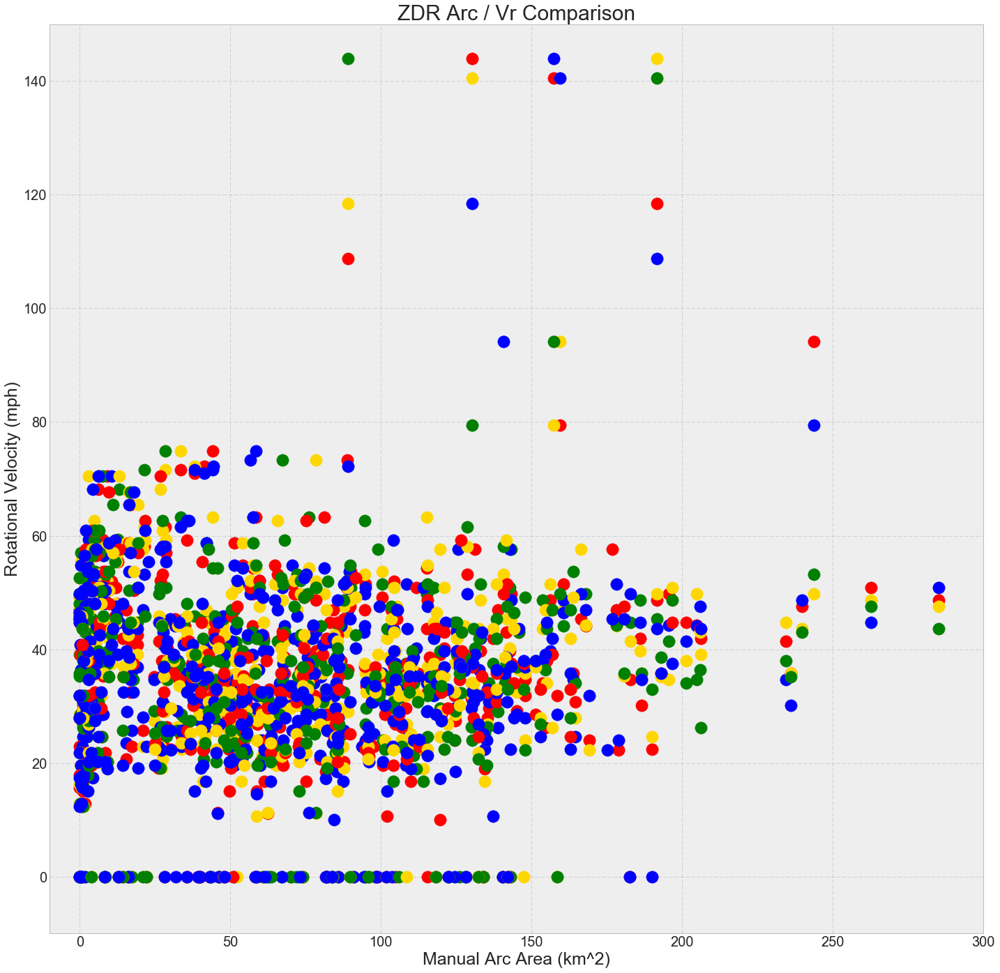

In [42]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
for i in range(len(VR_lm1)):
    plt.scatter(zdr_vdb_lm1[i], VR_lm1[i], s=300, color='red')
    plt.scatter(zdr_vdb_lm2[i], VR_lm2[i], s=300, color='gold')
    plt.scatter(zdr_vdb_lm3[i], VR_lm3[i], s=300, color='green')
    plt.scatter(zdr_vdb_list[i], VR_list[i], s=300, color='blue') 
for i in range(len(VR_Nlm1)):
    plt.scatter(zdr_vdb_nt_lm1[i], VR_Nlm1[i], s=300, color='red')
    plt.scatter(zdr_vdb_nt_lm2[i], VR_Nlm2[i], s=300, color='gold')
    plt.scatter(zdr_vdb_nt_lm3[i], VR_Nlm3[i], s=300, color='green')
    plt.scatter(zdr_vdb_nt_list[i], VR_Nlist[i], s=300, color='blue')
    print(i)
plt.xlabel('Manual Arc Area (km^2)', size = 25)
plt.ylabel('Rotational Velocity (mph)', size = 25)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title('ZDR Arc / Vr Comparison', size = 30)
plt.legend(prop={'size':20})
plt.xlim([-10,300])
plt.ylim([-10,150])
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmVRTorComparisonChart325.png")
plt.show()

C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


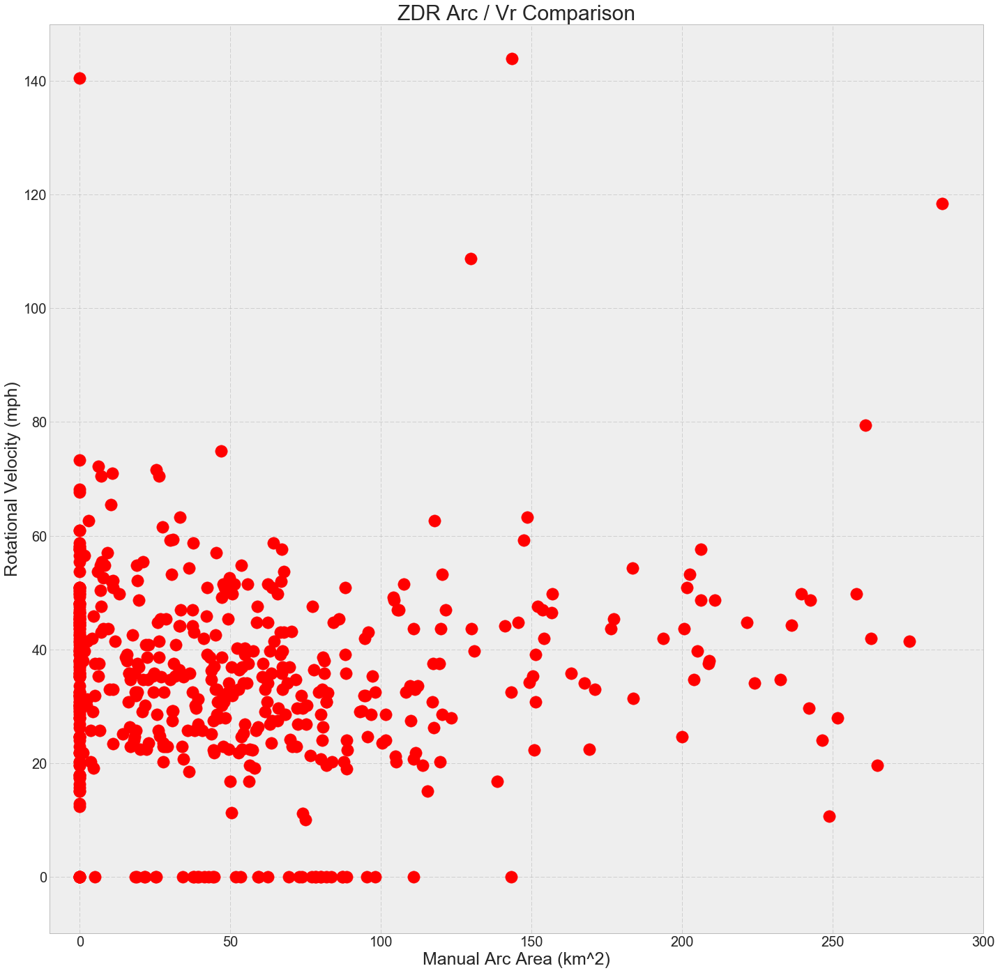

In [43]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
for i in range(len(VR_lm1)):
    plt.scatter(alg_lm1[i], VR_lm1[i], s=300, color='red')
    #plt.scatter(alg_lm2[i], VR_lm2[i], s=300, color='gold')
    #plt.scatter(alg_lm3[i], VR_lm3[i], s=300, color='green')
    #plt.scatter(alg_list[i], VR_list[i], s=300, color='blue') 
for i in range(len(VR_Nlm1)):
    plt.scatter(alg_Nlm1[i], VR_Nlm1[i], s=300, color='red')
    #plt.scatter(alg_Nlm2[i], VR_Nlm2[i], s=300, color='gold')
    #plt.scatter(alg_Nlm3[i], VR_Nlm3[i], s=300, color='green')
    #plt.scatter(alg_Nlist[i], VR_Nlist[i], s=300, color='blue')  
plt.xlabel('Manual Arc Area (km^2)', size = 25)
plt.ylabel('Rotational Velocity (mph)', size = 25)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title('ZDR Arc / Vr Comparison', size = 30)
plt.legend(prop={'size':20})
plt.xlim([-10,300])
plt.ylim([-10,150])
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmVRTorComparisonChart325.png")
plt.show()

In [44]:
plt.style.use('seaborn-whitegrid')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
j = 0
for i in range(len(VR_lm1)):
    #plt.scatter(alg_lm1[i], VR_lm1[i], s=300, color='red')
    #plt.scatter(alg_lm2[i], VR_lm2[i], s=300, color='gold')
    #plt.scatter(alg_lm3[i], VR_lm3[i], s=300, color='green')
    if j == 0:
        plt.scatter(alg_list[i][alg_list[i]>0], VR_list[i]*units('mph').to('m/s'), s=300, color='green', alpha=0.5, label = 'All Observations, r = -0.218*')
        plt.scatter(np.mean(alg_list[i][alg_list[i]>0]), np.mean(VR_list[i]*units('mph').to('m/s')), s=300, color='red', label = 'All Storm Means, r = -0.182')
        plt.scatter(np.mean(alg_list[i][alg_list[i]>0]), np.max(VR_list[i]*units('mph').to('m/s')), s=300, color='yellow', label = 'Arc Area Means : VR Maxes, r = 0.036')
        #plt.legend(prop={'size':20})
        j = j + 1
    else:
        plt.scatter(alg_list[i][alg_list[i]>0], VR_list[i]*units('mph').to('m/s'), s=300, color='green', alpha=0.5)
        plt.scatter(np.mean(alg_list[i][alg_list[i]>0]), np.mean(VR_list[i]*units('mph').to('m/s')), s=300, color='red')
        plt.scatter(np.mean(alg_list[i][alg_list[i]>0]), np.max(VR_list[i]*units('mph').to('m/s')), s=300, color='yellow')
for i in range(len(VR_Nlm1)):
    #plt.scatter(alg_Nlm1[i], VR_Nlm1[i], s=300, color='red')
    #plt.scatter(alg_Nlm2[i], VR_Nlm2[i], s=300, color='gold')
    #plt.scatter(alg_Nlm3[i], VR_Nlm3[i], s=300, color='green')
    plt.scatter(alg_Nlist[i][alg_Nlist[i]>0], VR_Nlist[i]*units('mph').to('kt'), s=300, color='green', alpha=0.5)
    plt.scatter(np.mean(alg_Nlist[i][alg_list[i]>0]), np.mean(VR_Nlist[i]*units('mph').to('kt')), s=300, color='red')
    plt.scatter(np.mean(alg_Nlist[i][alg_list[i]>0]), np.max(VR_Nlist[i]*units('mph').to('kt')), s=300, color='yellow')

#plt.xlabel('Algorithm Arc Area (km$^2$)', size = 50)
plt.xlabel('Arc Mean (dB)', size = 50)
plt.ylabel('Rotational Velocity (m/s)', size = 50)
plt.xticks(size=45)
plt.yticks(size=45)
plt.title('3.25 dB Z$_D$$_R$ Arc Area and Vr', size = 55)
plt.title('Mean Arc Z$_D$$_R$ Value and Vr', size = 55)
plt.legend(prop={'size':40}, loc=(0.45, 0.85))
plt.xlim([3,5.5])
plt.ylim([-5,70])
plt.grid(True, linewidth=3)
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
plt.tight_layout()
#plt.savefig("ThesisplotMeans.png")
plt.show()

ValueError: x and y must be the same size

In [45]:
#Let's try some actual correlations
VR_con = np.concatenate(VR_list)
#Now go with lags
#Lag -1
VRm1_con = np.concatenate(VR_lm1)
zdr_lm1_con = np.concatenate(zdr_vdb_lm1)
#Lag -2
VRm2_con = np.concatenate(VR_lm2)
zdr_lm2_con = np.concatenate(zdr_vdb_lm2)
#Lag -3
VRm3_con = np.concatenate(VR_lm3)
zdr_lm3_con = np.concatenate(zdr_vdb_lm3)
#Lag -1
VRNm1_con = np.concatenate(VR_Nlm1)
zdr_nt_lm1_con = np.concatenate(zdr_vdb_nt_lm1)
#Lag -2
VRNm2_con = np.concatenate(VR_Nlm2)
zdr_nt_lm2_con = np.concatenate(zdr_vdb_nt_lm2)
#Lag -3
VRNm3_con = np.concatenate(VR_Nlm3)
zdr_nt_lm3_con = np.concatenate(zdr_vdb_nt_lm3)

In [46]:
#from scipy import stats
print(stats.linregress(storm_vdb_con, VR_con))
print(stats.pearsonr(storm_vdb_con, VR_con))

LinregressResult(slope=0.016937569992288841, intercept=39.517965712103617, rvalue=0.058824314087498067, pvalue=0.27104043501213954, stderr=0.015364113657815908)
(0.058824314087498088, 0.27104043501219233)


In [47]:
#Let's consolidate both algorithm time series:
alg_con_all = np.zeros((storm_alg_con.shape[0] + storm_nt_alg_con.shape[0]))
VR_con_all = np.zeros((VR_con.shape[0] + VR_Ncon.shape[0]))
alg_con_all[0:storm_alg_con.shape[0]] = storm_alg_con
alg_con_all[storm_alg_con.shape[0]:] = storm_nt_alg_con
VR_con_all[0:VR_con.shape[0]] = VR_con
VR_con_all[VR_con.shape[0]:] = VR_Ncon


In [48]:
#Now let's consolidate all of the means
all_alg_means = []
all_VR_means = []
all_VR_maxes = []
for i in range(len(VR_lm1)):
    all_alg_means.append(np.mean(alg_list[i]))
    all_VR_means.append(np.mean(VR_list[i]))
    all_VR_maxes.append(np.max(VR_list[i]))
for i in range(len(VR_Nlm1)):
    all_alg_means.append(np.mean(alg_Nlist[i]))
    all_VR_means.append(np.mean(VR_Nlist[i]))
    all_VR_maxes.append(np.max(VR_Nlist[i]))

In [49]:
#Now let's consolidate all of the means
all_alg_means = []
all_VR_means = []
all_VR_maxes = []
for i in range(len(VR_lm1)):
    all_alg_means.append(np.mean(alg_list[i][alg_list[i]>0]))
    all_VR_means.append(np.mean(VR_list[i]))
    all_VR_maxes.append(np.max(VR_list[i]))
for i in range(len(VR_Nlm1)):
    all_alg_means.append(np.mean(alg_Nlist[i][alg_Nlist[i]>0]))
    all_VR_means.append(np.mean(VR_Nlist[i]))
    all_VR_maxes.append(np.max(VR_Nlist[i]))
all_alg_means = np.asarray(all_alg_means)
all_VR_means= np.asarray(all_VR_means)
all_VR_maxes= np.asarray(all_VR_maxes)

C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\numpy\core\_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\numpy\core\_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [50]:
#from scipy import stats
print(stats.linregress(alg_con_all, VR_con_all))
print(stats.pearsonr(alg_con_all, VR_con_all)[0]**2)

print(stats.linregress(alg_con_all[alg_con_all>0], VR_con_all[alg_con_all>0]))
print(stats.pearsonr(alg_con_all[alg_con_all>0], VR_con_all[alg_con_all>0])[0]**2)

LinregressResult(slope=0.018897812917885011, intercept=33.437295717572788, rvalue=0.06517734541445723, pvalue=0.11531817167064795, stderr=0.011982741058627186)
0.00424808635528
LinregressResult(slope=0.037992719484228638, intercept=31.109763156841062, rvalue=0.12982413026913481, pvalue=0.0065747096057330381, stderr=0.013912631164204924)
0.0168543048001


In [51]:
print(stats.linregress(all_alg_means[np.isnan(all_alg_means)==False], all_VR_means[np.isnan(all_alg_means)==False]))
print(stats.pearsonr(all_alg_means, all_VR_means)[0]**2)

LinregressResult(slope=-0.02075075145895967, intercept=35.489364650352407, rvalue=-0.07425044038879744, pvalue=0.62384396630572603, stderr=0.042015349822042629)
nan


C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\stats.py:5277: RuntimeWarning: invalid value encountered in less
  x = np.where(x < 1.0, x, 1.0)  # if x > 1 then return 1.0


In [52]:
print(stats.linregress(all_alg_means, all_VR_maxes))
print(stats.pearsonr(all_alg_means, all_VR_maxes)[0]**2)

LinregressResult(slope=nan, intercept=nan, rvalue=nan, pvalue=nan, stderr=nan)
nan


C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\_distn_infrastructure.py:1818: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\stats.py:5277: RuntimeWarning: invalid value encountered in less
  x = np.where(x < 1.0, x, 1.0)  # if x > 1 then return 1.0


In [53]:

print(stats.linregress(zdr_lm1_con, VRm1_con))
print(stats.linregress(zdr_nt_lm1_con, VRNm1_con))


LinregressResult(slope=0.019794288507366951, intercept=39.717664601120973, rvalue=0.068756623170851489, pvalue=0.21709220778884891, stderr=0.01600546990053809)
LinregressResult(slope=0.0094332073462053603, intercept=24.316175944500728, rvalue=0.031550835965610757, pvalue=0.64861050306317525, stderr=0.020670886327531533)


In [54]:
print(stats.linregress(zdr_lm2_con, VRm2_con))
print(stats.linregress(zdr_nt_lm2_con, VRNm2_con))


LinregressResult(slope=0.014824829323649636, intercept=40.29560319685524, rvalue=0.052595910787491748, pvalue=0.36722170195666037, stderr=0.016415817812431056)
LinregressResult(slope=0.0037799198105964954, intercept=24.395143205522594, rvalue=0.012446689400606399, pvalue=0.8650218471009673, stderr=0.02220620210239023)


In [55]:
print(stats.linregress(zdr_lm3_con, VRm3_con))
print(stats.linregress(zdr_nt_lm3_con, VRNm3_con))

LinregressResult(slope=0.010833073563801861, intercept=40.675867872633503, rvalue=0.039877470073032932, pvalue=0.51567316357121262, stderr=0.016643232918323564)
LinregressResult(slope=0.013433167730423362, intercept=23.467039388702442, rvalue=0.043205396119525619, pvalue=0.57930367664708882, stderr=0.024182029423321823)


In [56]:
#Let's look at nrot
NR_A = StormA_VR[:,4]
#B is all 0s since nrot data is bad
NR_B = StormB_VR[:,4]
NR_BB = StormBB_VR[:,4]
NR_C = StormC_VR[:,4]
NR_CC = StormCC_VR[:,4]
NR_D = StormD_VR[:,4]
#Since VDB's time series is missing 1:46, delete it from the Vr time series
NR_D = np.delete(NR_D, 3)
NR_DD = StormDD_VR[:,4]
NR_E = StormE_VR[:,4]
NR_EE = StormEE_VR[:,4]
#Remove the second to last frame, since manual data is not available to compare it with
NR_EE = np.delete(NR_EE, 10)
NR_F = StormF_VR[:,4]
NR_FF = StormFF_VR[:,4]
NR_G = StormG_VR[:,4]
NR_GG = StormGG_VR[:,4]
NR_H = StormH_VR[:,4]
NR_HH = StormHH_VR[:,4]
NR_I = StormI_VR[:,4]
NR_II = StormII_VR[:,4]
NR_J = StormJ_VR[:,4]
NR_K = StormK_VR[:,4]
NR_L = StormL_VR[:,4]
NR_M = StormM_VR[:,4]
NR_O = StormO_VR[:,4]
NR_R = StormR_VR[:,4]
NR_S = StormS_VR[:,4]
NR_W = StormW_VR[:,4]
NR_X = StormX_VR[:,4]
NR_Y = StormY_VR[:,4]
NR_Z = StormZ_VR[:,4]

In [57]:
NR_list = [NR_A, NR_B[0:19], NR_BB, NR_C, NR_CC, NR_D, NR_DD, NR_E[0:12], NR_EE, NR_F, NR_FF, NR_G, NR_GG, NR_H, NR_HH, NR_I, NR_II, NR_J, NR_K, NR_L, NR_M[0:4], NR_O, NR_R, NR_S, NR_W, NR_X, NR_Y, NR_Z]
NR_con = np.concatenate(NR_list)

In [58]:
print(np.shape(NR_con), np.shape(VR_con))

(352,) (352,)


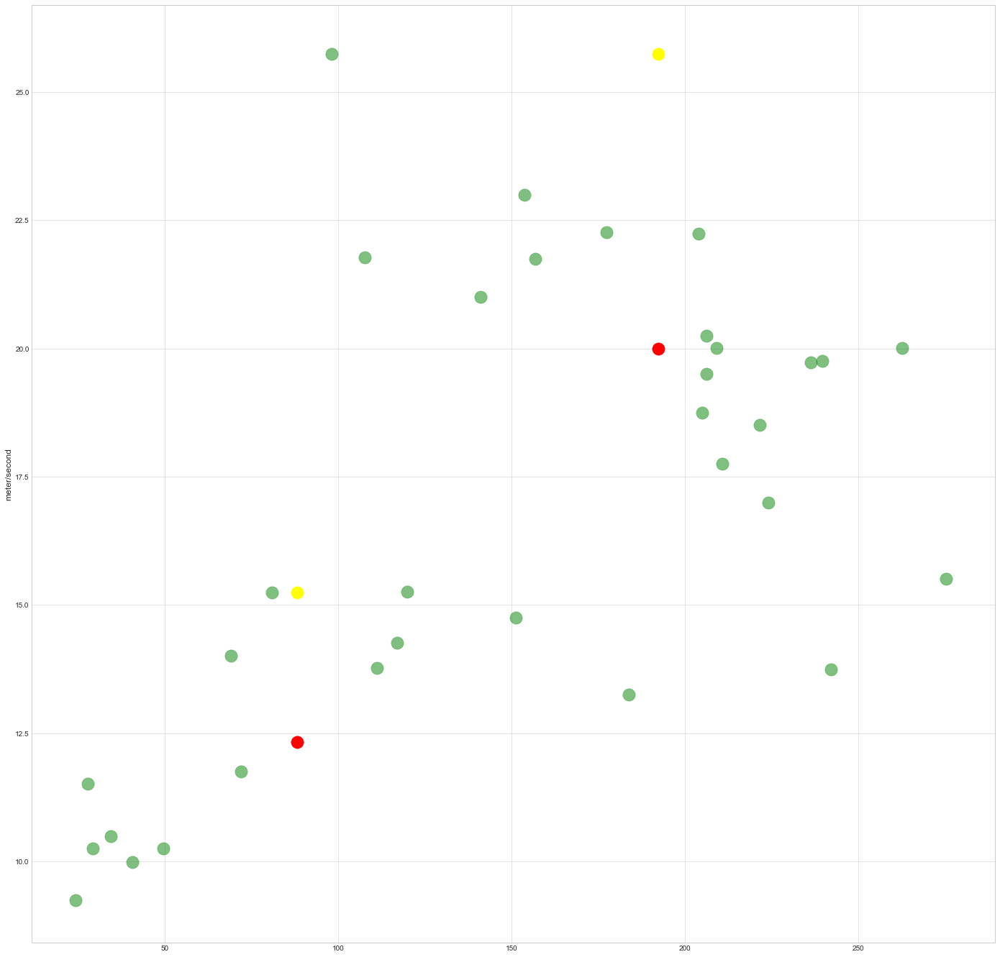

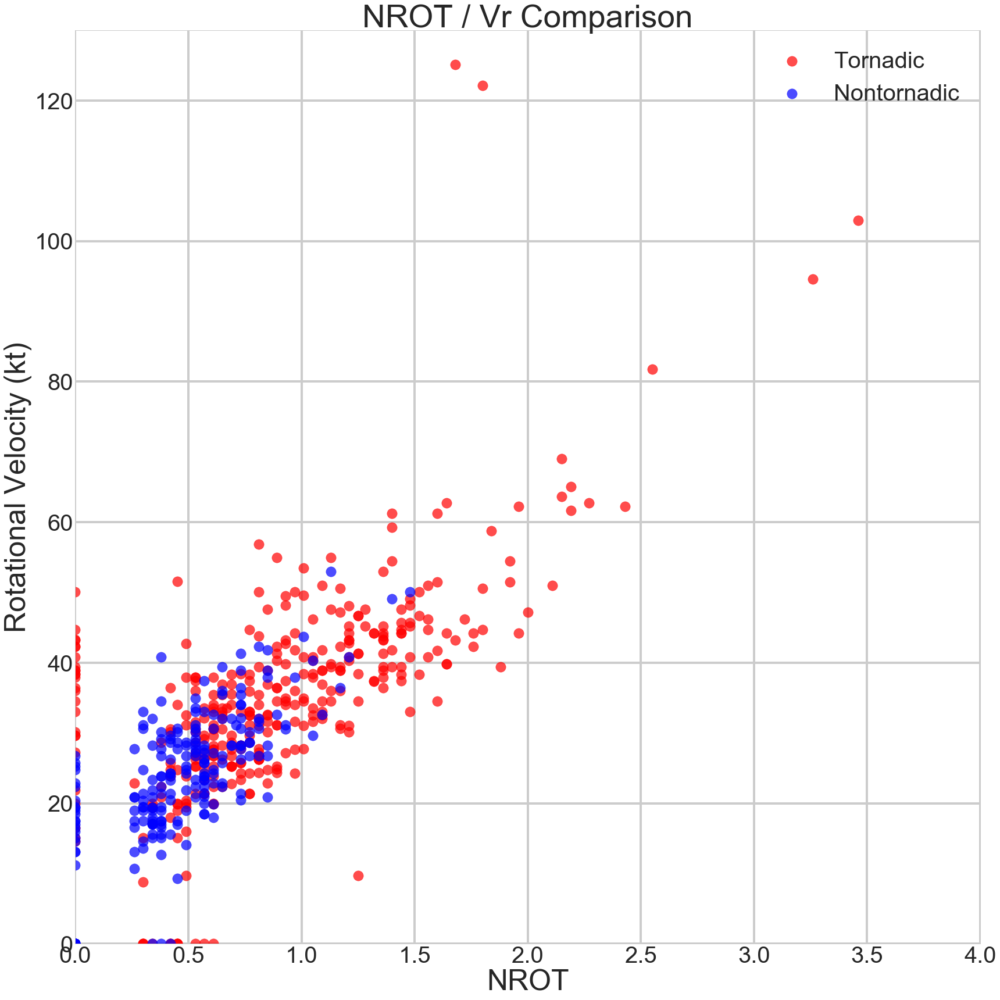

In [59]:
plt.style.use('seaborn-whitegrid')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
plt.scatter(NR_con, VR_con*units('mph').to('kt'), s=300, color='red', alpha=0.7, label='Tornadic')
plt.scatter(NR_Ncon, VR_Ncon*units('mph').to('kt'), s=300, color='blue', alpha=0.7, label='Nontornadic')
#plt.scatter(zdr_vdb_list[i], VR_list[i], s=300, color='blue')    
plt.xlabel('NROT', size = 50)
plt.ylabel('Rotational Velocity (kt)', size = 50)
plt.xticks(size=40)
plt.yticks(size=40)
plt.title('NROT / Vr Comparison', size = 55)
plt.legend(prop={'size':40})
plt.xlim([0,4])
plt.ylim([0,130])
plt.grid(True, linewidth=4)
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmVRTorComparisonChart325.png")
plt.tight_layout()
plt.savefig('VrNROTComp.png')
plt.show()

In [60]:
print(stats.linregress(NR_con[NR_con*VR_con>0], VR_con[NR_con*VR_con>0]))
print(stats.pearsonr(NR_con[NR_con*VR_con>0], VR_con[NR_con*VR_con>0]))

print(stats.linregress(NR_Ncon[NR_Ncon*VR_Ncon>0], VR_Ncon[NR_Ncon*VR_Ncon>0]))
print(stats.pearsonr(NR_Ncon[NR_Ncon*VR_Ncon>0], VR_Ncon[NR_Ncon*VR_Ncon>0]))
print(NR_Ncon.shape)

NR_tot = np.zeros(NR_con.shape[0]+NR_Ncon.shape[0])
VR_tot = np.zeros(NR_con.shape[0]+NR_Ncon.shape[0])

NR_tot[0:NR_con.shape[0]] = NR_con
NR_tot[NR_con.shape[0]:] = NR_Ncon

VR_tot[0:VR_con.shape[0]] = VR_con
VR_tot[VR_con.shape[0]:] = VR_Ncon

print(stats.linregress(NR_tot[NR_tot*VR_tot>0], VR_tot[NR_tot*VR_tot>0]))
print(stats.pearsonr(NR_tot[NR_tot*VR_tot>0], VR_tot[NR_tot*VR_tot>0]))

LinregressResult(slope=25.010107540744311, intercept=17.51109297458547, rvalue=0.74935075220326353, pvalue=1.2636656788349387e-57, stderr=1.2532042755791433)
(0.74935075220326297, 1.2636656788353294e-57)
LinregressResult(slope=26.934183232261006, intercept=15.25696963294798, rvalue=0.68449967506646203, pvalue=6.0519263927318526e-26, stderr=2.1622683990530343)
(0.68449967506646148, 6.0519263927326378e-26)
(233,)
LinregressResult(slope=25.762974396063324, intercept=16.450815645986452, rvalue=0.78512909879314563, pvalue=8.1700129244992092e-104, stderr=0.91901820822402513)
(0.78512909879314585, 8.1700129244988213e-104)


C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


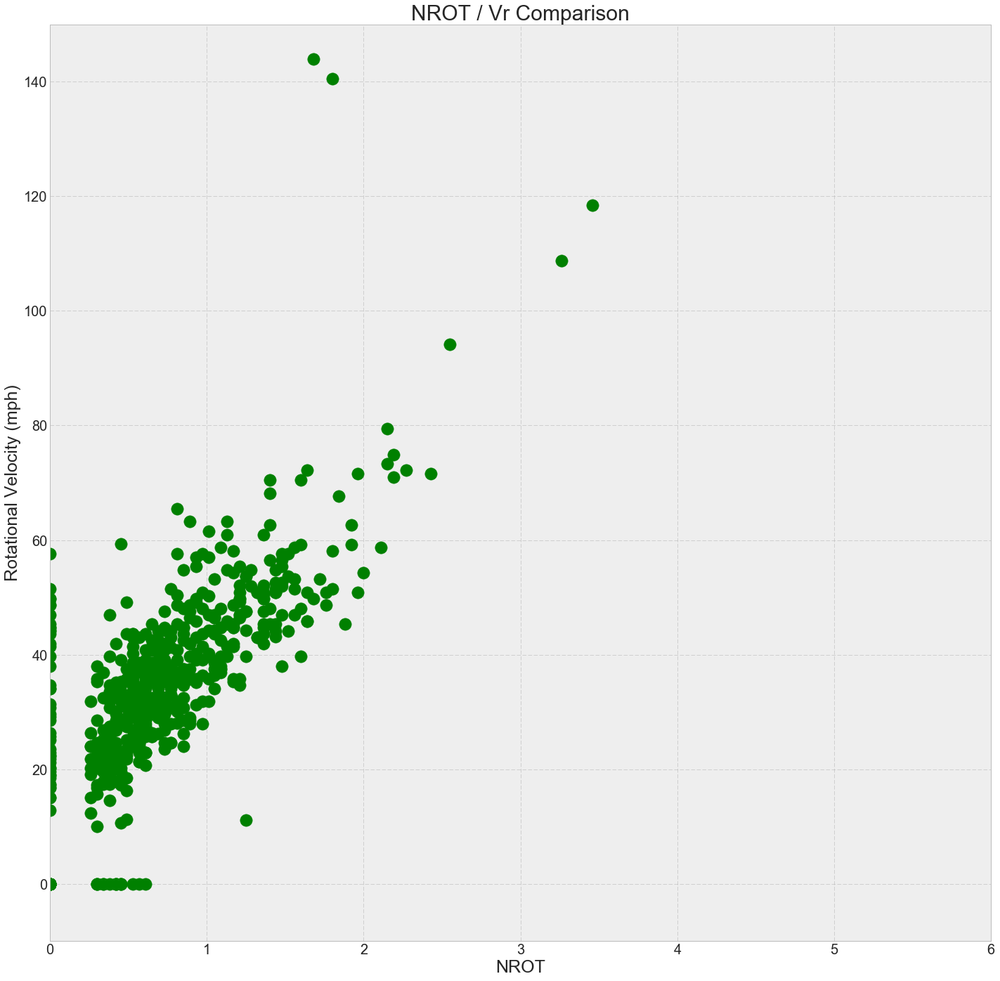

In [61]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
plt.scatter(NR_tot, VR_tot, s=300, color='green')
#plt.scatter(NR_Ncon, VR_Ncon, s=300, color='red')
#plt.scatter(zdr_vdb_list[i], VR_list[i], s=300, color='blue')    
plt.xlabel('NROT', size = 25)
plt.ylabel('Rotational Velocity (mph)', size = 25)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title('NROT / Vr Comparison', size = 30)
plt.legend(prop={'size':20})
plt.xlim([0,6])
plt.ylim([-10,150])
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmVRTorComparisonChart325.png")
plt.show()

C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


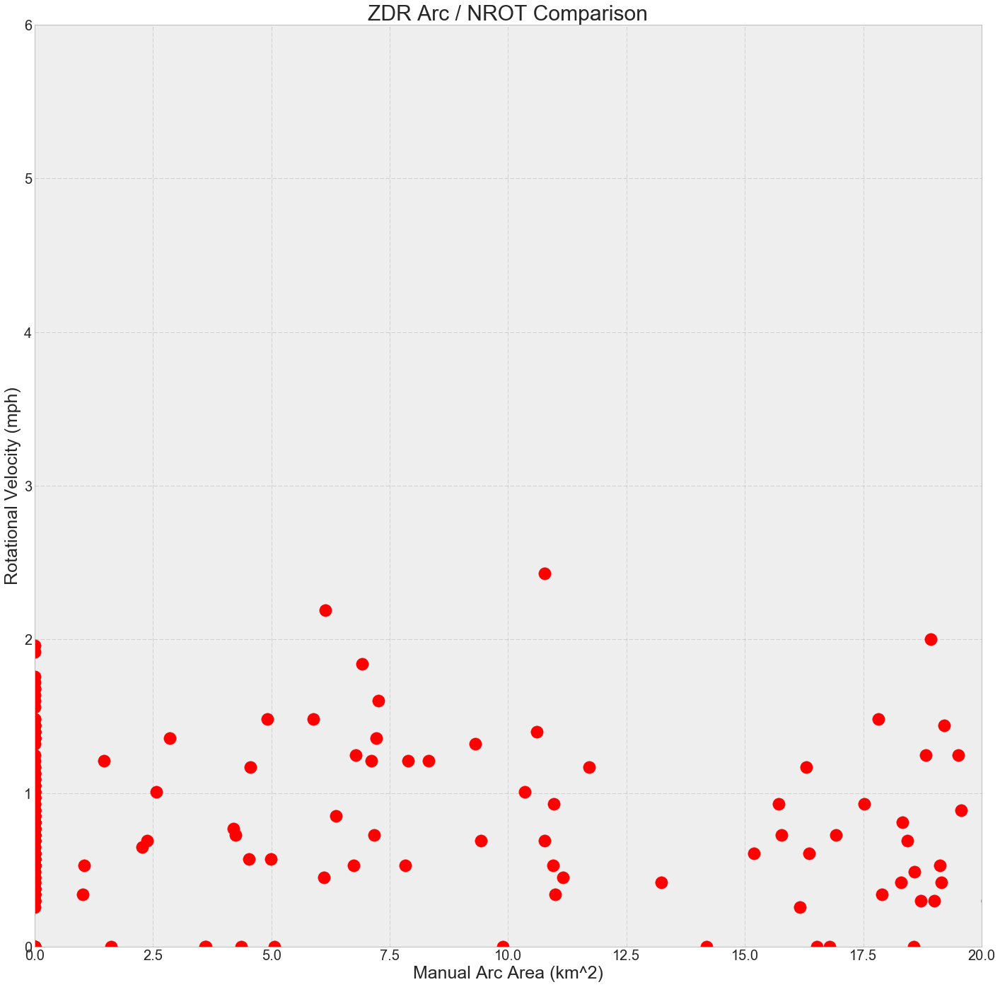

In [62]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
#plt.scatter(storm_vdb_con, NR_con, s=300, color='green')
#plt.scatter(storm_nt_vdb_con, NR_Ncon, s=300, color='green')

plt.scatter(storm_alg_con, NR_con, s=300, color='red')
plt.scatter(storm_nt_alg_con, NR_Ncon, s=300, color='red')
#plt.scatter(zdr_vdb_list[i], VR_list[i], s=300, color='blue')    
plt.xlabel('Manual Arc Area (km^2)', size = 25)
plt.ylabel('Rotational Velocity (mph)', size = 25)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title('ZDR Arc / NROT Comparison', size = 30)
plt.legend(prop={'size':20})
plt.xlim([0, 20])
plt.ylim([-0,6])
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmVRTorComparisonChart325.png")
plt.show()

In [63]:
print(storm_nt_vdb_con.shape)

(233,)


In [64]:
print(NR_Ncon.shape)

(233,)


C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


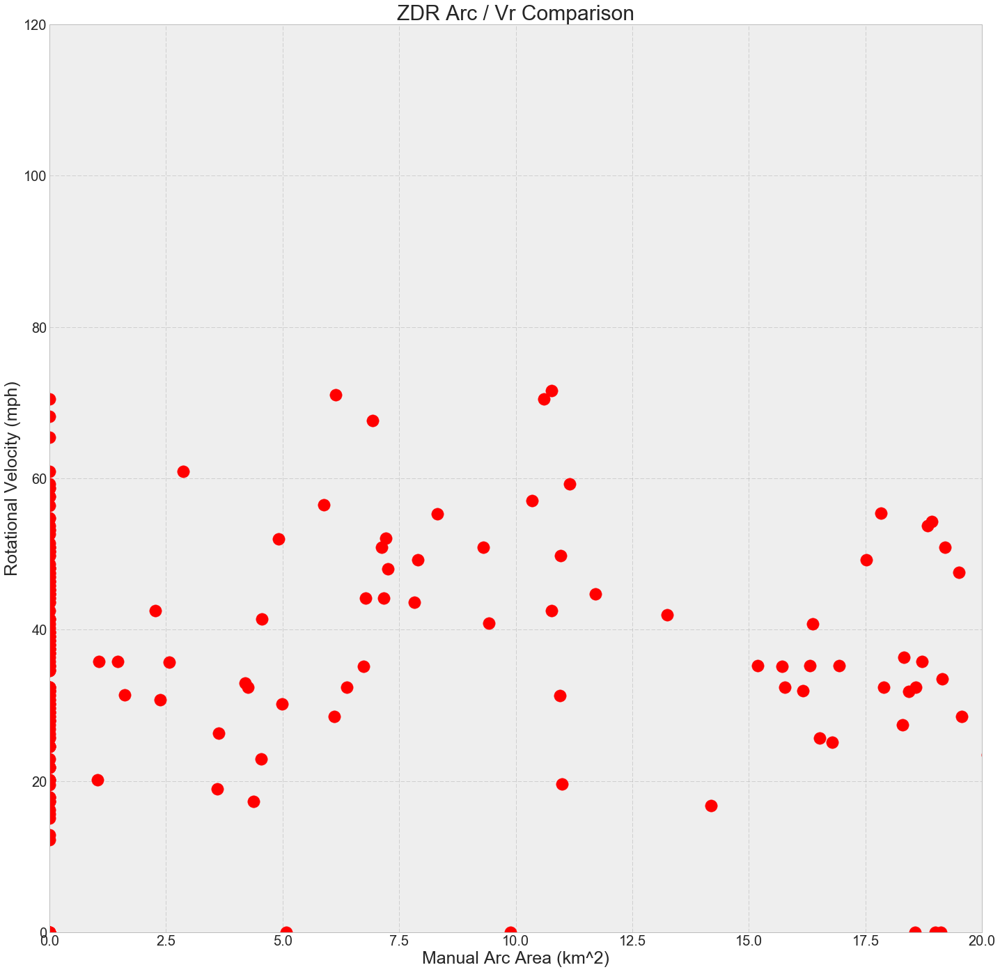

In [65]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
#plt.scatter(storm_vdb_con, VR_con, s=300, color='green')
#plt.scatter(storm_nt_vdb_con, VR_Ncon, s=300, color='green')

plt.scatter(storm_alg_con, VR_con, s=300, color='red')
plt.scatter(storm_nt_alg_con, VR_Ncon, s=300, color='red')

#plt.scatter(zdr_vdb_list[i], VR_list[i], s=300, color='blue')    
plt.xlabel('Manual Arc Area (km^2)', size = 25)
plt.ylabel('Rotational Velocity (mph)', size = 25)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title('ZDR Arc / Vr Comparison', size = 30)
plt.legend(prop={'size':20})
plt.xlim([0,20])
plt.ylim([-0,120])
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
#plt.savefig("AlgorithmVRTorComparisonChart325.png")
plt.show()

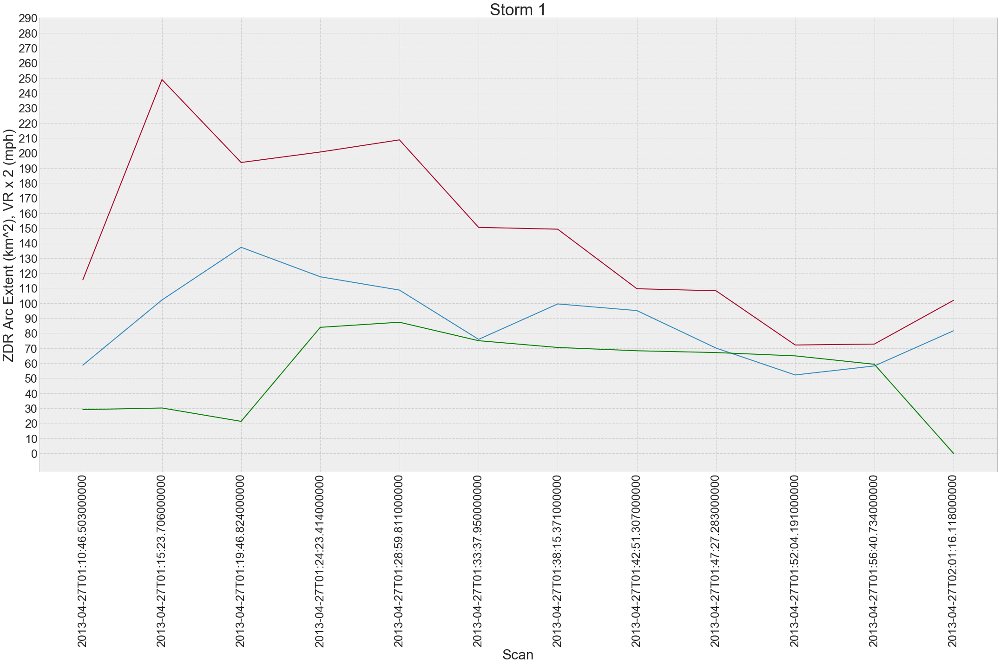

In [66]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm1_alg), 1)
ax1.plot(x, vdb_storm1, label = 'Manual')
ax1.plot(storm1_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_1*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm1_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 1', size = 35)

plt.tight_layout()


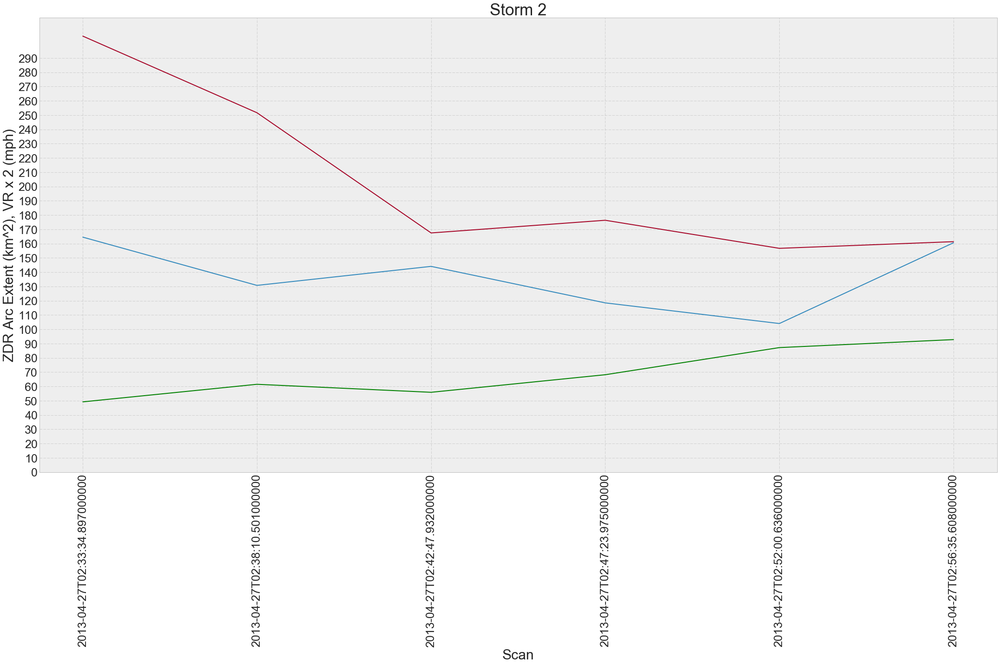

In [67]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm2_alg), 1)
ax1.plot(x, vdb_storm2, label = 'Manual')
ax1.plot(storm2_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_2*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm2_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 2', size = 35)

plt.tight_layout()


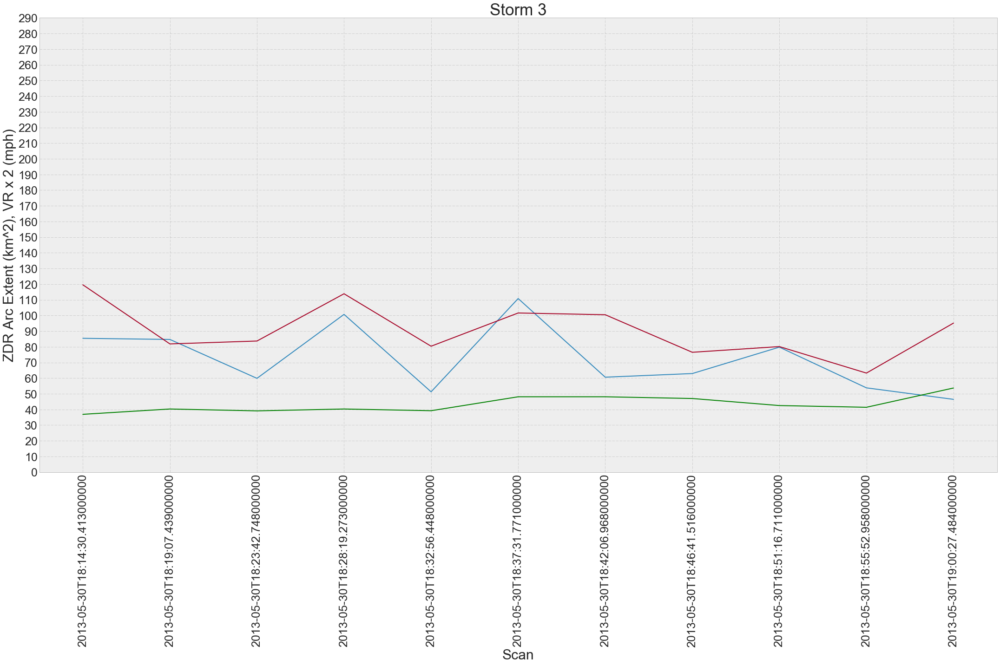

In [68]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm3_alg), 1)
ax1.plot(x, vdb_storm3, label = 'Manual')
ax1.plot(storm3_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_3*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm3_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 3', size = 35)

plt.tight_layout()


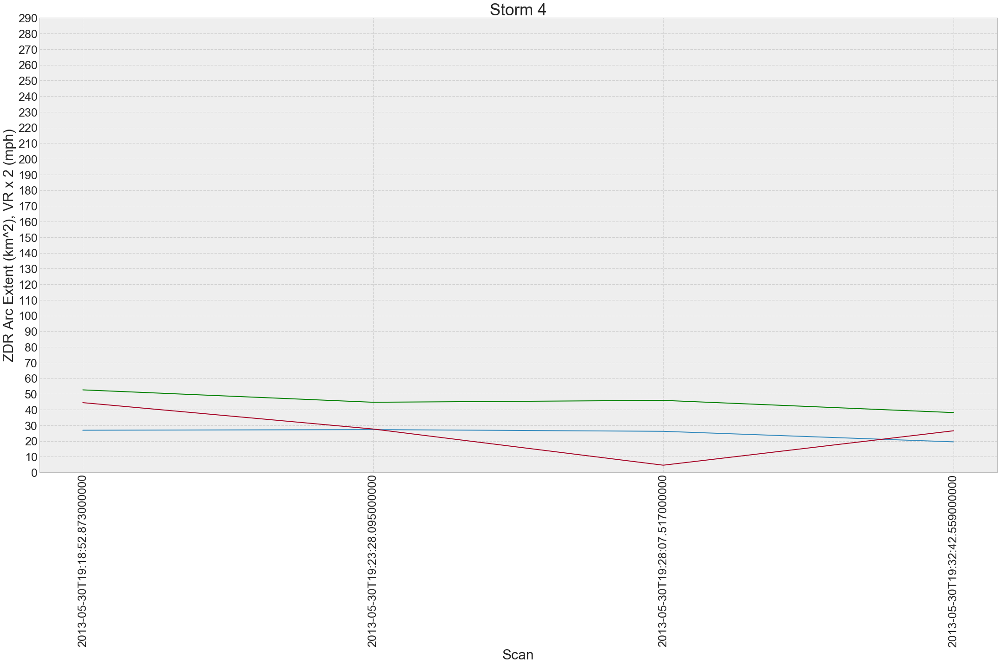

In [69]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm4_alg), 1)
ax1.plot(x, vdb_storm4, label = 'Manual')
ax1.plot(storm4_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_4*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm4_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 4', size = 35)

plt.tight_layout()


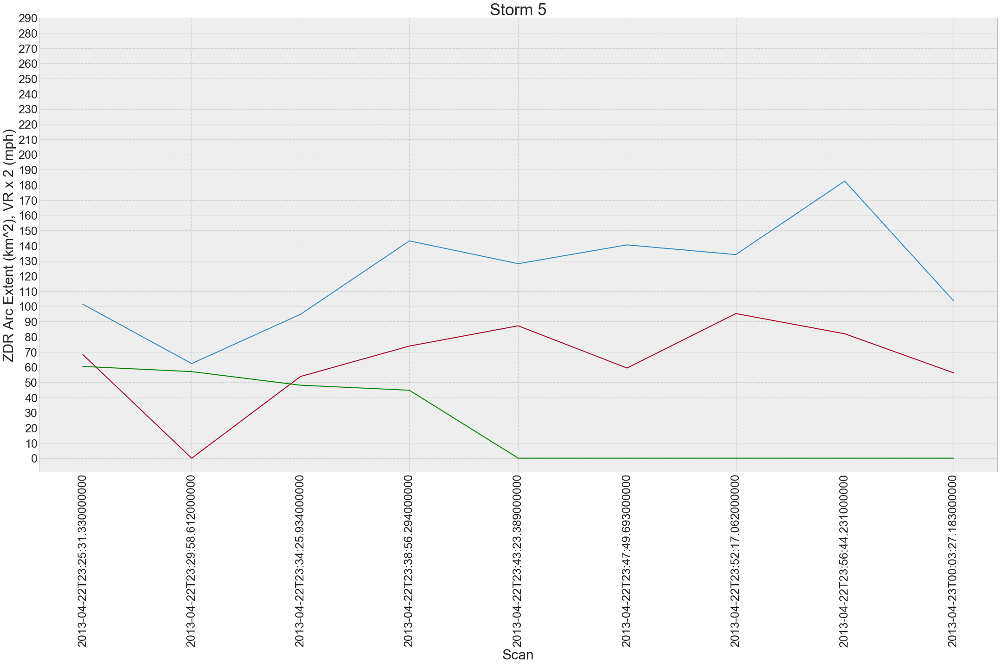

In [70]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm5_alg), 1)
ax1.plot(x, vdb_storm5_c, label = 'Manual')
ax1.plot(storm5_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_5*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm5_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 5', size = 35)

plt.tight_layout()


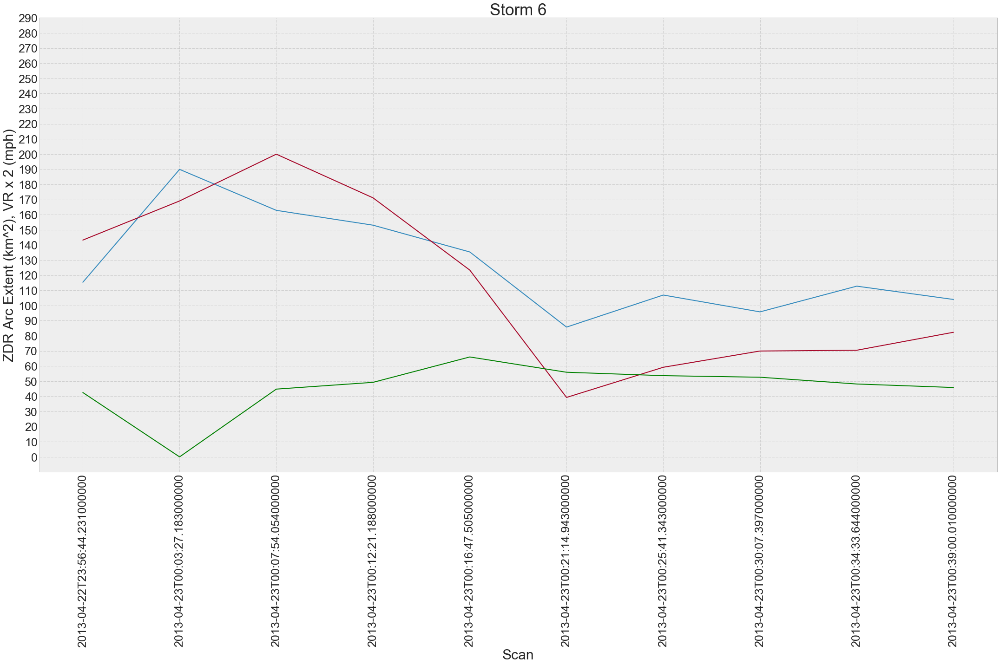

In [71]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm6_alg), 1)
ax1.plot(x, vdb_storm6_c, label = 'Manual')
ax1.plot(storm6_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_6*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm6_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 6', size = 35)

plt.tight_layout()


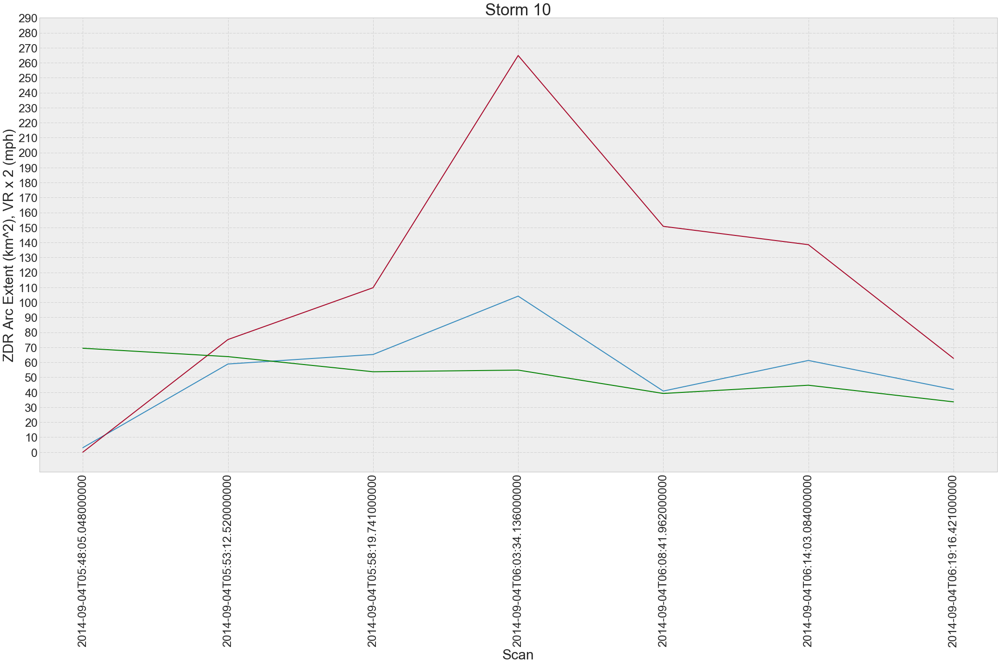

In [72]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm10_alg[::2]), 1)
ax1.plot(x, vdb_storm10, label = 'Manual')
ax1.plot(storm10_alg[::2], label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_10*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm10_times[::2], size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 10', size = 35)

plt.tight_layout()


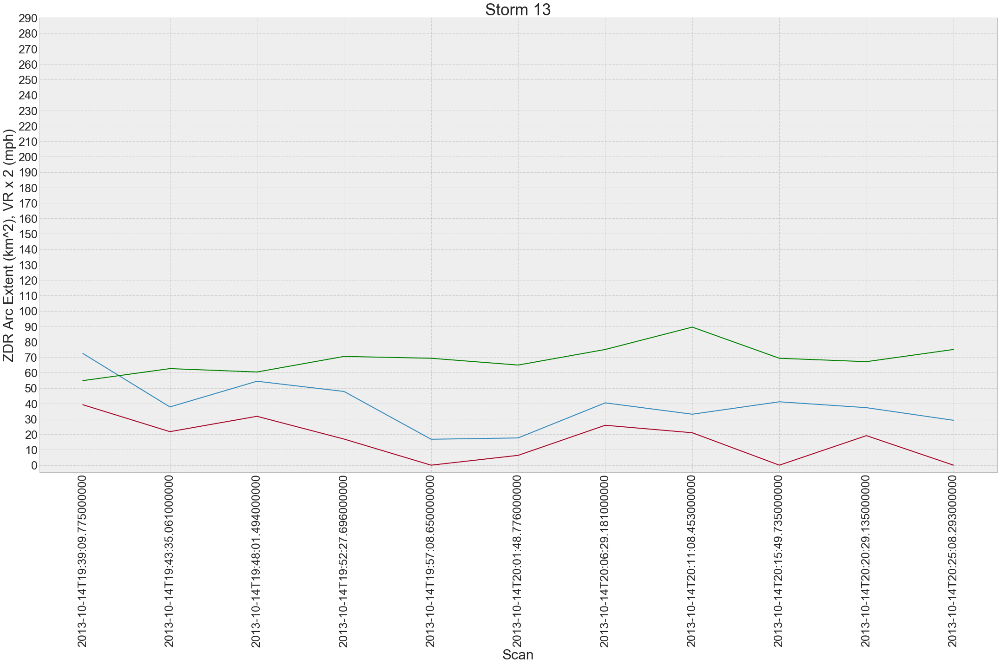

In [73]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm13_alg), 1)
ax1.plot(x, vdb_storm13, label = 'Manual')
ax1.plot(storm13_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_13*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm13_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 13', size = 35)

plt.tight_layout()


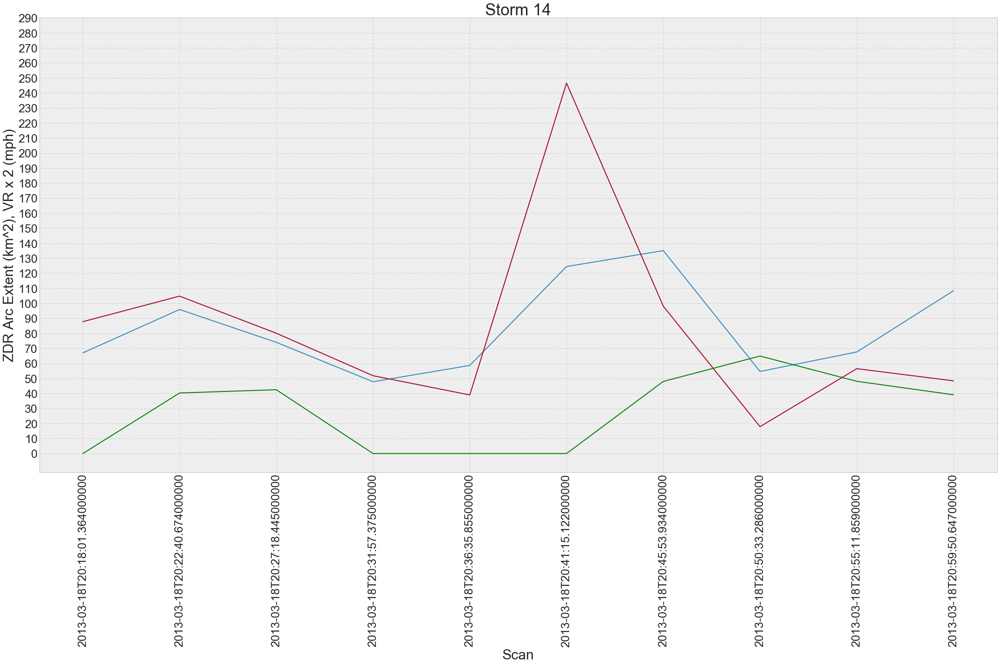

In [74]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm14_alg), 1)
ax1.plot(x, vdb_storm14, label = 'Manual')
ax1.plot(storm14_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_14*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm14_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 14', size = 35)

plt.tight_layout()


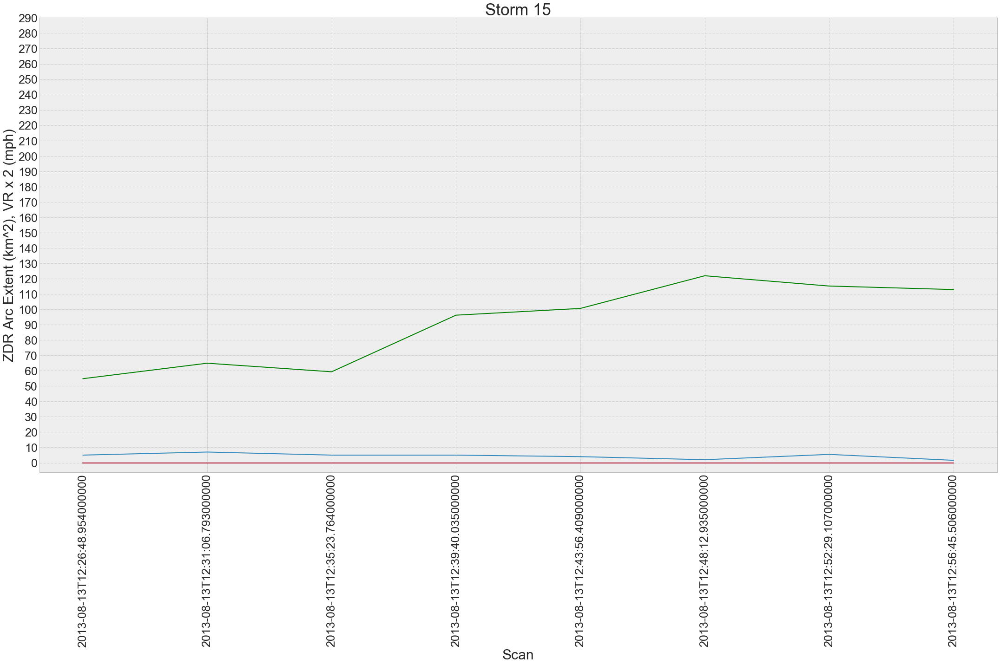

In [75]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm15_alg), 1)
ax1.plot(x, vdb_storm15, label = 'Manual')
ax1.plot(storm15_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_15*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm15_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 15', size = 35)

plt.tight_layout()


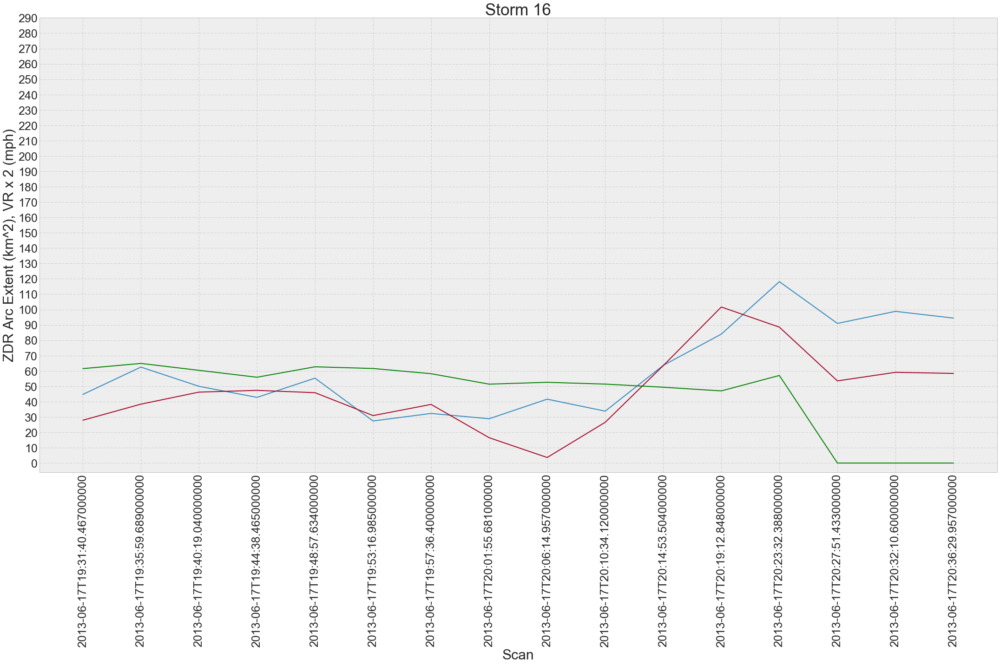

In [76]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm16_alg), 1)
ax1.plot(x, vdb_storm16, label = 'Manual')
ax1.plot(storm16_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_16*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm16_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 16', size = 35)

plt.tight_layout()


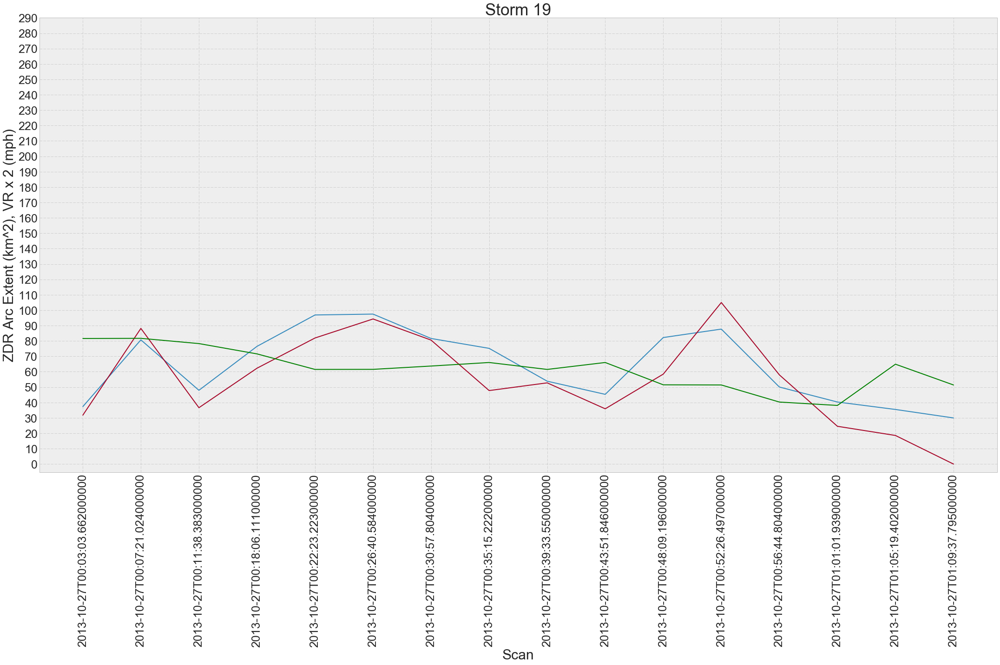

In [77]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm19_alg), 1)
ax1.plot(x, vdb_storm19, label = 'Manual')
ax1.plot(storm19_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_19*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm19_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 19', size = 35)

plt.tight_layout()


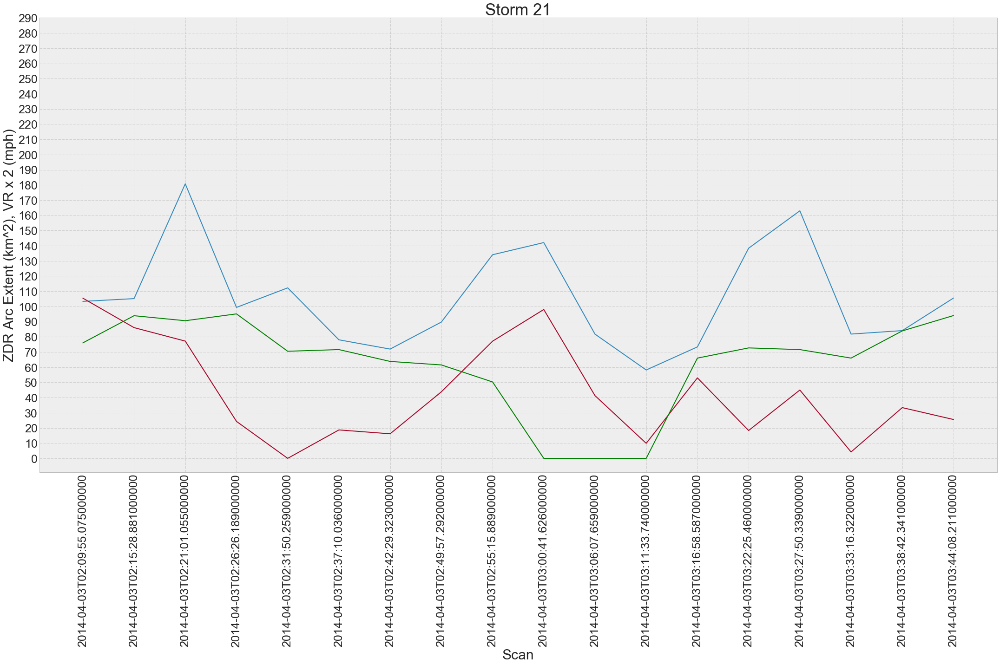

In [78]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm21_alg[::2]), 1)
ax1.plot(x, vdb_storm21, label = 'Manual')
ax1.plot(storm21_alg[::2], label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_21[::2]*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm21_times[::2], size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 21', size = 35)

plt.tight_layout()


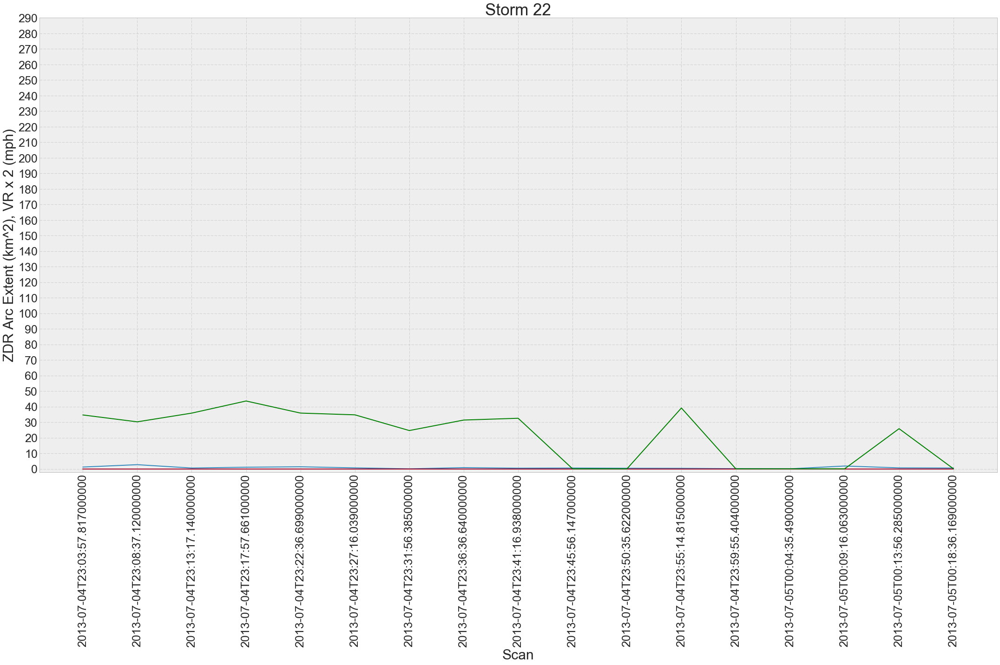

In [79]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm22_alg), 1)
ax1.plot(x, vdb_storm22_c, label = 'Manual')
ax1.plot(storm22_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_22*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm22_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 22', size = 35)

plt.tight_layout()


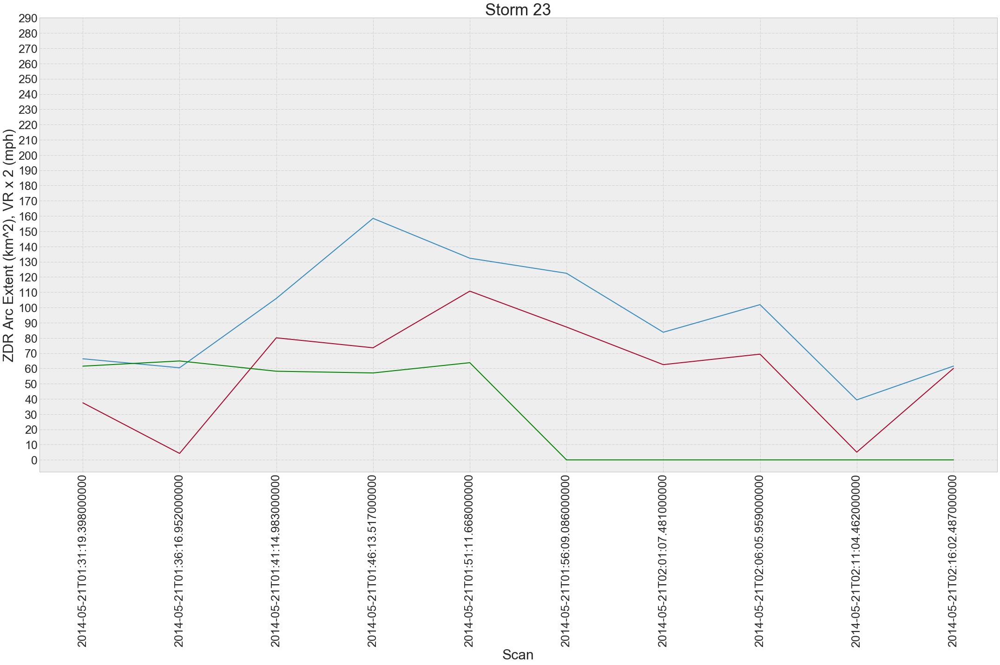

In [80]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm23_alg), 1)
ax1.plot(x, vdb_storm23, label = 'Manual')
ax1.plot(storm23_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_23*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm23_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 23', size = 35)

plt.tight_layout()

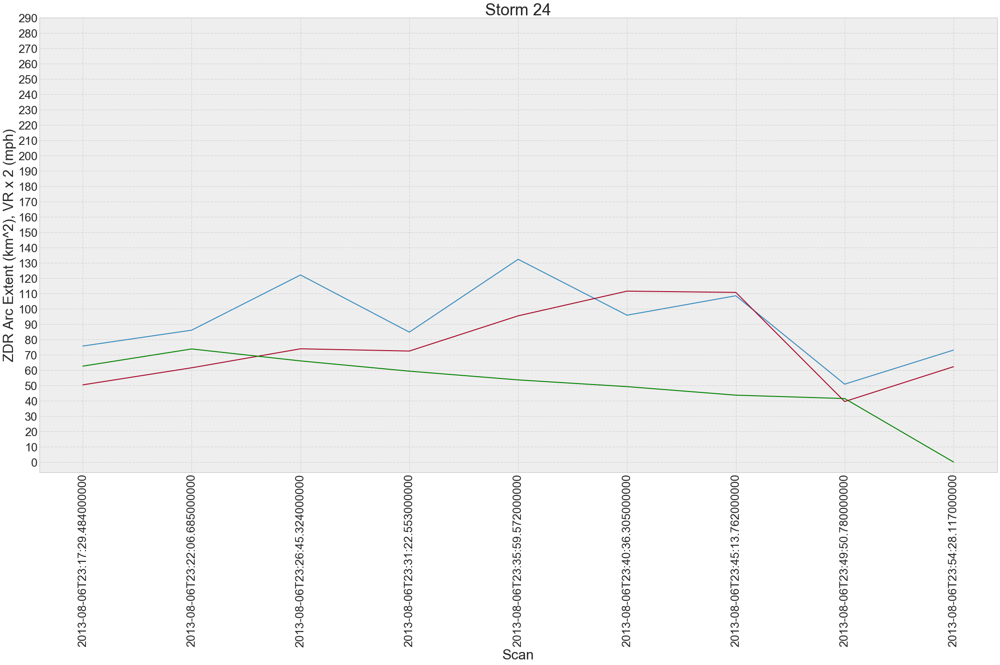

In [81]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm24_alg), 1)
ax1.plot(x, vdb_storm24, label = 'Manual')
ax1.plot(storm24_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_24*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm24_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 24', size = 35)

plt.tight_layout()

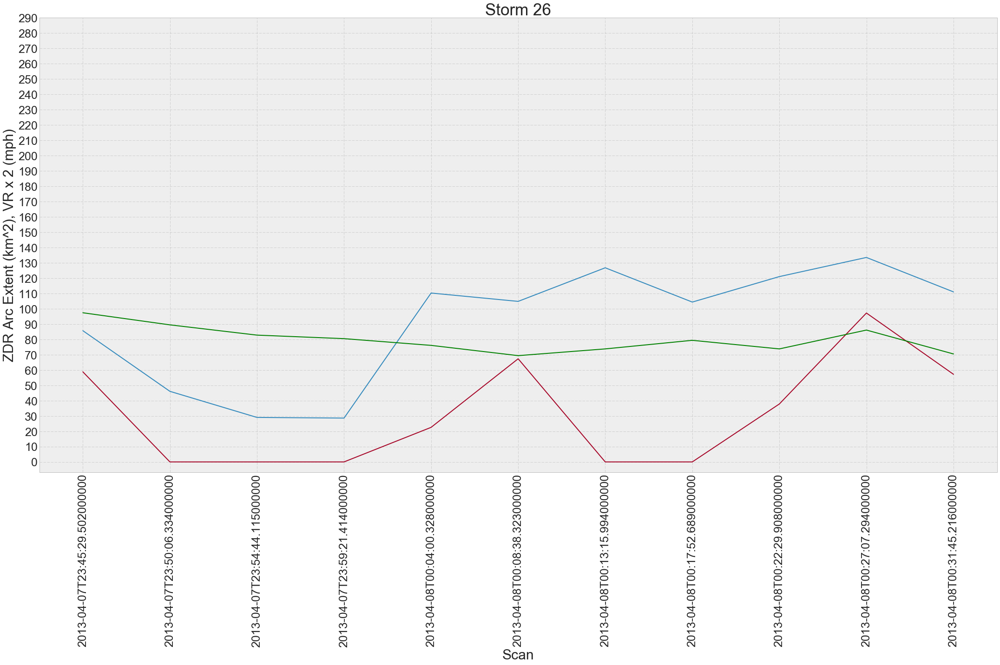

In [82]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm26_alg), 1)
ax1.plot(x, vdb_storm26_c, label = 'Manual')
ax1.plot(storm26_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_26*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm26_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 26', size = 35)

plt.tight_layout()

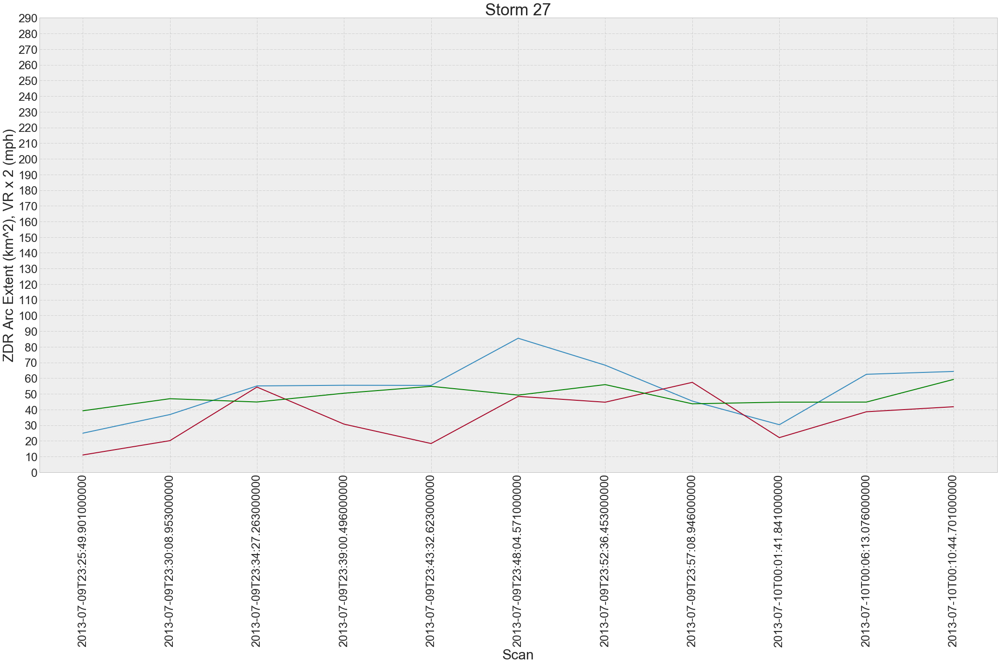

In [83]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm27_alg_c), 1)
ax1.plot(x, vdb_storm27_c, label = 'Manual')
ax1.plot(storm27_alg_c, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_27*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm27_times_c, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 27', size = 35)

plt.tight_layout()

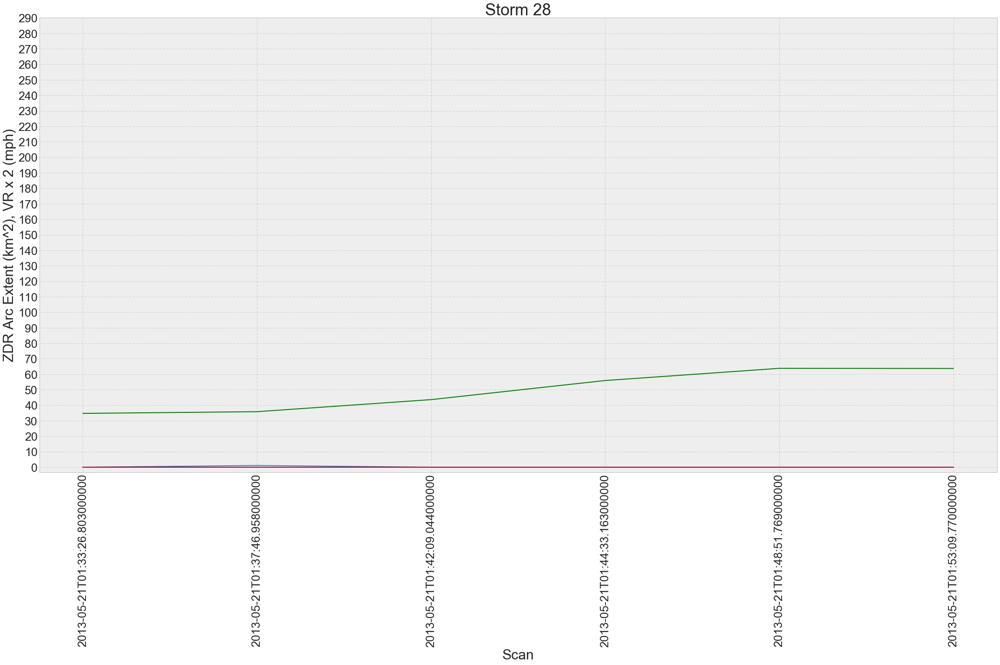

In [84]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm28_alg), 1)
ax1.plot(x, vdb_storm28, label = 'Manual')
ax1.plot(storm28_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_28*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm28_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 28', size = 35)

plt.tight_layout()

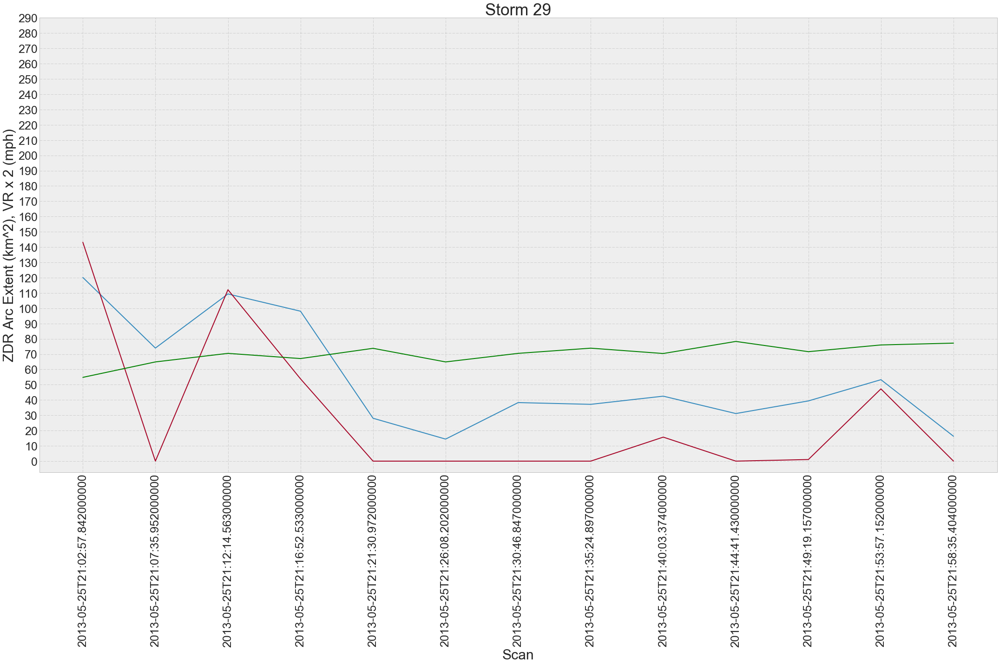

In [85]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm29_alg), 1)
ax1.plot(x, vdb_storm29, label = 'Manual')
ax1.plot(storm29_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_29*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm29_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 29', size = 35)

plt.tight_layout()

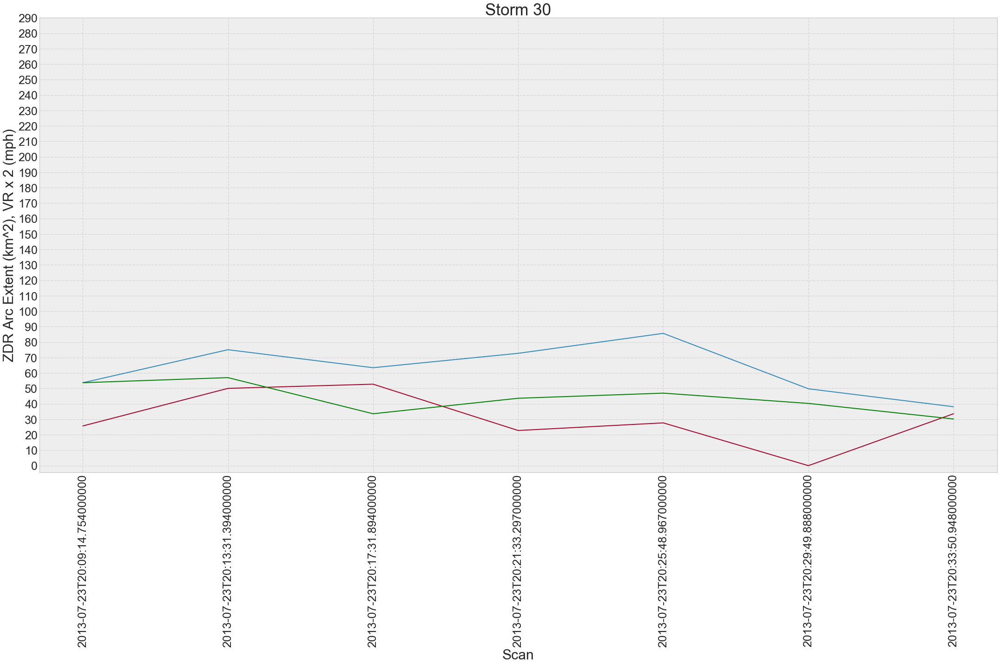

In [86]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm30_alg), 1)
ax1.plot(x, vdb_storm30, label = 'Manual')
ax1.plot(storm30_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_30*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm30_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 30', size = 35)

plt.tight_layout()

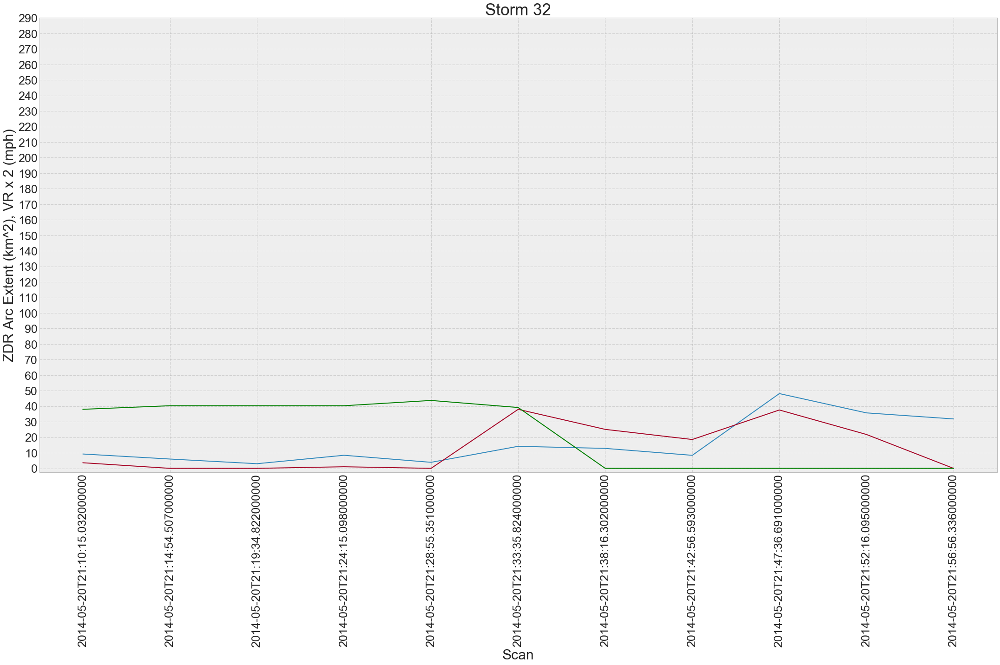

In [87]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
x = np.arange(0, len(storm32_alg), 1)
ax1.plot(x, vdb_storm32, label = 'Manual')
ax1.plot(storm32_alg, label = 'Algorithm')
#Since VDB's time series is missing 1:46, delete it from the Vr time series
#VR_W = np.delete(VR_X, 2)
ax1.plot(x, VR_32*2, label = 'VR', color='green')
ax1.set_xticks(x)
ax1.set_xticklabels(storm32_times, size=25, rotation = 90)
ax1.set_yticks(np.arange(0,300,10))
ax1.set_yticklabels(np.arange(0,300,10), size=25)
ax1.set_xlabel('Scan', size = 30)
ax1.set_ylabel('ZDR Arc Extent (km^2), VR x 2 (mph)', size = 30)
plt.title('Storm 32', size = 35)

plt.tight_layout()

In [88]:
j = 0
storm_namelist = ['A','B','BB','C','CC','D','DD','E','EE','F','FF','G','GG','H','HH','I','II','J','K','L','M','O','R','S','W','X','Y','Z']
for i in [VR_A, VR_B[0:19], VR_BB, VR_C, VR_CC, VR_D, VR_DD, VR_E[0:12], VR_EE, VR_F, VR_FF, VR_G, VR_GG, VR_H, VR_HH, VR_I, VR_II, VR_J, VR_K, VR_L, VR_M[0:4], VR_O, VR_R, VR_S, VR_W, VR_X, VR_Y, VR_Z]:
    print(len(zdr_vdb_list[j]))
    #Get correlation between Vr and ZDR
    print(storm_namelist[j], stats.pearsonr(i, zdr_vdb_list[j]))
    print(storm_namelist[j], stats.pearsonr(i, alg_list[j]))
    
    j=j+1

14
A (0.74571843168881602, 0.002198906473394437)
A (0.66569611831174602, 0.0093574374887464631)
19
B (-0.18187196467674252, 0.45615642581511662)
B (-0.50099470930513168, 0.028887119366914928)
21
BB (0.5835341677941569, 0.0054873287715393407)
BB (0.48191153919269375, 0.026953311040896828)
16
C (0.13664836844288489, 0.61381659963798629)
C (nan, 1.0)
11
CC (-0.25438965472931446, 0.45032354254471785)
CC (-0.46630902817857539, 0.14824881170465334)
7
D (0.45306124305717066, 0.30730420220041149)
D (-0.43538098052807145, 0.32888786877153442)
8
DD (-0.07400132996305428, 0.86175323142829152)
DD (0.013120159753656279, 0.97540252342338318)
12
E (-0.75211980458918937, 0.0047761997237518615)
E (-0.52881469633688061, 0.077107236358238615)
12
EE (0.54585894682006264, 0.066369834098584504)
EE (0.27213923845072097, 0.39215977421727943)
12
F (0.05523549406768162, 0.86462034559282097)
F (0.14668172027562007, 0.64918238811367379)
10
FF (0.30627566463483341, 0.38941091025378993)
FF (0.22394090500767938, 0.5

C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\stats.py:3021: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\stats.py:5277: RuntimeWarning: invalid value encountered in less
  x = np.where(x < 1.0, x, 1.0)  # if x > 1 then return 1.0


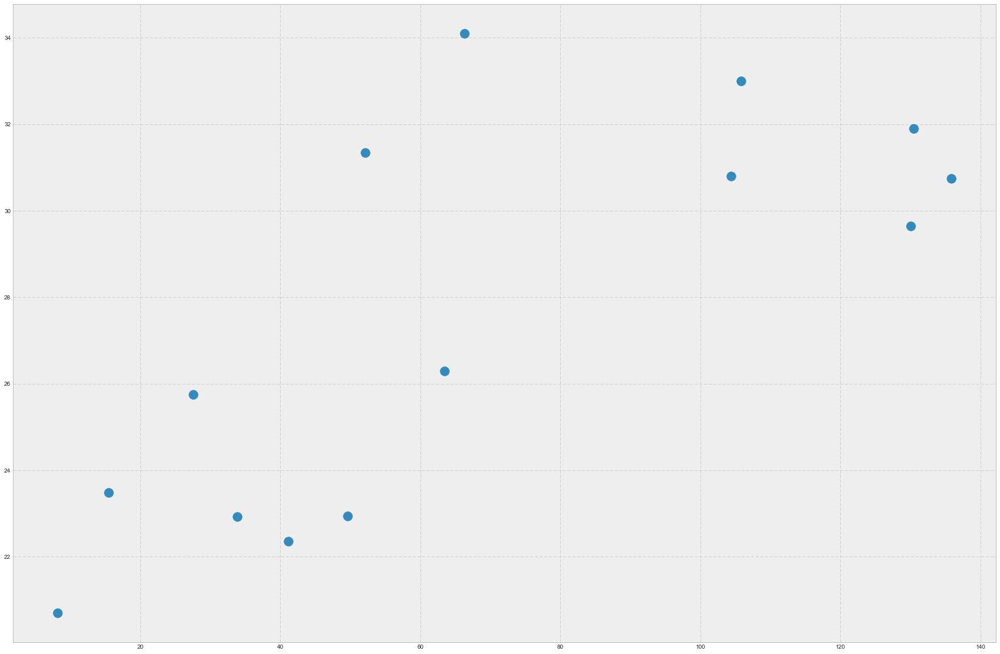

In [89]:
%matplotlib inline
n = 0
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
plt.scatter(zdr_vdb_list[n], VR_list[n], s=250)

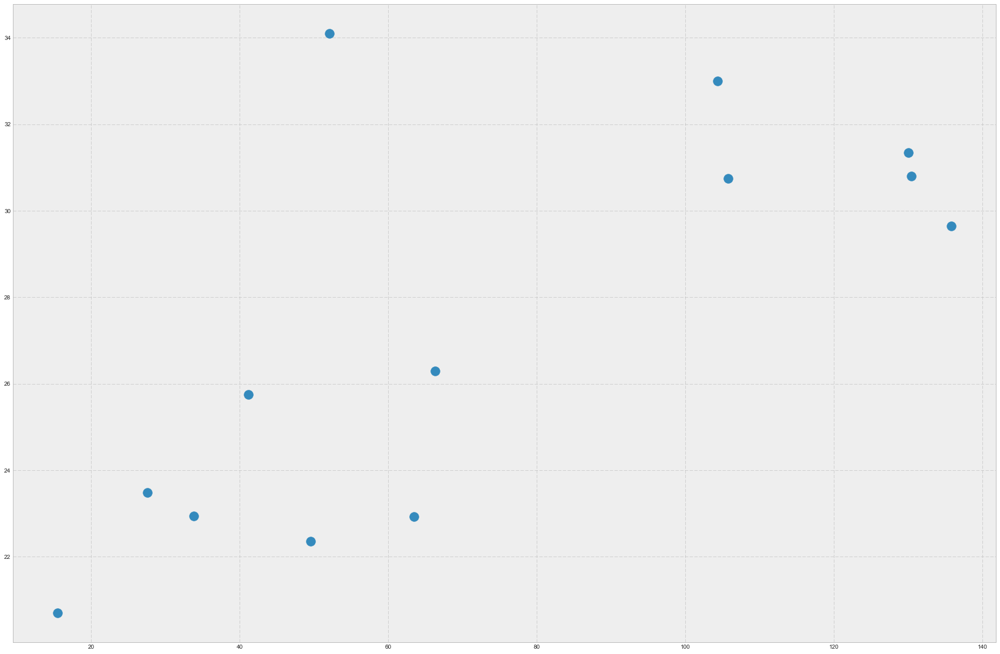

In [90]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
plt.scatter(zdr_vdb_lm1[n], VR_lm1[n], s=250)

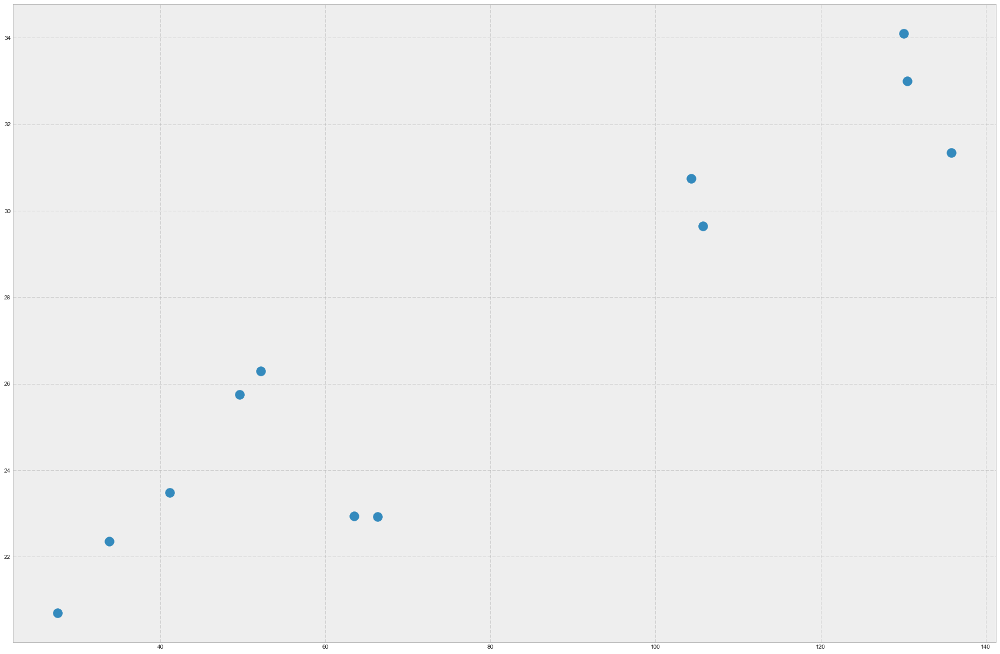

In [91]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
plt.scatter(zdr_vdb_lm2[n], VR_lm2[n], s=250)

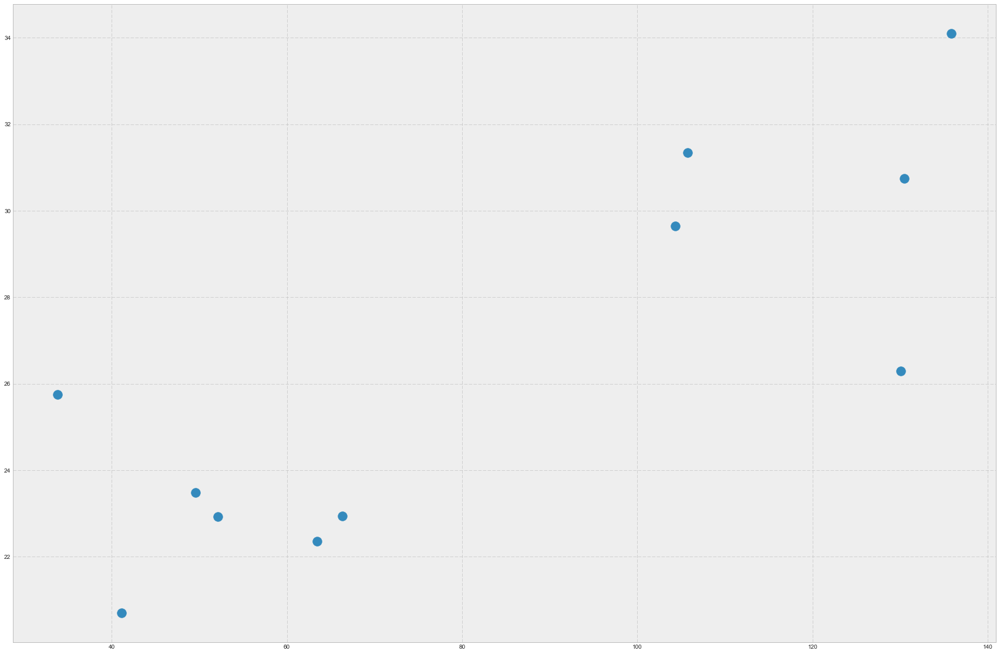

In [92]:
%matplotlib inline
plt.style.use('bmh')
fig, ax1 = plt.subplots(figsize=(30,20))
plt.scatter(zdr_vdb_lm3[n], VR_lm3[n], s=250)

In [93]:
j = 0
storm_namelist = ['A','B','BB','C','CC','D','DD','E','EE','F','FF','G','GG','H','HH','I','II','J','K','L','M','O','R','S','W','X','Y','Z']
for i in range(len(storm_namelist)):
    print(len(zdr_vdb_list[j]))
    #Get correlation between Vr and ZDR
    print(storm_namelist[j], stats.pearsonr(VR_list[j], alg_list[j]))
    print(storm_namelist[j], stats.pearsonr(VR_lm1[j], alg_lm1[j]))
    print(storm_namelist[j], stats.pearsonr(VR_lm2[j], alg_lm2[j]))
    print(storm_namelist[j], stats.pearsonr(VR_lm3[j], alg_lm3[j]))


    j=j+1

14
A (0.66569611831174602, 0.0093574374887464631)
A (0.62567920397579035, 0.022180143550893622)
A (0.81661264104348763, 0.0011899447056905193)
A (0.7813031983426163, 0.0045172457351328483)
19
B (-0.50099470930513168, 0.028887119366914928)
B (-0.27986910416539656, 0.26067244765465353)
B (-0.31300250335458862, 0.22122669689432103)
B (-0.4422194294987562, 0.086321903107761)
21
BB (0.48191153919269375, 0.026953311040896828)
BB (0.62056084746073525, 0.0035062342148802286)
BB (0.58437092004528601, 0.0086018541015039016)
BB (0.29485524741133229, 0.23491512352927046)
16
C (nan, 1.0)
C (nan, 1.0)
C (nan, 1.0)
C (nan, 1.0)
11
CC (-0.46630902817857539, 0.14824881170465334)
CC (-0.20281530435439765, 0.57414499719027368)
CC (0.00553019790736333, 0.98873426045557788)
CC (0.45753828821342601, 0.25432363079516768)
7
D (-0.43538098052807145, 0.32888786877153442)
D (-0.89970870934394476, 0.014583132372450217)
D (-0.55040846906214258, 0.33639584715680498)
D (-0.56055538700229068, 0.43944461299770932)
8
D

C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\stats.py:3021: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\stats.py:5277: RuntimeWarning: invalid value encountered in less
  x = np.where(x < 1.0, x, 1.0)  # if x > 1 then return 1.0


In [94]:
j = 0
storm_Nnamelist = ['1','2','3','4','5','6','10','13','14','15','16','19','21','22','23','24','26','27','28','29','30','32']
for i in range(len(storm_Nnamelist)):
    print(len(zdr_vdb_nt_list[j]))
    #Get correlation between Vr and ZDR
    print(storm_Nnamelist[j], stats.pearsonr(VR_Nlist[j], alg_Nlist[j]))
    print(storm_Nnamelist[j], stats.pearsonr(VR_Nlm1[j], alg_Nlm1[j]))
    print(storm_Nnamelist[j], stats.pearsonr(VR_Nlm2[j], alg_Nlm2[j]))
    print(storm_Nnamelist[j], stats.pearsonr(VR_Nlm3[j], alg_Nlm3[j]))


    j=j+1

12
1 (0.046450398169160897, 0.88601669273028605)
1 (0.28616338080497394, 0.39360766261651459)
1

C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\stats.py:3021: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\scipy\stats\stats.py:5277: RuntimeWarning: invalid value encountered in less
  x = np.where(x < 1.0, x, 1.0)  # if x > 1 then return 1.0


 (0.77603158123324223, 0.0083170451386344862)
1 (0.53733706433767237, 0.13572053692143102)
6
2 (-0.70179887693980947, 0.12012725980774785)
2 (-0.7550845796593969, 0.14003029768698635)
2 (-0.98122117853177049, 0.018778821468229519)
2 (-0.90818320997078261, 0.2749391141688371)
11
3 (-0.0029399658852124399, 0.99315521265672901)
3 (-0.42044057015913905, 0.2263466653249683)
3 (-0.11986620679342878, 0.75871544008458858)
3 (-0.42244777985977128, 0.2971036646982515)
4
4 (0.40215448370173845, 0.59784551629826155)
4 (0.83844981011842334, 0.36692462645469132)
4 (1.0, 0.0)
4 (nan, nan)
9
5 (-0.54877984730862561, 0.12598917549298419)
5 (-0.63399060440671373, 0.091393490052095738)
5 (-0.59499576747795069, 0.15875749228491828)
5 (0.18063307529945166, 0.73199726284900923)
10
6 (-0.4455235127296448, 0.19691378591670566)
6 (-0.10757790514308448, 0.78294667638168347)
6 (0.53323012929902402, 0.17354699617254335)
6 (0.68280939459151224, 0.090921757751798296)
7
10 (-0.26654907906817832, 0.56339441318673833)

In [95]:
print(len(zdr_vdb_list))
print(len(zdr_vdb_nt_list))

28
22


C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\numpy\core\_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\numpy\core\_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


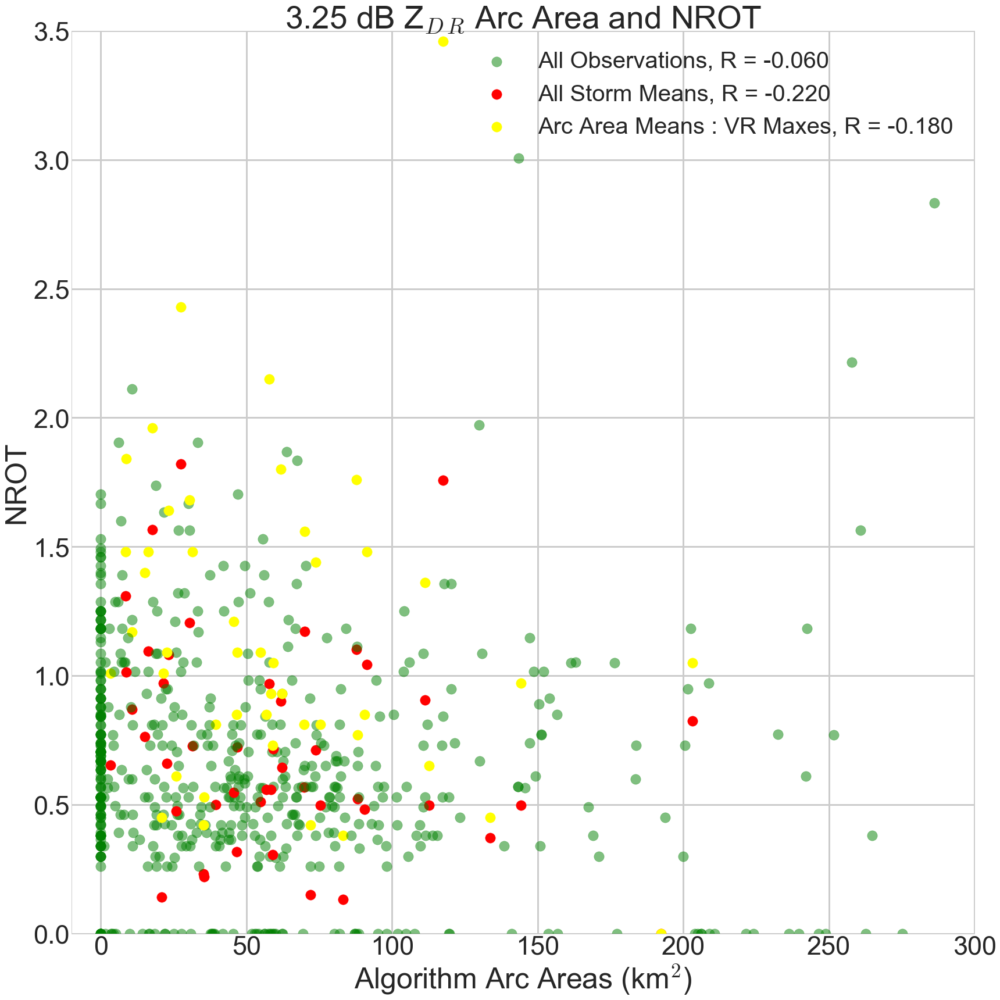

In [96]:
plt.style.use('seaborn-whitegrid')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
j = 0
for i in range(len(VR_lm1)):
    #plt.scatter(alg_lm1[i], VR_lm1[i], s=300, color='red')
    #plt.scatter(alg_lm2[i], VR_lm2[i], s=300, color='gold')
    #plt.scatter(alg_lm3[i], VR_lm3[i], s=300, color='green')
    if j == 0:
        plt.scatter(alg_list[i], NR_list[i], s=300, color='green', alpha=0.5, label = 'All Observations, R = -0.060')
        plt.scatter(np.mean(alg_list[i][alg_list[i]>0]), np.mean(NR_list[i]), s=300, color='red', label = 'All Storm Means, R = -0.220')
        plt.scatter(np.mean(alg_list[i][alg_list[i]>0]), np.max(NR_list[i]), s=300, color='yellow', label = 'Arc Area Means : VR Maxes, R = -0.180')
        #plt.legend(prop={'size':20})
        j = j + 1
    else:
        plt.scatter(alg_list[i], NR_list[i]*units('mph').to('kt'), s=300, color='green', alpha=0.5)
        plt.scatter(np.mean(alg_list[i][alg_list[i]>0]), np.mean(NR_list[i]), s=300, color='red')
        plt.scatter(np.mean(alg_list[i][alg_list[i]>0]), np.max(NR_list[i]), s=300, color='yellow')
for i in range(len(VR_Nlm1)):
    #plt.scatter(alg_Nlm1[i], VR_Nlm1[i], s=300, color='red')
    #plt.scatter(alg_Nlm2[i], VR_Nlm2[i], s=300, color='gold')
    #plt.scatter(alg_Nlm3[i], VR_Nlm3[i], s=300, color='green')
    plt.scatter(alg_Nlist[i], NR_Nlist[i], s=300, color='green', alpha=0.5)
    plt.scatter(np.mean(alg_Nlist[i][alg_Nlist[i]>0]), np.mean(NR_Nlist[i]), s=300, color='red')
    plt.scatter(np.mean(alg_Nlist[i][alg_Nlist[i]>0]), np.max(NR_Nlist[i]), s=300, color='yellow')

plt.xlabel('Algorithm Arc Areas (km$^2$)', size = 50)
plt.ylabel('NROT', size = 50)
plt.xticks(size=45)
plt.yticks(size=45)
plt.title('3.25 dB Z$_D$$_R$ Arc Area and NROT', size = 55)
plt.legend(prop={'size':40})
plt.xlim([-10,300])
plt.ylim([0,3.5])
plt.grid(True, linewidth=3)
#line = np.arange(0,300,5)
#plt.plot(line, line, linestyle='--', linewidth=4)
plt.tight_layout()
plt.savefig("ThesisNRplotAreas.png")
plt.show()

In [97]:
#Let's consolidate both algorithm time series:
alg_con_all = np.zeros((storm_alg_con.shape[0] + storm_nt_alg_con.shape[0]))
NR_con_all = np.zeros((NR_con.shape[0] + NR_Ncon.shape[0]))
alg_con_all[0:storm_alg_con.shape[0]] = storm_alg_con
alg_con_all[storm_alg_con.shape[0]:] = storm_nt_alg_con
NR_con_all[0:NR_con.shape[0]] = NR_con
NR_con_all[NR_con.shape[0]:] = NR_Ncon

#Now let's consolidate all of the means
all_alg_means = []
all_NR_means = []
all_NR_maxes = []
for i in range(len(VR_lm1)):
    all_alg_means.append(np.mean(alg_list[i][alg_list[i]>0]))
    all_NR_means.append(np.mean(NR_list[i]))
    all_NR_maxes.append(np.max(NR_list[i]))
for i in range(len(VR_Nlm1)):
    all_alg_means.append(np.mean(alg_Nlist[i][alg_Nlist[i]>0]))
    all_NR_means.append(np.mean(NR_Nlist[i]))
    all_NR_maxes.append(np.max(NR_Nlist[i]))

all_alg_means = np.asarray(all_alg_means)
all_NR_means = np.asarray(all_NR_means)
all_NR_maxes = np.asarray(all_NR_maxes)



C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\numpy\core\_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\numpy\core\_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [98]:
#from scipy import stats
print(stats.linregress(alg_con_all, NR_con_all))
print(stats.pearsonr(alg_con_all, NR_con_all)[0]**2)

print(stats.linregress(alg_con_all[alg_con_all>0], NR_con_all[alg_con_all>0]))
print(stats.pearsonr(alg_con_all[alg_con_all>0], NR_con_all[alg_con_all>0])[0]**2)

LinregressResult(slope=-0.00050470149337955095, intercept=0.74066237966644644, rvalue=-0.059971957714054898, pvalue=0.14741303665424671, stderr=0.00034791221666033613)
0.00359663571206
LinregressResult(slope=-0.00015170732240163409, intercept=0.69763491452305804, rvalue=-0.01728588195653985, pvalue=0.71858882308050442, stderr=0.00042073193543481862)
0.000298801715015


In [99]:
print(stats.linregress(all_alg_means[all_alg_means>1.0], all_NR_means[all_alg_means>1.0]))
print(stats.pearsonr(all_alg_means[all_alg_means>1.0], all_NR_means[all_alg_means>1.0])[0]**2)

LinregressResult(slope=-0.0019984990652358787, intercept=0.8459564110543758, rvalue=-0.22044770209742043, pvalue=0.14097188622785059, stderr=0.0013330739753104552)
0.04859718936


C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


In [100]:
print(stats.linregress(all_alg_means[all_alg_means>1.0], all_NR_maxes[all_alg_means>1.0]))
print(stats.pearsonr(all_alg_means[all_alg_means>1.0], all_NR_maxes[all_alg_means>1.0])[0]**2)

LinregressResult(slope=-0.0024584285852967537, intercept=1.3113630311794902, rvalue=-0.18010924178829624, pvalue=0.23100764170284005, stderr=0.0020241111726387621)
0.0324393389776


C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


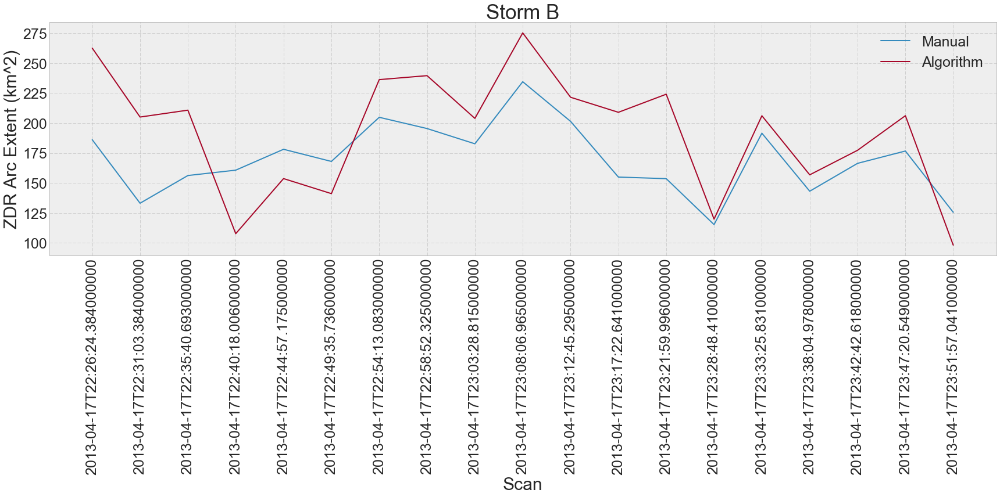

In [101]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormB_alg), 1)
#Only use VDB's 0-19 frames, sinc e23:57 is missing from the AWS dataset
plt.plot(x, vdb_stormB, label = 'Manual')
plt.plot(x, stormB_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormB_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm B', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

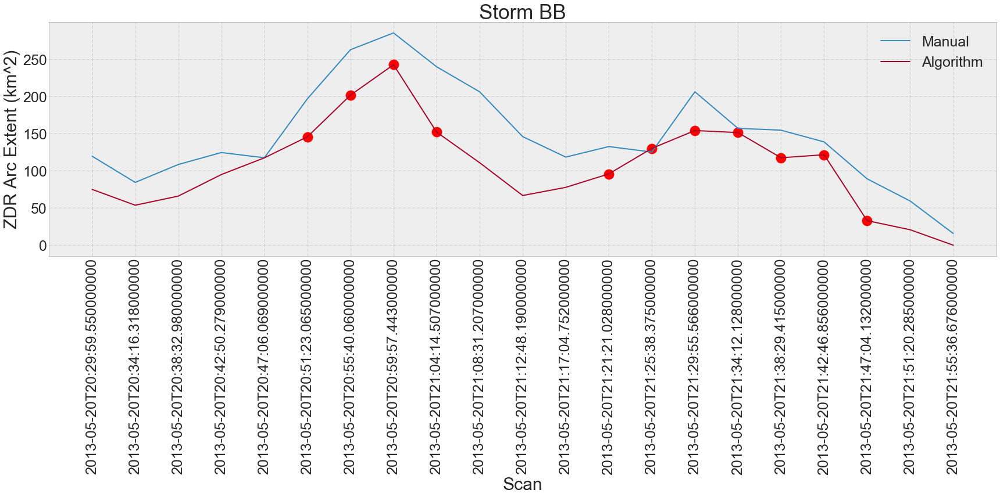

In [102]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormBB_alg), 1)
plt.plot(x, vdb_stormBB, label = 'Manual')
plt.plot(x, stormBB_alg, label = 'Algorithm')
plt.xticks(x, stormBB_times, size=25, rotation = 90)
#plt.plot(x, stormA_alg3)
plt.xticks(x, size=25)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm BB', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
stormBB_tor = np.asarray([0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,1,1,1,1,0,0])
plt.scatter(x[stormBB_tor==1], stormBB_alg[stormBB_tor==1], s=300, color='r')
plt.show()

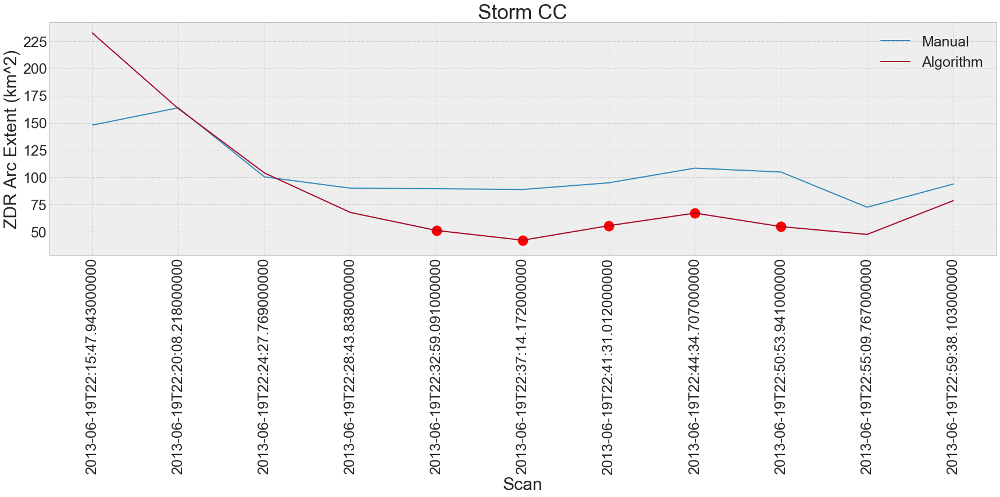

In [103]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormCC_alg), 1)
plt.plot(x, vdb_stormCC, label = 'Manual')
plt.plot(x, stormCC_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormCC_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm CC', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
stormCC_tor = np.asarray([0,0,0,0,1,1,1,1,1,0,0])
plt.scatter(x[stormCC_tor==1], stormCC_alg[stormCC_tor==1], s=300, color='r')
plt.show()

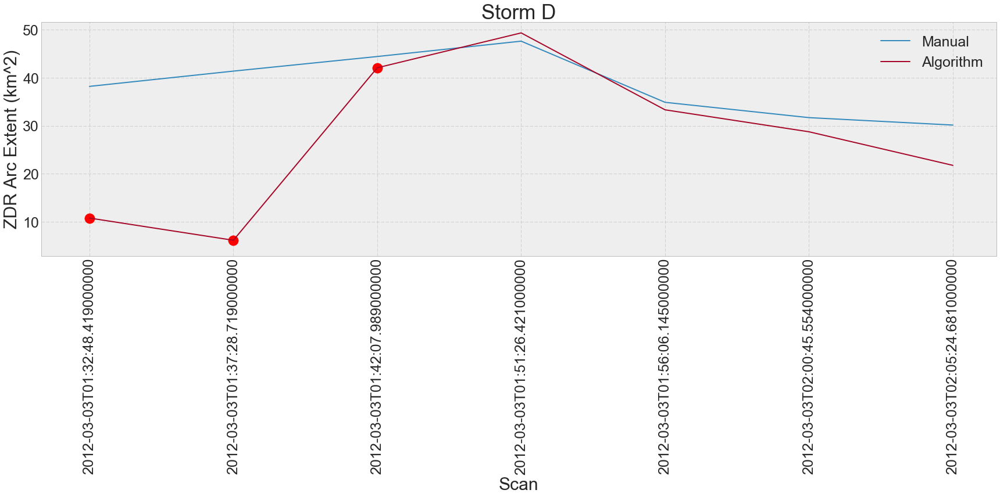

In [104]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormD_alg), 1)
plt.plot(x, vdb_stormD, label = 'Manual')
plt.plot(x, stormD_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormD_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm D', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
#Make a binary tornadic/nontornadic mask array (1=tor)
stormD_tor = np.asarray([1,1,1,0,0,0,0])
plt.scatter(x[stormD_tor==1], stormD_alg[stormD_tor==1], s=300, color='r')
plt.show()

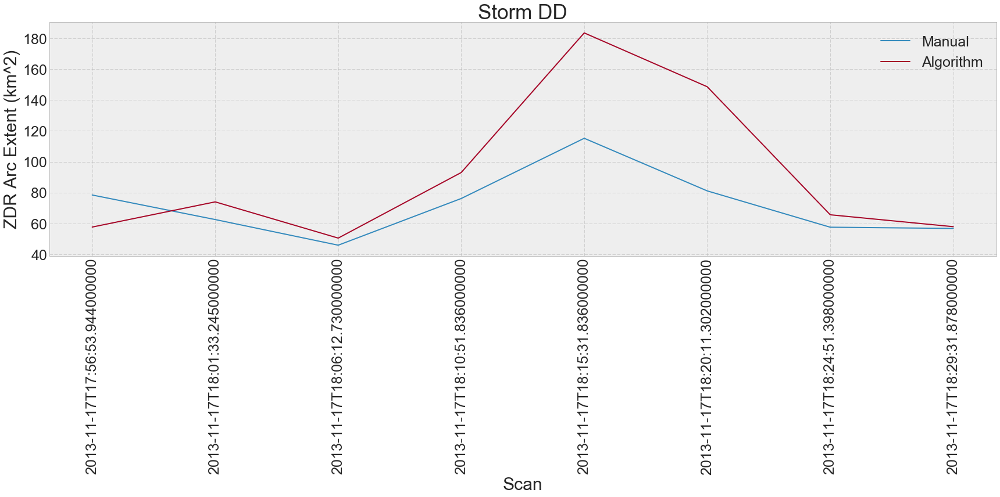

In [105]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormDD_alg), 1)
plt.plot(x, vdb_stormDD, label = 'Manual')
plt.plot(x, stormDD_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormDD_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm DD', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

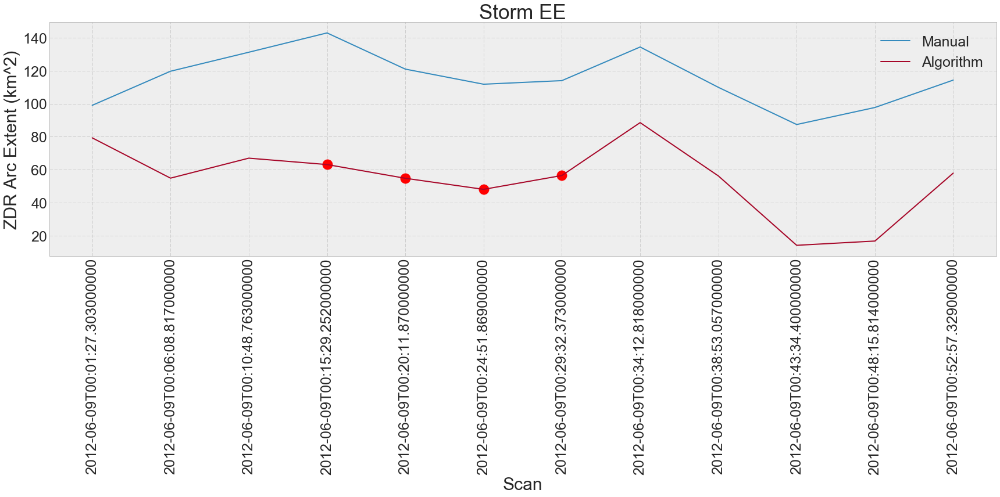

In [106]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormEE_alg_c), 1)
plt.plot(x, vdb_stormEE, label = 'Manual')
plt.plot(x, stormEE_alg_c, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormEE_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm EE', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
stormEE_tor = np.asarray([0,0,0,1,1,1,1,0,0,0,0,0])
plt.scatter(x[stormEE_tor==1], stormEE_alg_c[stormEE_tor==1], s=300, color='r')
plt.show()

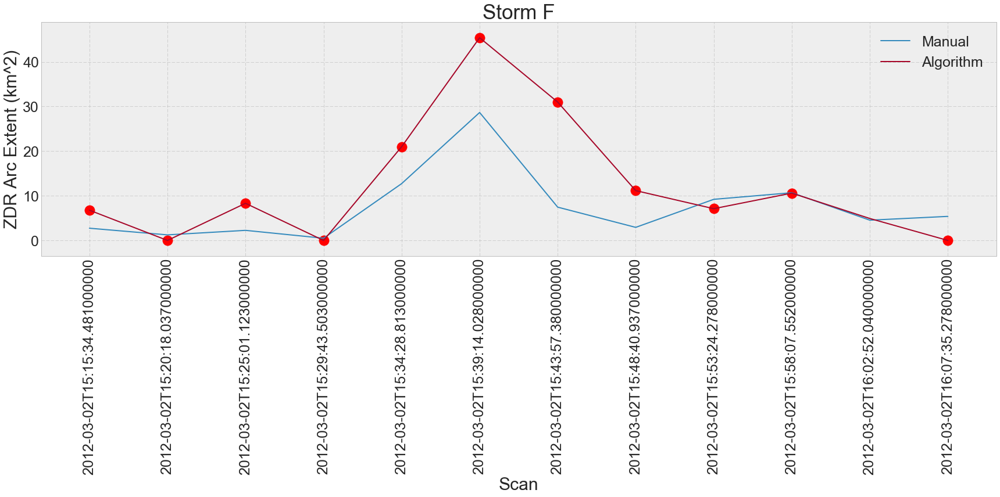

In [107]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormF_alg), 1)
plt.plot(x, vdb_stormF, label = 'Manual')
plt.plot(x, stormF_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormF_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm F', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')\
stormF_tor = np.asarray([1,1,1,1,1,1,1,1,1,1,0,1])
plt.scatter(x[stormF_tor==1], stormF_alg[stormF_tor==1], s=300, color='r')
plt.show()

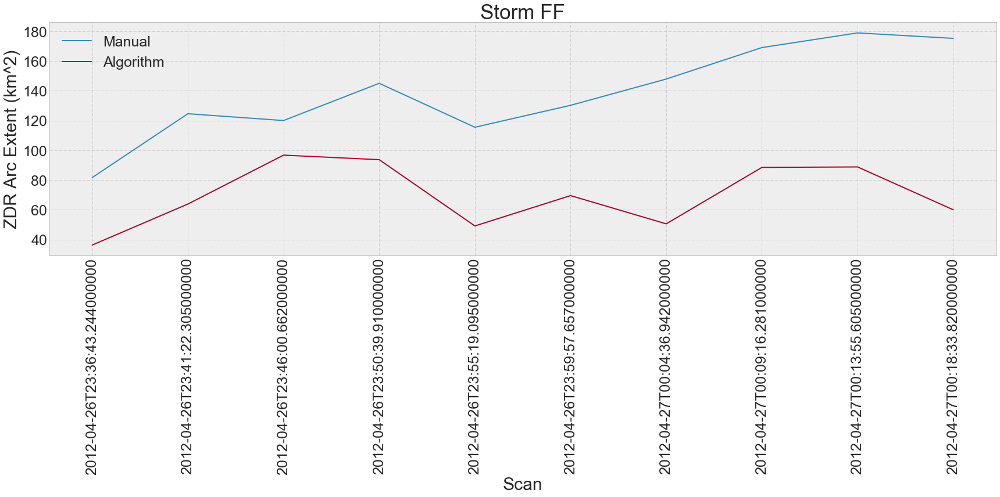

In [108]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormFF_alg), 1)
plt.plot(x, vdb_stormFF_c, label = 'Manual')
plt.plot(x, stormFF_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormFF_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm FF', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

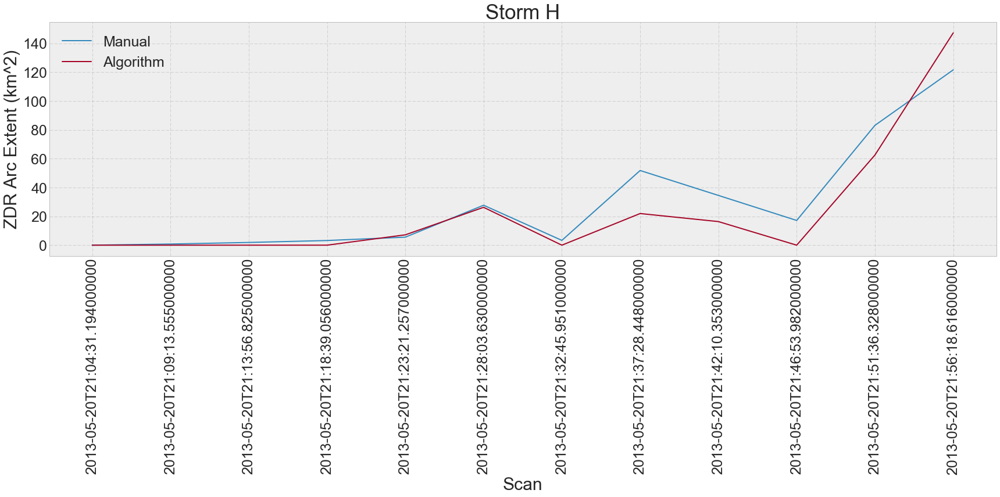

In [109]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormH_alg), 1)
plt.plot(x, vdb_stormH, label = 'Manual')
plt.plot(x, stormH_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormH_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm H', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

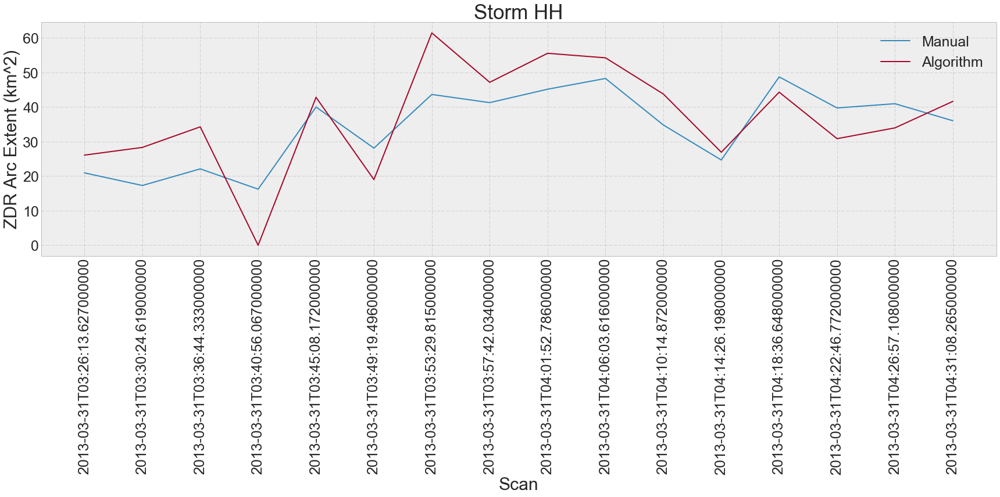

In [110]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormHH_alg), 1)
plt.plot(x, vdb_stormHH, label = 'Manual')
plt.plot(x, stormHH_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormHH_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm HH', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

C:\Users\matts\Miniconda3\envs\devel\lib\site-packages\ipykernel_launcher.py:18: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 21 but corresponding boolean dimension is 20


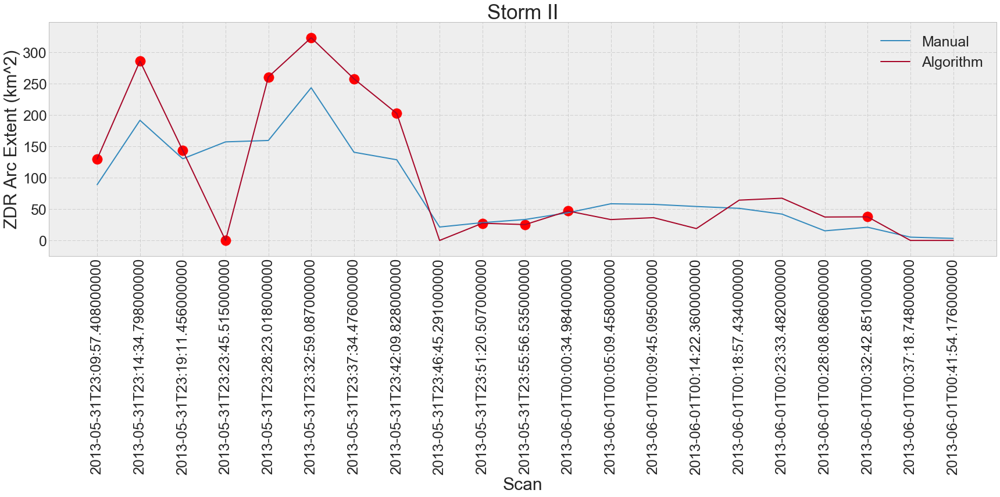

In [111]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormII_alg), 1)
plt.plot(x, vdb_stormII_c, label = 'Manual')
plt.plot(x, stormII_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormII_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm II', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
stormII_tor = np.asarray([1,1,1,1,1,1,1,1,0,1,1,1,0,0,0,0,0,0,1,0])
plt.scatter(x[stormII_tor==1], stormII_alg[stormII_tor==1], s=300, color='r')
plt.show()

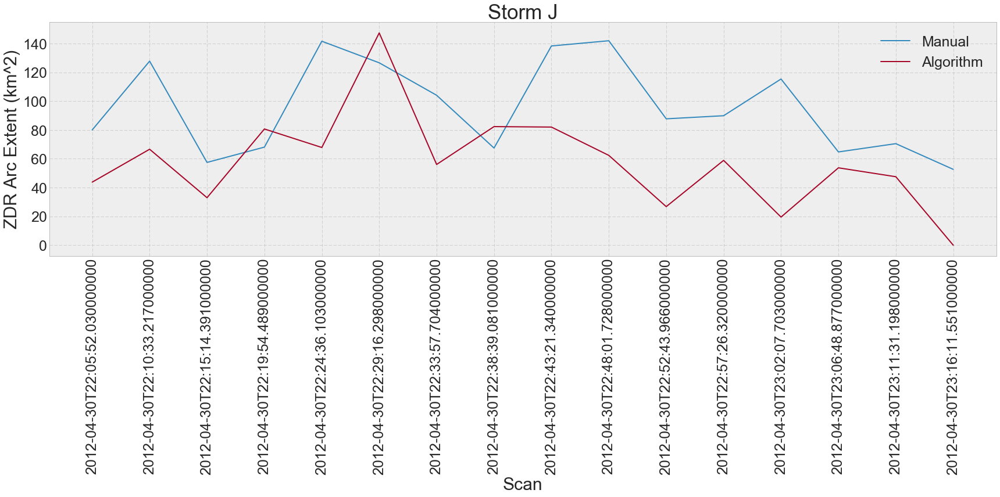

In [112]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormJ_alg), 1)
plt.plot(x, vdb_stormJ, label = 'Manual')
plt.plot(x, stormJ_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormJ_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm J', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

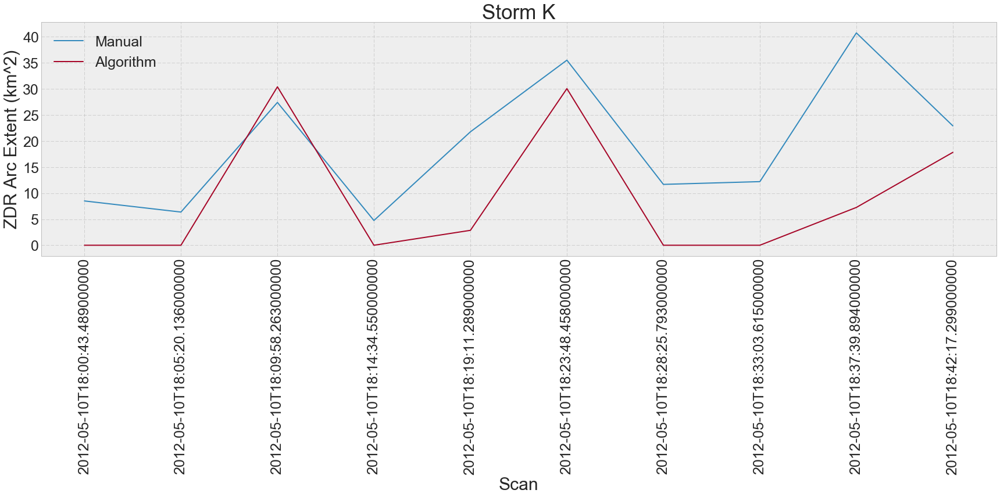

In [113]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormK_alg), 1)
plt.plot(x, vdb_stormK, label = 'Manual')
plt.plot(x, stormK_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormK_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm K', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

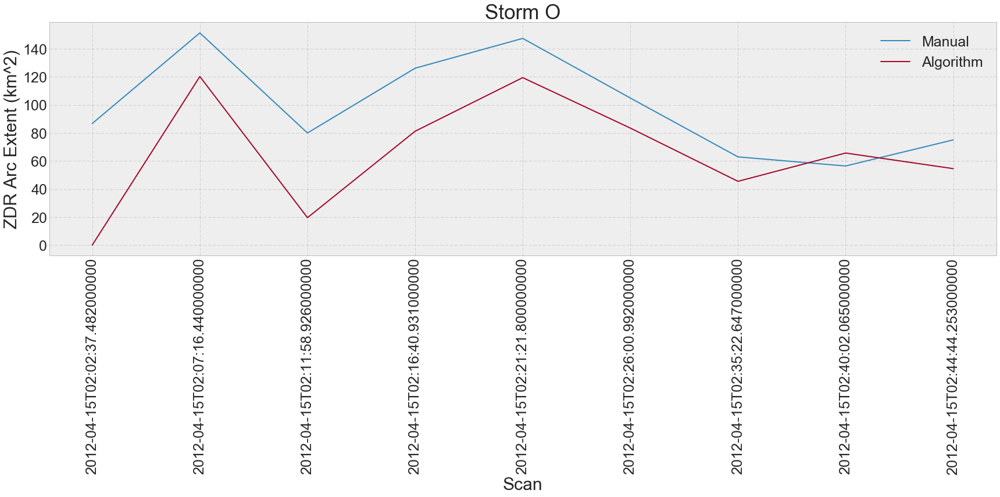

In [114]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormO_alg), 1)
plt.plot(x, vdb_stormO, label = 'Manual')
plt.plot(x, stormO_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormO_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm O', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
stormO_tor = np.asarray([0,0,0,0,0,0,0,0,0])
plt.scatter(x[stormO_tor==1], stormO_alg[stormO_tor==1], s=300, color='r')
plt.show()

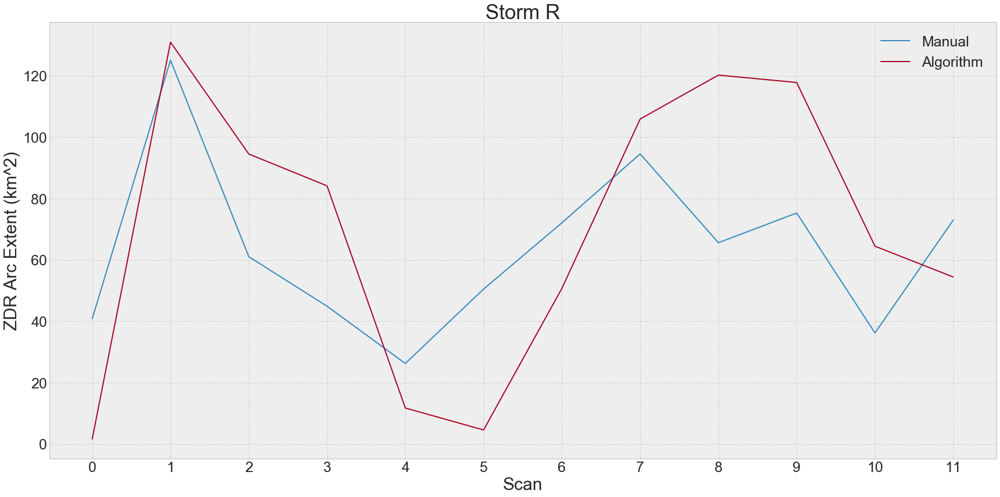

In [115]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormR_alg), 1)
plt.plot(x, vdb_stormR_c, label = 'Manual')
plt.plot(x, stormR_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x,size=25)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm R', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormR1.png')
#stormR_tor = np.asarray([0,0,1,0,0,0,0,1,1,1,0])
#plt.scatter(x[stormR_tor==1], stormR_alg[stormR_tor==1], s=300, color='r')
plt.show()

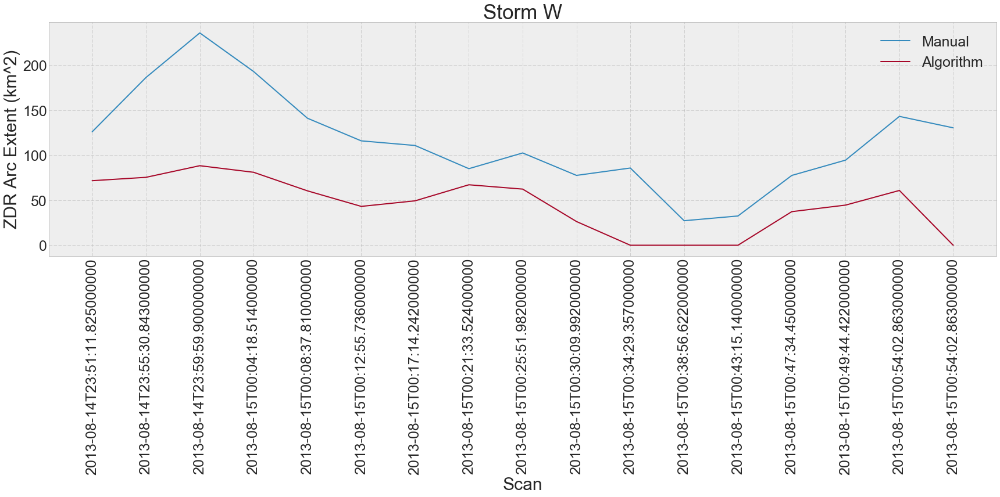

In [116]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormW_alg), 1)
plt.plot(x, vdb_stormW_c, label = 'Manual')
plt.plot(x, stormW_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormW_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm W', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

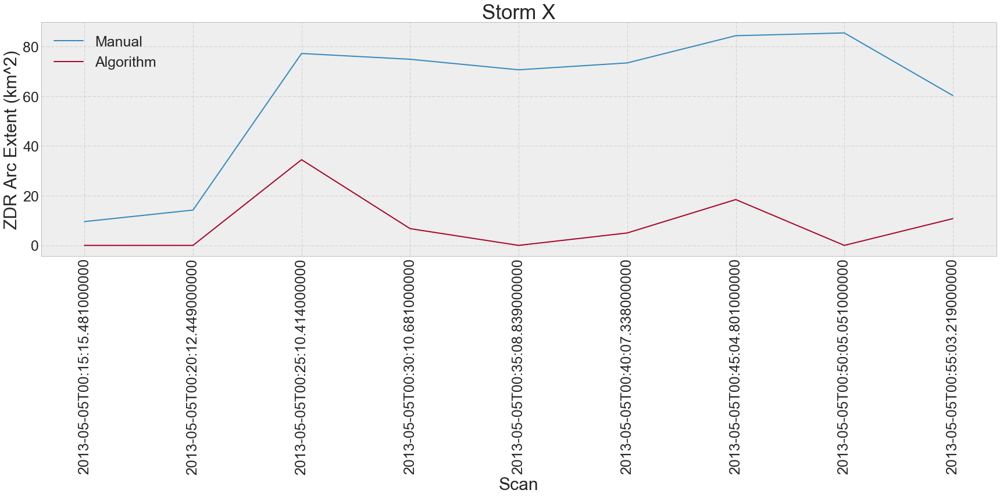

In [117]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormX_alg), 1)
plt.plot(x, vdb_stormX, label = 'Manual')
plt.plot(x, stormX_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormX_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm X', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

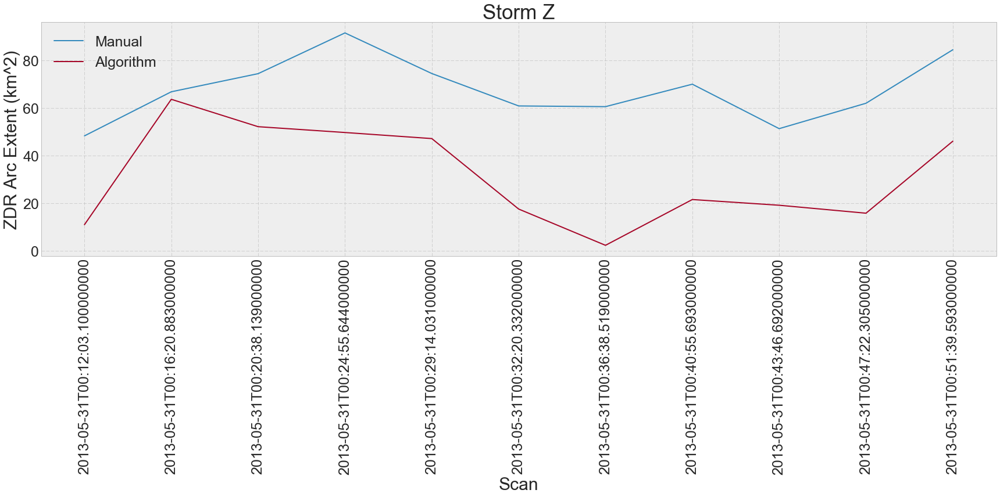

In [118]:
plt.style.use('bmh')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 12))
x = np.arange(0, len(stormZ_alg), 1)
plt.plot(x, vdb_stormZ, label = 'Manual')
plt.plot(x, stormZ_alg, label = 'Algorithm')
#plt.plot(x, stormA_alg3)
plt.xticks(x, stormZ_times, size=25, rotation = 90)
plt.yticks(size=25)
plt.xlabel('Scan', size = 30)
plt.ylabel('ZDR Arc Extent (km^2)', size = 30)
plt.title('Storm Z', size = 35)
plt.legend(prop={'size':25})
plt.tight_layout()
#plt.savefig('ZDR_algorithm_comparison_StormA.png')
plt.show()

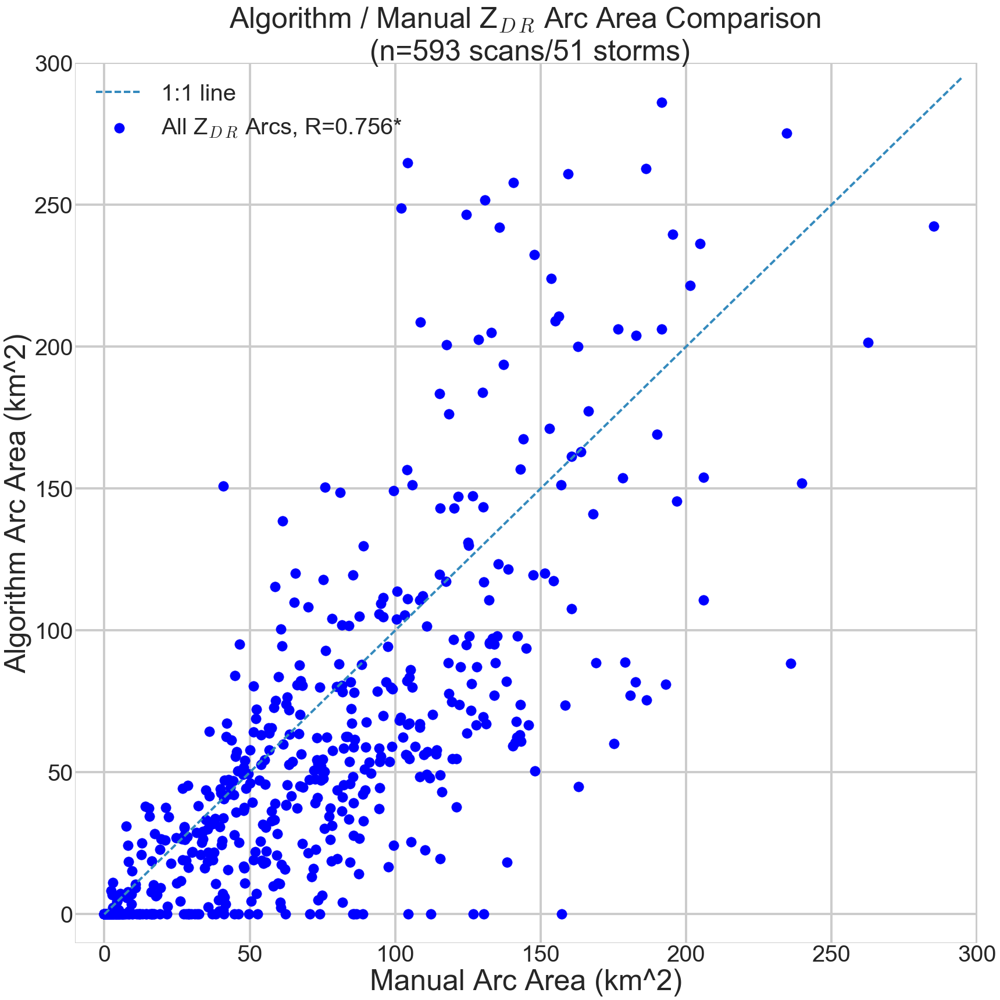

In [119]:
plt.style.use('seaborn-whitegrid')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
plt.scatter(vdb_stormA, stormA_alg, s=300, color='b')
plt.scatter(vdb_stormB[0:19], stormB_alg, s=300, color='b')
plt.scatter(vdb_stormBB, stormBB_alg, s=300, color='b')
plt.scatter(vdb_stormC, stormC_alg, s=300, color='b')
plt.scatter(vdb_stormCC, stormCC_alg, s=300, color='b')
plt.scatter(vdb_stormD, stormD_alg, s=300, color='b')
plt.scatter(vdb_stormDD, stormDD_alg, s=300, color='b')
plt.scatter(vdb_stormE, stormE_alg, s=300, color='b')
plt.scatter(vdb_stormEE, stormEE_alg_c, s=300, color='b')
plt.scatter(vdb_stormF, stormF_alg, s=300, color='b')
plt.scatter(vdb_stormFF_c, stormFF_alg, s=300, color='b')
plt.scatter(vdb_stormG, stormG_alg, s=300, color='b')
plt.scatter(vdb_stormGG, stormGG_alg, s=300, color='b')
plt.scatter(vdb_stormH, stormH_alg, s=300, color='b')
plt.scatter(vdb_stormHH, stormHH_alg, s=300, color='b')
plt.scatter(vdb_stormI, stormI_alg, s=300, color='b')
plt.scatter(vdb_stormII_c, stormII_alg, s=300, color='b')
plt.scatter(vdb_stormJ, stormJ_alg, s=300, color='b')
plt.scatter(vdb_stormK, stormK_alg, s=300, color='b')
plt.scatter(vdb_stormL, stormL_alg, s=300, color='b')
plt.scatter(vdb_stormM[0:4], stormM_alg, s=300, color='b')
plt.scatter(vdb_stormO, stormO_alg, s=300, color='b')
plt.scatter(vdb_stormR_c, stormR_alg, s=300, color='b')
plt.scatter(vdb_stormS, stormS_alg, s=300, color='b')
plt.scatter(vdb_stormW_c, stormW_alg, s=300, color='b')
plt.scatter(vdb_stormX, stormX_alg, s=300, color='b')
plt.scatter(vdb_stormY, stormY_alg, s=300, color='b')
plt.scatter(vdb_stormZ, stormZ_alg, s=300, color='b')

plt.scatter(vdb_storm1, storm1_alg, s=300, color='b', label='All Z$_D$$_R$ Arcs, R=0.756*')
plt.scatter(vdb_storm2, storm2_alg, s=300, color='b')
plt.scatter(vdb_storm3, storm3_alg, s=300, color='b')
plt.scatter(vdb_storm4, storm4_alg, s=300, color='b')
plt.scatter(vdb_storm5_c, storm5_alg, s=300, color='b')
plt.scatter(vdb_storm6_c, storm6_alg, s=300, color='b')
#plt.scatter(vdb_storm7, storm7_alg, s=300, color='b')
plt.scatter(vdb_storm10, storm10_alg[::2], s=300, color='b')
plt.scatter(vdb_storm13, storm13_alg, s=300, color='b')
plt.scatter(vdb_storm14, storm14_alg, s=300, color='b')
plt.scatter(vdb_storm15, storm15_alg, s=300, color='b')
plt.scatter(vdb_storm16, storm16_alg, s=300, color='b')
plt.scatter(vdb_storm19, storm19_alg, s=300, color='b')
plt.scatter(vdb_storm21, storm21_alg[::2], s=300, color='b')
plt.scatter(vdb_storm22_c, storm22_alg, s=300, color='b')
plt.scatter(vdb_storm23, storm23_alg, s=300, color='b')
plt.scatter(vdb_storm24, storm24_alg, s=300, color='b')
plt.scatter(vdb_storm26_c, storm26_alg, s=300, color='b')
plt.scatter(vdb_storm27_c, storm27_alg_c, s=300, color='b')
plt.scatter(vdb_storm28, storm28_alg, s=300, color='b')
plt.scatter(vdb_storm29, storm29_alg, s=300, color='b')
plt.scatter(vdb_storm30, storm30_alg, s=300, color='b')
plt.scatter(vdb_storm32, storm32_alg, s=300, color='b')

plt.xlabel('Manual Arc Area (km^2)', size = 50)
plt.ylabel('Algorithm Arc Area (km^2)', size = 50)
plt.xticks(size=40)
plt.yticks(size=40)
plt.title('Algorithm / Manual Z$_D$$_R$ Arc Area Comparison \n (n=593 scans/51 storms)', size = 50)
plt.xlim([-10,300])
plt.ylim([-10,300])
line = np.arange(0,300,5)
plt.plot(line, line, linestyle='--', linewidth=4, label='1:1 line')
plt.legend(prop={'size':40})
plt.tight_layout()
plt.grid(True, linewidth=4)
#plt.savefig("AlgorithmTorNonCalAll325.png")
plt.show()

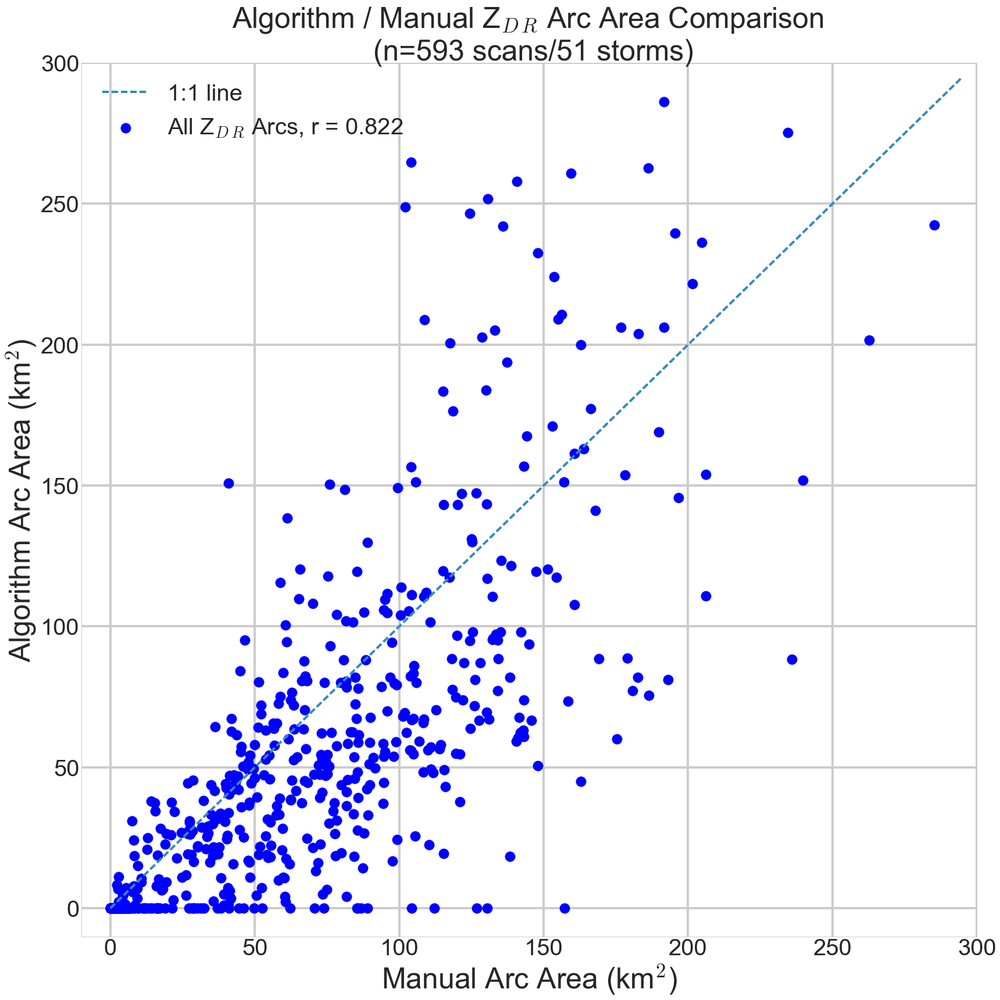

In [122]:
plt.style.use('seaborn-whitegrid')
#plt.title('21 UTC NARR Sounding 31 May 1985 Wheatland, PA')
# Change default to be better for skew-T
fig = plt.figure(figsize=(24, 24))
plt.scatter(vdb_stormA, stormA_alg, s=300, color='b')
plt.scatter(vdb_stormB[0:19], stormB_alg, s=300, color='b')
plt.scatter(vdb_stormBB, stormBB_alg, s=300, color='b')
plt.scatter(vdb_stormC, stormC_alg, s=300, color='b')
plt.scatter(vdb_stormCC, stormCC_alg, s=300, color='b')
plt.scatter(vdb_stormD, stormD_alg, s=300, color='b')
plt.scatter(vdb_stormDD, stormDD_alg, s=300, color='b')
plt.scatter(vdb_stormE, stormE_alg, s=300, color='b')
plt.scatter(vdb_stormEE, stormEE_alg_c, s=300, color='b')
plt.scatter(vdb_stormF, stormF_alg, s=300, color='b')
plt.scatter(vdb_stormFF_c, stormFF_alg, s=300, color='b')
plt.scatter(vdb_stormG, stormG_alg, s=300, color='b')
plt.scatter(vdb_stormGG, stormGG_alg, s=300, color='b')
plt.scatter(vdb_stormH, stormH_alg, s=300, color='b')
plt.scatter(vdb_stormHH, stormHH_alg, s=300, color='b')
plt.scatter(vdb_stormI, stormI_alg, s=300, color='b')
plt.scatter(vdb_stormII_c, stormII_alg, s=300, color='b')
plt.scatter(vdb_stormJ, stormJ_alg, s=300, color='b')
plt.scatter(vdb_stormK, stormK_alg, s=300, color='b')
plt.scatter(vdb_stormL, stormL_alg, s=300, color='b')
plt.scatter(vdb_stormM[0:4], stormM_alg, s=300, color='b')
plt.scatter(vdb_stormO, stormO_alg, s=300, color='b')
plt.scatter(vdb_stormR_c, stormR_alg, s=300, color='b')
plt.scatter(vdb_stormS, stormS_alg, s=300, color='b')
plt.scatter(vdb_stormW_c, stormW_alg, s=300, color='b')
plt.scatter(vdb_stormX, stormX_alg, s=300, color='b')
plt.scatter(vdb_stormY, stormY_alg, s=300, color='b')
plt.scatter(vdb_stormZ, stormZ_alg, s=300, color='b')

plt.scatter(vdb_storm1, storm1_alg, s=300, color='b', label='All Z$_D$$_R$ Arcs, r = 0.822')
plt.scatter(vdb_storm2, storm2_alg, s=300, color='b')
plt.scatter(vdb_storm3, storm3_alg, s=300, color='b')
plt.scatter(vdb_storm4, storm4_alg, s=300, color='b')
plt.scatter(vdb_storm5_c, storm5_alg, s=300, color='b')
plt.scatter(vdb_storm6_c, storm6_alg, s=300, color='b')
#plt.scatter(vdb_storm7, storm7_alg, s=300, color='b')
plt.scatter(vdb_storm10, storm10_alg[::2], s=300, color='b')
plt.scatter(vdb_storm13, storm13_alg, s=300, color='b')
plt.scatter(vdb_storm14, storm14_alg, s=300, color='b')
plt.scatter(vdb_storm15, storm15_alg, s=300, color='b')
plt.scatter(vdb_storm16, storm16_alg, s=300, color='b')
plt.scatter(vdb_storm19, storm19_alg, s=300, color='b')
plt.scatter(vdb_storm21, storm21_alg[::2], s=300, color='b')
plt.scatter(vdb_storm22_c, storm22_alg, s=300, color='b')
plt.scatter(vdb_storm23, storm23_alg, s=300, color='b')
plt.scatter(vdb_storm24, storm24_alg, s=300, color='b')
plt.scatter(vdb_storm26_c, storm26_alg, s=300, color='b')
plt.scatter(vdb_storm27_c, storm27_alg_c, s=300, color='b')
plt.scatter(vdb_storm28, storm28_alg, s=300, color='b')
plt.scatter(vdb_storm29, storm29_alg, s=300, color='b')
plt.scatter(vdb_storm30, storm30_alg, s=300, color='b')
plt.scatter(vdb_storm32, storm32_alg, s=300, color='b')

plt.xlabel('Manual Arc Area (km$^2$)', size = 50)
plt.ylabel('Algorithm Arc Area (km$^2$)', size = 50)
plt.xticks(size=40)
plt.yticks(size=40)
plt.title('Algorithm / Manual Z$_D$$_R$ Arc Area Comparison \n (n=593 scans/51 storms)', size = 50)
#plt.title('Algorithm / Manual Z$_D$$_R$ Arc Area Comparison \n (n=593 scans/51 storms)', size = 50)
plt.xlim([-10,300])
plt.ylim([-10,300])
line = np.arange(0,300,5)
plt.plot(line, line, linestyle='--', linewidth=4, label='1:1 line')
plt.legend(prop={'size':40})
plt.tight_layout()
plt.grid(True, linewidth=4)
#plt.savefig("Manuscript_allalgcomp.png")
plt.show()